1. About Dataset
2. Data Summary
3. Feature Engineering
4. Missing Value Analysis
5. Outlier Analysis
6. Correlation Analysis
7. Visualizing Distribution Of Data
8. Visualizing Count Vs (Month,Season,Hour,Weekday,Usertype)


# About Dataset

<h3>Divvy is a bicycle sharing system in the City of Chicago and two adjacent suburbs operated by Motivate for the Chicago Department of Transportation. It operates 5800 bicycles at 580 stations in an area bounded by 87th Street on the south, Central Street in Evanston on the north, Rainbow Beach Park near South Shore Drive on the east, and Harlem Avenue in Oak Park on the west (from Wikipedia). Since the data is related to people’s daily life, exploring it can help us find some interesting phenomena.</h3>

Divvy Bikes came to Chicago in 2013 and celebrated their ten millionth trip in early 2017. There are stations located all over the city and you can get a 1 day pass for 10 dollars or a yearly membership for 100 dollars. Each time you check out a bike, you have 30 minutes to return it to any station before late fees apply. You can check out as many 30 minute blocks as your pass permits.

Empty and full stations pose a major problem in the Divvy system. After all, bike share really only needs two things to work: a bike to ride and a dock to leave the bike.Divvy only considers the current number of bikes at each station.

Divvy, like other bike share programs in the US, has a solution: use trucks to rebalance the stations, carrying bikes from full racks to empty ones. The issue is that the trucks do the rebalancing reactively — waiting for a pile up before swooping in to save the day — rather than acting preventively.


# Data Summary

### Import libraries

In [1]:
# data manipulation # data  
import numpy as np
import pandas as pd
import calendar
# plotting
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
%config InlineBackend.figure_format = 'retina'
import datetime as dt
import folium
from folium import plugins
print(folium.__version__)

from shapely.geometry import Point # Shapely for converting latitude/longtitude to geometry
import geopandas as gpd # To create GeodataFrame\

# pandas display data frames as tables
from IPython.display import display, HTML

0.6.0


### User Defined Functions

In [2]:
#FUNCTIONS
def make_categorical(df,col_name):
 df.loc[:,col_name]   = pd.Categorical(df[col_name])

def mem_mib(df):
    print("{0:.2f} GB".format(
        df.memory_usage().sum() / (1024 * 1024 *1024)
    ))

def month_number_to_name(df,col_name):
    df[col_name] = df[col_name].apply(lambda x: calendar.month_abbr[x])

#months = {datetime.datetime(2000,i,1).strftime("%b"): i for i in range(1, 13)}
#from time import strptime
#divvy_dataset_orig['month'].apply(lambda x: strptime(x,'%b').tm_mon)

def drop_columns_with_suffix(df):
    # list comprehension of the cols that end with '_y'
    to_drop = [x for x in df if x.endswith('_y')]
    df.drop(to_drop, axis=1, inplace=True)
    to_drop = [x for x in df if x.endswith('_x')]
    df.drop(to_drop, axis=1, inplace=True)

    
import math

def roundup(x):
    return int(math.ceil(x / 10.0)) * 10

### Load the Divvy Data set

In [3]:
#parse_dates = true to read dates automatically
divvyTrips =pd.read_csv('Social_Economic_Info_By_Zipcode/MergedData/divvy_trips_zipcode_stationdistance.csv',parse_dates=True)

#Ensure the dataframe has no duplicates
divvyTrips = divvyTrips.drop_duplicates()

#Drop unnamed columns
divvyTrips.drop(['Unnamed: 0','Unnamed: 0.1'],axis=1,inplace=True)

#Add start and stop dates
divvyTrips.starttime = pd.to_datetime(divvyTrips.starttime)
divvyTrips.stoptime = pd.to_datetime(divvyTrips.starttime)

divvyTrips['startdate'] = divvyTrips.starttime.dt.date
divvyTrips['stopdate'] = divvyTrips.stoptime.dt.date


### Determine dataset size, shape and check for missing values

In [4]:
#Drop Columns with _x or _y in the dataset
#divvyTrips.info()
mem_mib(divvyTrips)
divvyTrips.shape
#13774654 rows, 50 columns
#divvy_dataset.columns

#Check for NULL values in the data frame#
divvyTrips.isnull().values.any()
#####False

#How many NULL values in the dataset#a
#print (divvyTrips.isnull().sum())

#Replace missing values with a number#
#divvy_dataset['gender'].fillna(125, inplace=True)

6.16 GB


True

There are 13774654 rows, 50 columns in this dataset with file size of ~6GB. 

We have identified these columns with missing values. Let's identify irrelevant columns before addressing missing values

gender                       3756910
latitude_start                  1153
longitude_start                 1153
dpcapacity_start                1153
latitude_end                    1180
longitude_end                   1180
dpcapacity_end                  1180
humidity                         920
zipcode_start                4302474
zipcode_end                  4283942
start_station                6754541
end_station                  6754541
distance_in_meters           6920850
city                        11765376
station_start               11765376
station_end                 11765376
distance_meters_by_coord    11765376
station_start_latitude      11765376
station_start_longitude     11765376
station_end_latitude        11765376
station_end_longitude       11765376
start_station_group             1153
end_station_group               1180
revenue                      7419523

### All the columns to keep for analysis

In [5]:
#Keep the columns needed for analysis

columns_to_keep = [
'trip_id'
,'usertype'
,'gender'
,'starttime'
,'stoptime'
,'startdate'
,'stopdate'
,'tripduration'
,'from_station_id'
,'to_station_id'
,'from_station_name'
,'to_station_name'
,'dpcapacity_start'
,'latitude_start'
,'longitude_start'
,'latitude_end'
,'longitude_end'
,'dpcapacity_end'
,'temperature'
,'windchill'
,'dewpoint'
,'humidity'
,'pressure'
,'visibility'
,'wind_speed'
,'precipitation'
,'events'
,'rain'
,'conditions'
,'zipcode_start'
,'zipcode_end'
,'distance_in_meters'
,'Year'
,'Month'
,'Day'
,'DayOfWeek'
,'DayName'
,'DayOfYear'
,'WeekOfYear'
,'Quarter'
,'month_name'
,'months-year'
,'tripInMinutes'
,'start_station_group'
,'end_station_group'
,'Hour'
,'season'
,'TypeOfDay'
]
divvyTrips[columns_to_keep].head()
divvyTrips.filter(columns_to_keep).head()


#Common Data Problems
#Inconsistent column names
#Outliers
#Duplicate rows
#Untidy
#Column types can signal unexpected data values
#Process columns

#divvyTrips.info()

#EXAMPLE
#divvy_dataset = divvy_dataset.filter(regex="(trip_id|^to|^latitude | end$)")
#divvy_dataset.columns


,trip_id,usertype,gender,starttime,stoptime,startdate,stopdate,tripduration,from_station_id,to_station_id,...,WeekOfYear,Quarter,month_name,months-year,tripInMinutes,start_station_group,end_station_group,Hour,season,TypeOfDay
0,4118,Customer,NaN,2013-06-27 12:11:00,2013-06-27 12:11:00,2013-06-27,2013-06-27,316,85,28,...,26,2,Jun,Jun-2013,5.266667,10 - 19,10 - 19,12,Summer,Weekday
1,4095,Subscriber,Male,2013-06-27 12:06:00,2013-06-27 12:06:00,2013-06-27,2013-06-27,301,85,85,...,26,2,Jun,Jun-2013,5.016667,10 - 19,10 - 19,12,Summer,Weekday
2,4192,Subscriber,Male,2013-06-27 12:15:00,2013-06-27 12:15:00,2013-06-27,2013-06-27,60,28,28,...,26,2,Jun,Jun-2013,1.000000,10 - 19,10 - 19,12,Summer,Weekday
3,4275,Customer,NaN,2013-06-27 14:44:00,2013-06-27 14:44:00,2013-06-27,2013-06-27,64,32,32,...,26,2,Jun,Jun-2013,1.066667,10 - 19,10 - 19,14,Summer,Weekday
4,4291,Customer,NaN,2013-06-27 14:58:00,2013-06-27 14:58:00,2013-06-27,2013-06-27,433,32,19,...,26,2,Jun,Jun-2013,7.216667,10 - 19,10 - 19,14,Summer,Weekday


### Describe the dataset

In [6]:
#describe() can only be used on numeric columns
pd.set_option('float_format', '{:f}'.format)
divvyTrips[[
'trip_id' #count
,'tripduration' #mean & #median
,'from_station_id' #count
,'to_station_id'#count
,'dpcapacity_start'
,'dpcapacity_end'  
,'temperature'
,'windchill'
,'dewpoint'
,'humidity'
,'pressure'
,'visibility'
,'wind_speed'
,'precipitation'
,'rain'
,'distance_in_meters'
,'tripInMinutes'
]].describe()



,trip_id,tripduration,from_station_id,to_station_id,dpcapacity_start,dpcapacity_end,temperature,windchill,dewpoint,humidity,pressure,visibility,wind_speed,precipitation,rain,distance_in_meters,tripInMinutes
count,13774464.000000,13774464.000000,13774464.000000,13774464.000000,13773311.000000,13773284.000000,13774464.000000,13774464.000000,13774464.000000,13773544.000000,13774464.000000,13774464.000000,13774464.000000,13774464.000000,13774464.000000,6853614.000000,13774464.000000
mean,9087927.322362,1008.854580,171.622441,171.795934,22.111657,22.084725,64.691443,-854.708273,48.652906,58.877929,26.765081,7.915935,7.199243,-9315.678274,0.031117,2559.191324,16.814243
std,5025139.606218,1900.607563,121.238887,121.429465,8.443863,8.454366,81.113147,356.684825,83.499624,16.968957,180.069320,130.947653,175.923257,2523.016929,0.173633,1784.424639,31.676793
min,3940.000000,60.000000,2.000000,2.000000,0.000000,0.000000,-9999.000000,-999.000000,-9999.000000,13.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,0.000000,0.000000,1.000000
25%,4857034.750000,415.000000,73.000000,73.000000,15.000000,15.000000,55.900000,-999.000000,39.900000,46.000000,29.890000,10.000000,6.900000,-9999.000000,0.000000,1299.000000,6.916667
50%,9255417.500000,715.000000,152.000000,150.000000,19.000000,19.000000,69.800000,-999.000000,52.000000,58.000000,30.000000,10.000000,10.400000,-9999.000000,0.000000,2095.000000,11.916667
75%,13459636.250000,1194.000000,258.000000,259.000000,27.000000,27.000000,78.100000,-999.000000,61.000000,71.000000,30.110000,10.000000,13.800000,-9999.000000,0.000000,3392.000000,19.900000
max,17536701.000000,86399.000000,626.000000,626.000000,55.000000,55.000000,96.100000,45.200000,78.100000,100.000000,30.830000,10.000000,42.600000,0.870000,1.000000,26256.000000,1439.983333


Describing all numeric columns helps identify important features with values. The dataset has unique bike trips and the count gives total of all unique trips between 2013-2017 year range. 

Weather features like temperature, windchill, humidity appear to have missing values (-9999 or -999) which needs to be fixed prior to weather analysis

# Missing Values

Let's analyze missing values further below

1. gender                       3756910
2. latitude_start                  1153
3. longitude_start                 1153
4. dpcapacity_start                1153
5. latitude_end                    1180
6. longitude_end                   1180
7. dpcapacity_end                  1180
8. humidity                         920
9. zipcode_start                4302474
10. zipcode_end                  4283942
11. start_station                6754541
12. end_station                  6754541
13. distance_in_meters           6920850
14. city                        11765376
15. station_start               11765376
16. station_end                 11765376
17. distance_meters_by_coord    11765376
18. station_start_latitude      11765376
19. station_start_longitude     11765376
20. station_end_latitude        11765376
21. station_end_longitude       11765376
22. start_station_group             1153
23. end_station_group               1180
</li>

In [7]:
#Drop the following columns, they are redundant and bear no meaning for analysis
divvyTrips.drop(['city'     
,'station_start_latitude'      
,'station_start_longitude'     
,'station_end_latitude'     
,'station_end_longitude'
,'start_station'
,'start_station'
],axis=1,inplace=True)   

In [8]:
#Divvy does not descrive what dependent usertype is. Here we are interested only in usertypes -
#customer and subscriber
divvyTrips = divvyTrips[divvyTrips.usertype != 'Dependent']
divvyTrips.groupby('usertype')['trip_id'].agg(len)

usertype
Customer       3756882
Subscriber    10017582
Name: trip_id, dtype: int64

In [9]:
#Gender Column - All the customers have an empty gender field. 
#We can assume that if the gender is empty the usertype is customer
divvyTrips.loc[divvyTrips['gender'].isnull(),['usertype']].groupby('usertype').size()

usertype
Customer      3755542
Subscriber       1368
dtype: int64

In [10]:
divvyTrips.loc[(divvyTrips['gender'].isnull()) &(divvyTrips['usertype'] == 'Subscriber'),['usertype']]= 'Customer'

divvyTrips.loc[divvyTrips['gender'].isnull(),['usertype']].groupby('usertype').size()

usertype
Customer    3756910
dtype: int64

In [11]:
#Station Capacity is missing for certain stations, lets keep rows with dock capacities
divvyTrips = divvyTrips[np.isfinite(divvyTrips['dpcapacity_end'])]
divvyTrips = divvyTrips[np.isfinite(divvyTrips['dpcapacity_start'])]

divvyTrips[divvyTrips.dpcapacity_end.isnull()]
divvyTrips[divvyTrips.dpcapacity_start.isnull()]

,trip_id,usertype,gender,starttime,stoptime,tripduration,from_station_id,from_station_name,latitude_start,longitude_start,...,months-year,tripInMinutes,start_station_group,end_station_group,revenue,Hour,TypeOfDay,season,startdate,stopdate


In [12]:
#Handle missing values for zipcodes, station source and destination and distance from and to station
divvyTrips['zipcode_start'].isnull().fillna(value=0,inplace=True)
divvyTrips['zipcode_end'].isnull().fillna(value=0,inplace=True)
divvyTrips['distance_in_meters'].isnull().fillna(value=0.0,inplace=True)

In [13]:
#Lets examine values for weather attributes
divvyTrips[['temperature'
,'windchill'
,'dewpoint'
,'humidity'
,'pressure'
,'visibility'
,'wind_speed'
,'precipitation'
,'events'
,'rain'
,'conditions']].head(3)

,temperature,windchill,dewpoint,humidity,pressure,visibility,wind_speed,precipitation,events,rain,conditions
0,87.100000,-999.000000,69.100000,55.000000,29.750000,10.000000,13.800000,-9999.000000,mostlycloudy,0,Mostly Cloudy
1,87.100000,-999.000000,69.100000,55.000000,29.750000,10.000000,13.800000,-9999.000000,mostlycloudy,0,Mostly Cloudy
2,87.100000,-999.000000,69.100000,55.000000,29.750000,10.000000,13.800000,-9999.000000,mostlycloudy,0,Mostly Cloudy


In [14]:
#Get unique values of multiple columns in panda frame
pd.unique(divvyTrips[['temperature'
,'windchill'
,'dewpoint'
,'humidity'
,'pressure'
,'visibility'
,'wind_speed'
,'precipitation'
,'events'
,'rain'
,'conditions']].values.ravel())[:2]

array([87.1, -999.0], dtype=object)

In [15]:
#Year 2013 has 6 months of data since Divvy was launched. Let's remove this data now
divvyTrips = divvyTrips[divvyTrips.Year != 2013]

## Summarize Categorical Variables Frequency Counts

In [16]:
'''
trip_id              int64   (Categorical : Nominal)
year                 int64   (Categorical : Ordinal,Interval & Quantitative: Discrete)
month                int64   (Categorical : Ordinal,Interval & Quantitative: Discrete)
week                 int64   (Categorical : Ordinal,Interval & Quantitative: Discrete)
day                  int64   (Categorical : Ordinal,Interval & Quantitative: Discrete)
hour                 int64   (Categorical : Ordinal,Interval & Quantitative: Discrete)
usertype             object  (Categorical : Nominal)
gender               object  (Categorical : Nominal,Binary)
starttime            object  (Quantitative: Continuous)
stoptime             object  (Quantitative: Continuous)
tripduration         float64 (Quantitative: Continuous)
temperature          float64 (Quantitative: Continuous)
events               object  
from_station_id      int64   (Categorical : Nominal)
from_station_name    object  (Categorical : Nominal)
latitude_start       float64 (Quantitative: Continuous)
longitude_start      float64 (Quantitative: Continuous)
dpcapacity_start     float64 (Quantitative : Discrete)
to_station_id        int64   (Categorical : Nominal)
to_station_name      object  (Categorical : Nominal)
latitude_end         float64 (Quantitative: Continuous)
longitude_end        float64 (Quantitative: Continuous)
dpcapacity_end       float64 (Quantitative: Continuous)
'''
#Frequency counts for categorical data#
#print(int(divvy_dataset.apply(pd.value_counts)))

#df.apply(pd.value_counts).fillna(0)

#Data Frame with Categorical variables frequency counts#
gender = divvyTrips['gender'].value_counts(dropna=False)
usertype = divvyTrips['usertype'].value_counts(dropna=False)
to_station_id = divvyTrips['to_station_id'].value_counts(dropna=False).rename(columns={0:'count'}).head(5)
from_station_id = divvyTrips['from_station_id'].value_counts(dropna=False).rename(columns={0:'count'}).head(5)

#gender.index = ["gender_" + str(x)  for x in gender.index]
#usertype.index = ["usertype_" + str(x)  for x in usertype.index]
#to_station_id.index = ["to_station_" + str(x)  for x in to_station_id.index]
#from_station_id.index = ["from_station_" + str(x)  for x in from_station_id.index]



df = pd.concat([gender, usertype,to_station_id,from_station_id]
          , axis=0
          , join='outer'
          ,keys=['gender', 'usertype','to_station_id','from_station_id']
          ,names=['Category', 'Sub Category           Frequency Count'])

df

Category         Sub Category           Frequency Count
gender           Male                                      7209664
                 NaN                                       3399994
                 Female                                    2402892
usertype         Subscriber                                9611243
                 Customer                                  3401307
to_station_id    35                                         349853
                 177                                        187615
                 76                                         186662
                 268                                        181398
                 91                                         168003
from_station_id  35                                         307569
                 76                                         193693
                 177                                        176405
                 91                                         172614
      

1. The data is aggregated for 2013 - 2017 
2. All the NaNs in gender are daily customers. 
3. There are more male subscribers than female. We can definitely increase the scope for more female population to participate.
4. Customers are daily users and probably visitors.

### Typecast Categorical Variables

In [18]:
# date time conversion
divvyTrips['starttime'] = pd.to_datetime(divvyTrips.starttime)
divvyTrips['stoptime'] = pd.to_datetime(divvyTrips.stoptime)

divvyTrips['usertype'] = divvyTrips.usertype.astype('category')
divvyTrips['gender'] = divvyTrips.gender.astype('category')
divvyTrips['conditions'] = divvyTrips.conditions.astype('category')
divvyTrips['zipcode_start'] = divvyTrips.zipcode_start.astype('category')
divvyTrips['zipcode_end'] = divvyTrips.zipcode_end.astype('category')
divvyTrips['Year'] = divvyTrips.Year.astype('category')
divvyTrips['month_name'] = divvyTrips.month_name.astype('category')
divvyTrips['Month'] = divvyTrips.Month.astype('category')
divvyTrips['Day'] = divvyTrips.Day.astype('category')
divvyTrips['DayOfWeek'] = divvyTrips.DayOfWeek.astype('category')
divvyTrips['DayName'] = divvyTrips.DayName.astype('category')
divvyTrips['DayOfYear'] = divvyTrips.DayOfYear.astype('category')
divvyTrips['WeekOfYear'] = divvyTrips.WeekOfYear.astype('category')
divvyTrips['Quarter'] = divvyTrips.Quarter.astype('category')
divvyTrips['month_name'] = divvyTrips.month_name.astype('category')
divvyTrips['months-year'] = divvyTrips['months-year'].astype('category')
divvyTrips['start_station_group'] = divvyTrips.start_station_group.astype('category')
divvyTrips['end_station_group'] = divvyTrips.end_station_group.astype('category')
divvyTrips['Hour'] = divvyTrips.Hour.astype('category')
divvyTrips['season'] = divvyTrips.season.astype('category')
divvyTrips['TypeOfDay'] = divvyTrips.TypeOfDay.astype('category')

### Simple Visualization Of Variables DataType Count¶

[Text(0,0.5,'Count'),
 Text(0.5,0,'variableTypeariable Type'),
 Text(0.5,1,'Variables DataType Count')]

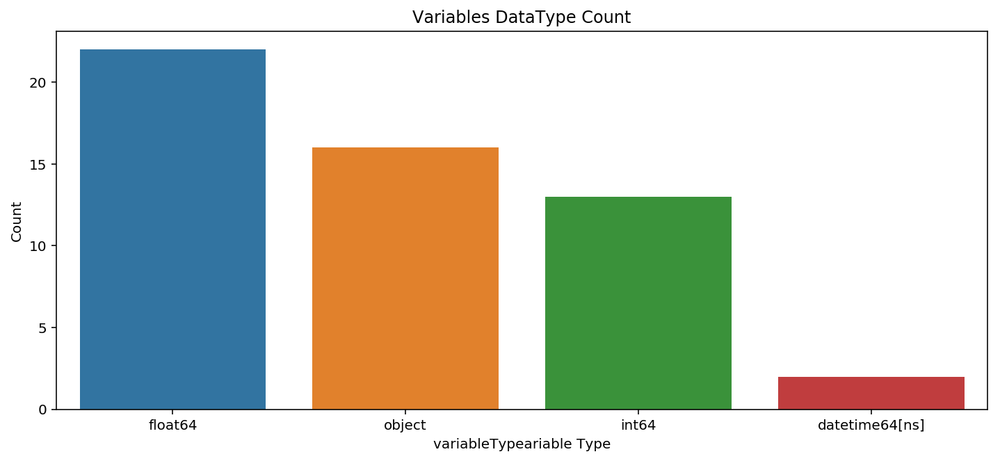

In [17]:
dataTypeDf = pd.DataFrame(divvyTrips.dtypes.value_counts()).reset_index().rename(columns={"index":"variableType",0:"count"})
fig,ax = plt.subplots()
fig.set_size_inches(12,5)
sns.barplot(data=dataTypeDf,x="variableType",y="count",ax=ax)
ax.set(xlabel='variableTypeariable Type', ylabel='Count',title="Variables DataType Count")

## Distribution of Categorical Variables

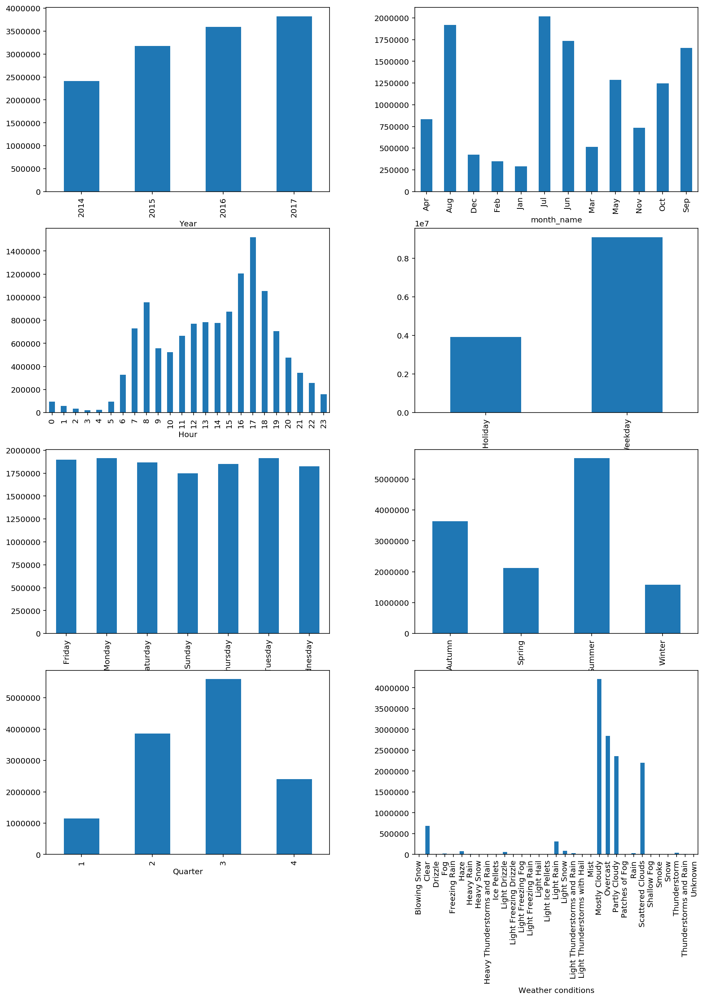

In [18]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15,20))
axes_list = [item for sublist in axes for item in sublist] 
fig.subplots_adjust(hspace=0.2, wspace=0.3)

categoryList = [divvyTrips["Year"],divvyTrips["month_name"],divvyTrips["Hour"],divvyTrips["TypeOfDay"],divvyTrips["DayName"],divvyTrips["season"],divvyTrips["Quarter"],divvyTrips["conditions"]]
categoryName = ["Year","month_name","Hour","TypeOfDay","DayName","season","Quarter","Weather conditions"]

categories = zip(categoryName,categoryList)
for categoryName,x in categories:
    ax = axes_list.pop(0)
    selection = pd.crosstab(index=x,columns="count")#.apply(lambda r: r/r.sum() * 100, axis=1)
    selection.reset_index(inplace=True)
    selection.rename(columns={list(selection)[0]:'Category',list(selection)[1]:'Frequency'}, inplace=True)
    selection.plot(kind='bar', x='Category', y='Frequency',ax=ax, legend=False)
    ax.set_xlabel(categoryName)

    # Now use the matplotlib .remove() method to 
# delete anything we didn't use
for ax in axes_list:
    ax.remove()

In [19]:
#The above charts  help group weather into different conditions
def weatherCond(x):
    if x in ['Mostly Cloudy', 'Scattered Clouds','Rain','Heavy Rain','Light Thunderstorms and Rain']:
        return 3
    elif x in ['Light Freezing Drizzle','Light Freezing Rain','Light Ice Pellets','Light Snow']:
        return 2 
    elif x in ['Freezing Rain', 'Snow', 'Ice Pellets','Fog']:
        return 4
    elif x in ['Heavy Thunderstorms and Rain','Blowing Snow','Heavy Snow','Thunderstorms and Rain']:
        return 5
    else:
        if x in ['Clear','Partly Cloudy', 'Overcast','Light Rain' ,'Light Drizzle','Drizzle']:
            return 1

The overview of frequency charts for 2013-2017 for a bunch of categorical variables gives quick insight into how data is distributed. The increase in usage over the years certainly indicates Divvy in Chicago to be a very popular bike system with total trip coverage of 10M. Customer engagement proves to be strong during Summer and Autumn seasons, specifically from May through September .Hourly ridership graph indicates the peak hours to be between 4PM and 6PM in the evenings and between 7AM - 8AM in the mornings, it can be attributed to regular school and office users at that time. Now, let's drill down further.

## Histogram of Subscribers and Customers Bike rentals

[1, 17400]


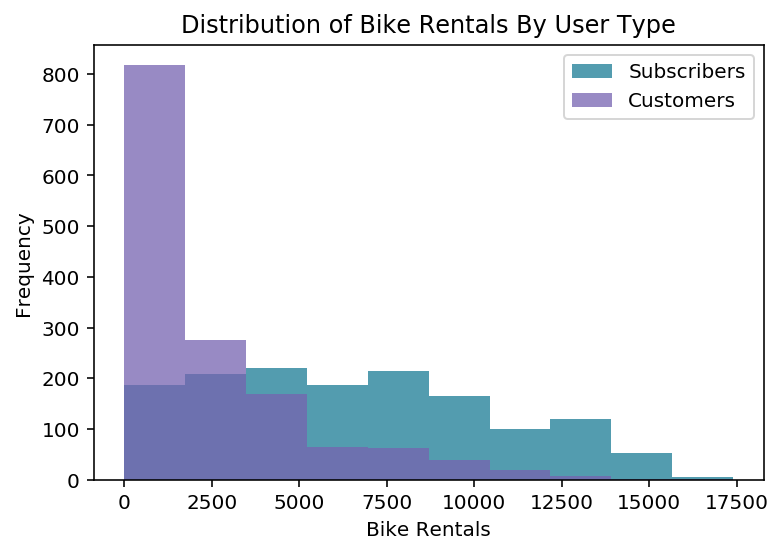

In [20]:
dailyRentalsByUsertype = divvyTrips.groupby(['usertype','startdate']).agg({'trip_id':'count'})
dailyRentalsByUsertype.reset_index(inplace=True)
s = dailyRentalsByUsertype.loc[dailyRentalsByUsertype.usertype == 'Subscriber',['trip_id']]
c = dailyRentalsByUsertype.loc[dailyRentalsByUsertype.usertype == 'Customer',['trip_id']]

# Define a function for an overlaid histogram
def overlaid_histogram(data1, data1_name, data1_color, data2, data2_name, data2_color, x_label, y_label, title):
    # Set the bounds for the bins so that the two distributions are
    # fairly compared
    max_nbins = 10
    data_range = [min(min(data1), min(data2)), max(max(data1), max(data2))]
    print(data_range)
    binwidth = (data_range[1] - data_range[0]) / max_nbins
    bins = np.arange(data_range[0], data_range[1] + binwidth, binwidth)

    # Create the plot
    _, ax = plt.subplots()
    ax.hist(data1, bins = bins, color = data1_color, alpha = 1, label = data1_name)
    ax.hist(data2, bins = bins, color = data2_color, alpha = 0.75, label = data2_name)
    ax.set_ylabel(y_label)
    ax.set_xlabel(x_label)
    ax.set_title(title)
    ax.legend(loc = 'best')
    

# Call the function to create plot
overlaid_histogram(data1 = s.trip_id
                   , data1_name = 'Subscribers'
                   , data1_color = '#539caf'
                   , data2 = c.trip_id
                   , data2_name = 'Customers'
                   , data2_color = '#7663b0'
                   , x_label = 'Bike Rentals'
                   , y_label = 'Frequency'
                   , title = 'Distribution of Bike Rentals By User Type')

### Year over Year analysis of Bike ridership under different categories. Let's use discrete and categorial variables here

In [21]:
events_df = divvyTrips[divvyTrips.Year != 2013] \
    .groupby([divvyTrips.Year,divvyTrips.events]) \
    .agg({'trip_id':'count','tripInMinutes':'mean','distance_in_meters':'mean'})
events_df.reset_index(inplace=True) 
events_df['distance_in_meters'] = events_df['distance_in_meters']/0.000621371

season_df = divvyTrips[divvyTrips.Year != 2013] \
    .groupby([divvyTrips.Year,divvyTrips.season]) \
    .agg({'trip_id':'count','tripInMinutes':'mean','distance_in_meters':'mean'})
season_df.reset_index(inplace=True) 
season_df['distance_in_meters'] = season_df['distance_in_meters']/0.000621371


typeOfDay_df = divvyTrips[divvyTrips.Year != 2013] \
    .groupby([divvyTrips.Year,divvyTrips.TypeOfDay,divvyTrips.season]) \
    .agg({'trip_id':'count','tripInMinutes':'mean','distance_in_meters':'mean'})
typeOfDay_df.reset_index(inplace=True)
typeOfDay_df['distance_in_meters'] = typeOfDay_df['distance_in_meters']/0.000621371


month_df = divvyTrips[divvyTrips.Year != 2013] \
    .groupby([divvyTrips.Year,divvyTrips.Month,divvyTrips.month_name]) \
    .agg({'trip_id':'count','tripInMinutes':'mean','distance_in_meters':'mean'})
month_df.reset_index(inplace=True)
month_df.sort_values('Month',ascending=True,inplace=True)
month_df['distance_in_meters'] = month_df['distance_in_meters']/0.000621371


day_df = divvyTrips[divvyTrips.Year != 2013] \
    .groupby([divvyTrips.Year,divvyTrips.DayName,divvyTrips.DayOfWeek,divvyTrips.gender]) \
    .agg({'trip_id':'count','tripInMinutes':'mean','distance_in_meters':'mean'})
day_df.reset_index(inplace=True)
day_df.sort_values('DayOfWeek',ascending=True,inplace=True)
day_df['distance_in_meters'] = day_df['distance_in_meters']/0.000621371


hour_df = divvyTrips[divvyTrips.Year != 2013] \
    .groupby([divvyTrips.Year,divvyTrips.Hour]) \
    .agg({'trip_id':'count','tripInMinutes':'mean','distance_in_meters':'mean'})
hour_df.reset_index(inplace=True)
hour_df.sort_values('Hour',ascending=True,inplace=True)
hour_df['distance_in_meters'] = hour_df['distance_in_meters']/0.000621371


Text(0,0.5,'Total Bike Rentals')

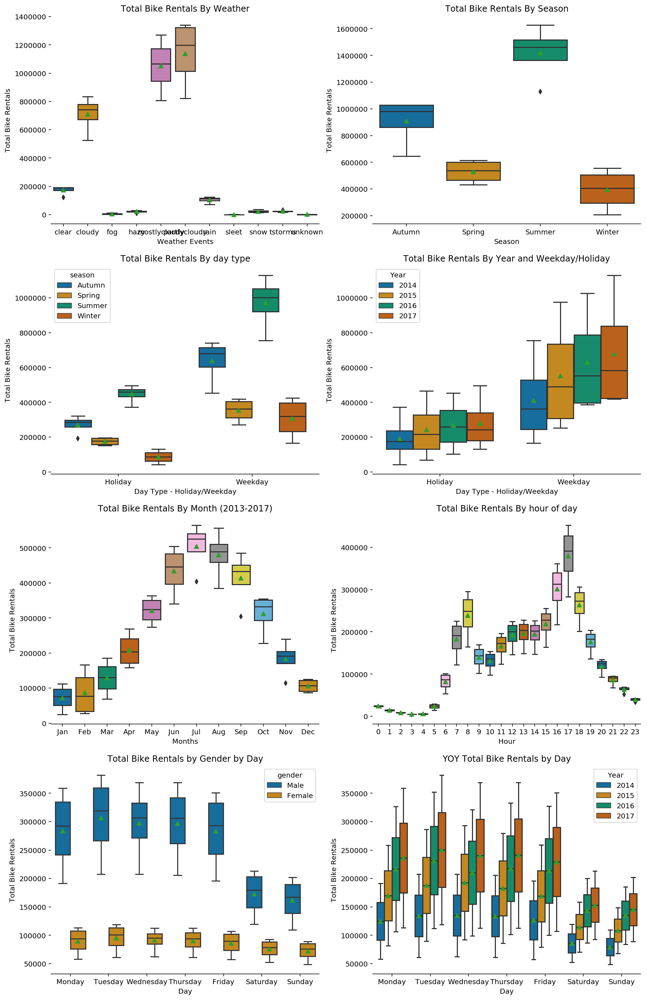

In [22]:
f, axes = plt.subplots(4, 2, figsize=(15,25))
sns.despine(left=True)
f.subplots_adjust(hspace=0.2, wspace=0.2)



ax = sns.boxplot(x='events',y='trip_id', data=events_df, orient="v",palette="colorblind",ax=axes[0, 0],showmeans=True)
#ax = sns.swarmplot(x='events',y='trip_id', data=events_df, orient="v",color=".25",ax=axes[0, 0])
ax.set_title('Total Bike Rentals By Weather')
ax.set_xlabel('Weather Events')
ax.set_ylabel('Total Bike Rentals')

ax1 = sns.boxplot(x='season',y='trip_id', data=season_df,orient="v", palette="colorblind",ax=axes[0, 1],showmeans=True)
#ax1 = sns.swarmplot(x='season',y='trip_id', data=season_df,orient="v", color=".25",ax=axes[0, 1])
ax1.set_title('Total Bike Rentals By Season')
ax1.set_xlabel('Season')
ax1.set_ylabel('Total Bike Rentals')

ax2 = sns.boxplot(x='TypeOfDay',y='trip_id', hue='season',data=typeOfDay_df,orient="v", palette="colorblind",ax=axes[1, 0],showmeans=True)
#ax2 = sns.swarmplot(x='TypeOfDay',y='trip_id',data=typeOfDay_df,orient="v", color=".25",ax=axes[1, 0])
ax2.set_title('Total Bike Rentals By day type')
ax2.set_xlabel('Day Type - Holiday/Weekday')
ax2.set_ylabel('Total Bike Rentals')


ax4 = sns.boxplot(x='month_name',y='trip_id', data=month_df,orient="v", palette="colorblind",ax=axes[2, 0],showmeans=True)
#ax4 = sns.swarmplot(x='month_name',y='trip_id', data=month_df,orient="v", color=".25",ax=axes[2, 0])
ax4.set_title('Total Bike Rentals By Month (2013-2017)')
ax4.set_xlabel('Months')
ax4.set_ylabel('Total Bike Rentals')

ax5 = sns.boxplot(x='Hour',y='trip_id',data=hour_df,orient="v", palette="colorblind",ax=axes[2, 1],showmeans=True)
#ax5 = sns.swarmplot(x='Hour',y='trip_id',data=hour_df,orient="v", color=".25",ax=axes[2, 1])
ax5.set_title('Total Bike Rentals By hour of day')
ax5.set_xlabel('Hour')
ax5.set_ylabel('Total Bike Rentals')

ax3 = sns.boxplot(x='TypeOfDay',y='trip_id', hue='Year',data=typeOfDay_df,orient="v", palette="colorblind",ax=axes[1, 1],showmeans=True)
#ax3 = sns.swarmplot(x='TypeOfDay',y='trip_id',data=typeOfDay_df,orient="v", color=".25",ax=axes[1, 1])
ax3.set_title('Total Bike Rentals By Year and Weekday/Holiday')
ax3.set_xlabel('Day Type - Holiday/Weekday')
ax3.set_ylabel('Total Bike Rentals')

ax6 = sns.boxplot(x='DayName',y='trip_id',hue='gender',data=day_df,orient="v", palette="colorblind",ax=axes[3, 0],showmeans=True)
#ax6 = sns.swarmplot(x='DayName',y='trip_id',data=day_df,orient="v", color=".25",ax=axes[3, 0])
ax6.set_title('Total Bike Rentals by Gender by Day')
ax6.set_xlabel('Day')
ax6.set_ylabel('Total Bike Rentals')

ax7 = sns.boxplot(x='DayName',y='trip_id',hue='Year',data=day_df,orient="v", palette="colorblind",ax=axes[3, 1],showmeans=True)
#ax7 = sns.swarmplot(x='DayName',y='trip_id',data=day_df,orient="v", color=".25",ax=axes[3, 1])
ax7.set_title('YOY Total Bike Rentals by Day')
ax7.set_xlabel('Day')
ax7.set_ylabel('Total Bike Rentals')



#### Outlier Analysis:
The green triangle indicates the mean. The distribution is varied in most cases but appears similar in the by day chart, so let's drill down further. 2013 data isonly available between June-Dec. Turns out removing 2013 data removed outliers therefore puling the mean up in most cases

#### Normal Distributions By Chart
1. Total Bike Rentals By Season - Winter and Spring has mean = median, both have normal distribution. 
2. YOY total Bike rentals By Day - All the plots have a normal distribution
3. Total Bike Rentals By Month - Jan, Feb,Mar,Apr,May appear to have normal distribution 
4. Total Bike Rentals By Holiday/Weekday - The distribution during holidays has normal distribution

#### Total Bike Rentals By Month
The medians July,Aug,Sep is very similar compared to June with possible influence by the outliers which is skewing the distribution to the right. Let's examine these outliers in detail.

Assuming the median is going to be closer to 75% as it appears in September, indicates middle 50% of the total trips are between 275K - 425K indicating September to be one of the high usage months. The data appears to be more condensed in he upper 25% compared to the lower 25% in the boxplot indicating the data in the lower 25% to be more spread out. The data is skewed here to the right since the Mean < Median and Mean is not a good measure of spread.

#### Total Bike Rentals By hour of day
Most of the hourly data appears skewed. The long whiskers between 6AM - 7PM can be interpreted as variability of bike rentals is more wide. If you look at the bike rentals between 6AM - 7PM , the box and whiskers are not even on either side of the median/mean. For hour 17, 25% of the data is below 300k with 75% of the data above 300K, this data is right skewed.

The outliers in the evening hours needs to be further examined. 

#### Total Bike Rentals By Day & YOY Total Bike Rentals By Day
Let's examine the variance and distribution of the chart by Day for all the years (see chart with title "Total Bike Rentals By Year & Day"). 

However "Total Bike Rentals By Day" boxplot with longer whiskers suggests that there is a very high variability between 0 - ~200K trips for all the years combined. This can be deceiving if we don't see YOY since Divvy has grown over the years.

The variability is balanced between Mon-Fri and medians are consistent indicating that on an average people regularly rent Divvy bikes during these days of the week. The IQR suggests that 75% of the trips are equally distributed around the median, the median and mean being very close is indicative of a nearly normal distribution.

Bike rentals is very low on Saturdays and Sundays suggesting that Divvy rentals are primarily used by students, office goers. Chicago being a walking city and full of fun activities in late Spring, Summer and Autumn, we can think about Dockless bike rentals, introduce tandem bikes for families to increase customer engagement

Over the years female population engaging in bike ridership is consistenly low. We can drill down further this information with demographics and gender population to understand how we can encourage females to rent bikes during weekdays.

Trips gradually increase between May-September primarily in summer and autumn seasons and bike renters aer compfortable riding the bike in cloudy weather with little rain.

Text(0,0.5,'Total Bike Rentals')

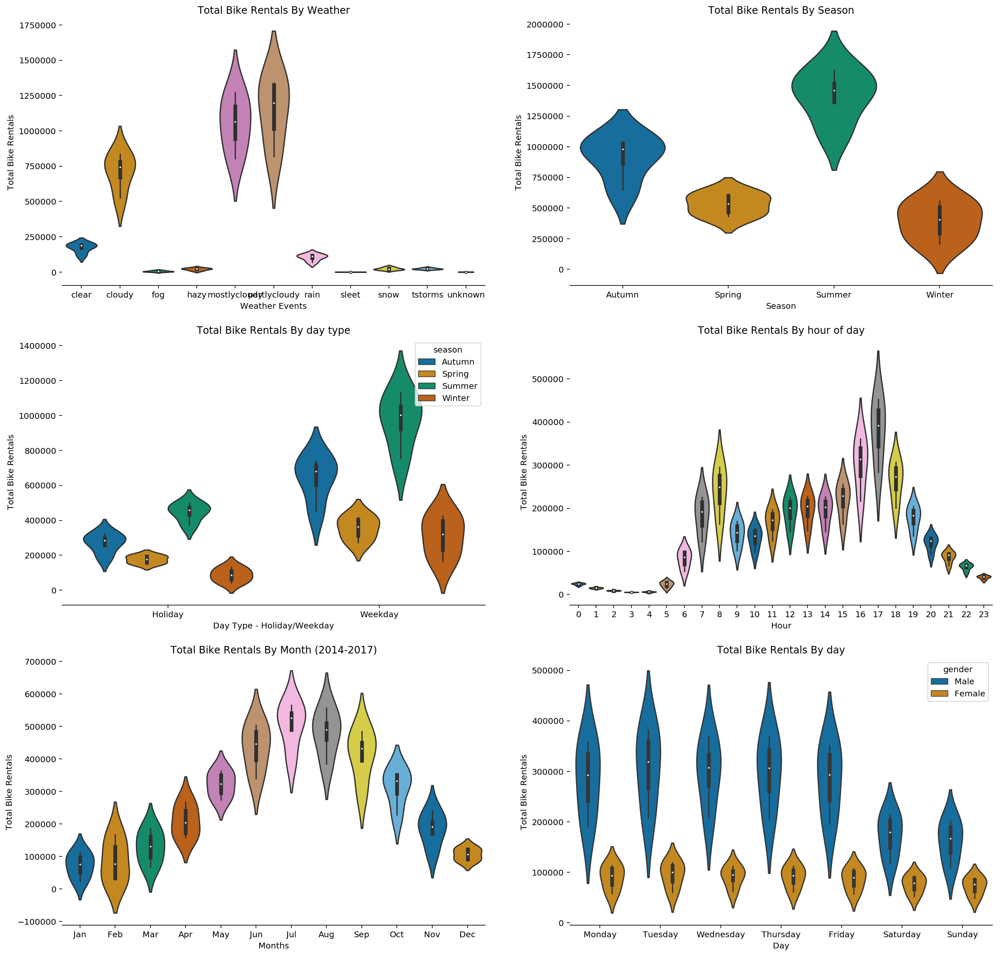

In [23]:
f, axes = plt.subplots(3, 2, figsize=(20,20))
sns.despine(left=True)
f.subplots_adjust(hspace=0.2, wspace=0.2)

ax = sns.violinplot(x='events',y='trip_id', data=events_df, orient="v",palette="colorblind",ax=axes[0, 0],showmeans=True,scale='count')
ax.set_title('Total Bike Rentals By Weather')
ax.set_xlabel('Weather Events')
ax.set_ylabel('Total Bike Rentals')

ax1 = sns.violinplot(x='season',y='trip_id', data=season_df,orient="v", palette="colorblind",ax=axes[0, 1],showmeans=True,scale='count')
ax1.set_title('Total Bike Rentals By Season')
ax1.set_xlabel('Season')
ax1.set_ylabel('Total Bike Rentals')

ax2 = sns.violinplot(x='TypeOfDay',y='trip_id', hue='season',data=typeOfDay_df,orient="v", palette="colorblind",ax=axes[1, 0],showmeans=True,scale='count')
ax2.set_title('Total Bike Rentals By day type')
ax2.set_xlabel('Day Type - Holiday/Weekday')
ax2.set_ylabel('Total Bike Rentals')

ax3 = sns.violinplot(x='Hour',y='trip_id',data=hour_df,orient="v", palette="colorblind",ax=axes[1, 1],showmeans=True,scale='count')
ax3.set_title('Total Bike Rentals By hour of day')
ax3.set_xlabel('Hour')
ax3.set_ylabel('Total Bike Rentals')

ax4 = sns.violinplot(x='month_name',y='trip_id', data=month_df,orient="v", palette="colorblind",ax=axes[2, 0],showmeans=True,scale='count')
ax4.set_title('Total Bike Rentals By Month (2014-2017)')
ax4.set_xlabel('Months')
ax4.set_ylabel('Total Bike Rentals')


ax5 = sns.violinplot(x='DayName',y='trip_id',hue='gender',data=day_df,orient="v", palette="colorblind",ax=axes[2, 1],showmeans=True,scale='count')
ax5.set_title('Total Bike Rentals By day')
ax5.set_xlabel('Day')
ax5.set_ylabel('Total Bike Rentals')



#### Box Plots is not indicative of the symmetry but violin plots/joy plots indicate if the distribution is unimodal or bimodal
The symmetry in most cases appear to be unimodal means data consistently peaks only once. The skinny plots indicate that there are not many data points around the median and there are extreme data values which are small number of really small values pulling the mean down and these cases median > mean

Let's take a look at the Autumn viloin plot, this may appear to be bimodal but most of the data in the big peak is around the median which makes this unimodal as well.

The rest of the observations is similar to box plots but here its intersting to see the visula of the data distribution and extreme data points

Text(0,0.5,'Total Bike Rentals')

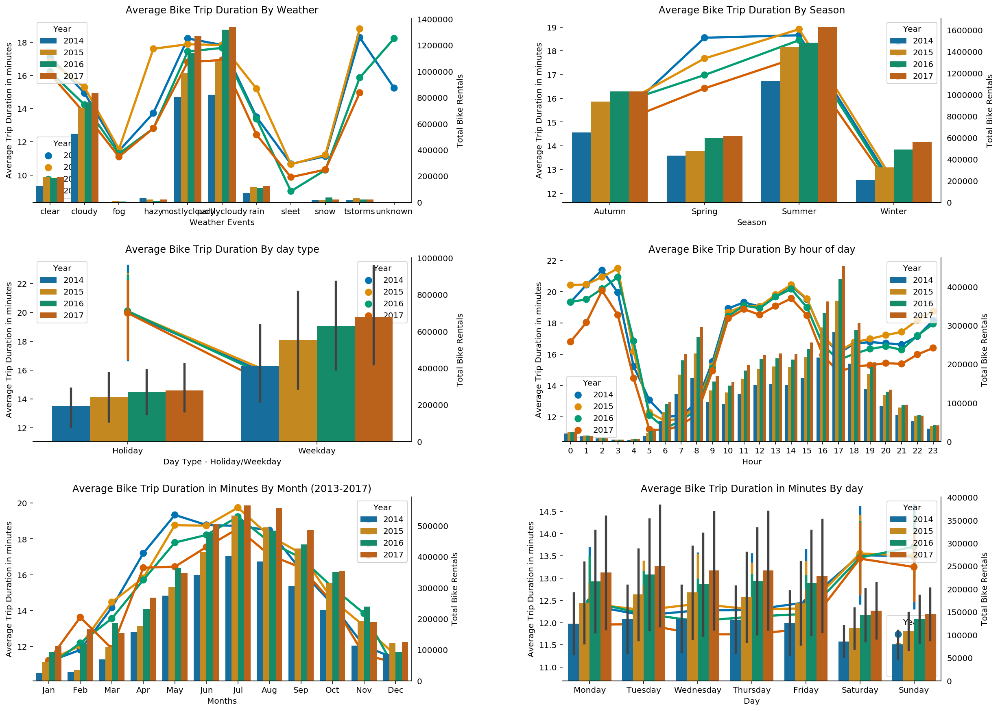

In [25]:
#from matplotlib import pyplot
#a4_dims = (15, 8.27)
f, axes = plt.subplots(3, 2, figsize=(20,15))
sns.despine(left=True)
f.subplots_adjust(hspace=0.3, wspace=0.4)

ax = sns.pointplot(x='events',y='tripInMinutes', hue='Year',data=events_df, orient="v",palette="colorblind",ax=axes[0, 0])
ax_1 = ax.twinx()
sns.despine(ax=ax, right=True, left=True)
sns.despine(ax=ax_1, left=True, right=False)
Reax_1 = sns.barplot(x='events',y='trip_id', hue='Year',data=events_df, orient="v",palette="colorblind",ax=ax_1)
ax.set_title('Average Bike Trip Duration By Weather')
ax.set_xlabel('Weather Events')
ax.set_ylabel('Average Trip Duration in minutes')
ax_1.set_ylabel('Total Bike Rentals')


ax1 = sns.pointplot(x='season',y='tripInMinutes', hue='Year', data=season_df,orient="v", palette="colorblind",ax=axes[0, 1])
ax_1 = ax1.twinx()
sns.despine(ax=ax, right=True, left=True)
sns.despine(ax=ax_1, left=True, right=False)
ax_1 = sns.barplot(x='season',y='trip_id', hue='Year',data=season_df, orient="v",palette="colorblind",ax=ax_1)
ax1.set_title('Average Bike Trip Duration By Season')
ax1.set_xlabel('Season')
ax1.set_ylabel('Average Trip Duration in minutes')
ax_1.set_ylabel('Total Bike Rentals')

ax2 = sns.pointplot(x='TypeOfDay',y='tripInMinutes', hue='Year', data=typeOfDay_df,orient="v", palette="colorblind",ax=axes[1, 0])
ax_1 = ax2.twinx()
sns.despine(ax=ax, right=True, left=True)
sns.despine(ax=ax_1, left=True, right=False)
ax_1 = sns.barplot(x='TypeOfDay',y='trip_id', hue='Year',data=typeOfDay_df, orient="v",palette="colorblind",ax=ax_1)
ax2.set_title('Average Bike Trip Duration By day type')
ax2.set_xlabel('Day Type - Holiday/Weekday')
ax2.set_ylabel('Average Trip Duration in minutes')
ax_1.set_ylabel('Total Bike Rentals')

ax3 = sns.pointplot(x='Hour',y='tripInMinutes', hue='Year', data=hour_df,orient="v", palette="colorblind",ax=axes[1, 1])
ax_1 = ax3.twinx()
sns.despine(ax=ax, right=True, left=True)
sns.despine(ax=ax_1, left=True, right=False)
ax_1 = sns.barplot(x='Hour',y='trip_id', hue='Year',data=hour_df, orient="v",palette="colorblind",ax=ax_1)
ax3.set_title('Average Bike Trip Duration By hour of day')
ax3.set_xlabel('Hour')
ax3.set_ylabel('Average Trip Duration in minutes')
ax_1.set_ylabel('Total Bike Rentals')

ax4 = sns.pointplot(x='month_name',y='tripInMinutes', hue='Year', data=month_df,orient="v", palette="colorblind",ax=axes[2, 0])
ax_1 = ax4.twinx()
sns.despine(ax=ax, right=True, left=True)
sns.despine(ax=ax_1, left=True, right=False)
ax_1 = sns.barplot(x='month_name',y='trip_id', hue='Year',data=month_df, orient="v",palette="colorblind",ax=ax_1)
ax4.set_title('Average Bike Trip Duration in Minutes By Month (2013-2017)')
ax4.set_xlabel('Months')
ax4.set_ylabel('Average Trip Duration in minutes')
ax_1.set_ylabel('Total Bike Rentals')


ax5 = sns.pointplot(x='DayName',y='tripInMinutes', hue='Year', data=day_df,orient="v", palette="colorblind",ax=axes[2, 1])
ax_1 = ax5.twinx()
sns.despine(ax=ax, right=True, left=True)
sns.despine(ax=ax_1, left=True, right=False)
ax_1 = sns.barplot(x='DayName',y='trip_id', hue='Year',data=day_df, orient="v",palette="colorblind",ax=ax_1)
ax5.set_title('Average Bike Trip Duration in Minutes By day')
ax5.set_xlabel('Day')
ax5.set_ylabel('Average Trip Duration in minutes')
ax_1.set_ylabel('Total Bike Rentals')



These charts give a combined view of bike rentals and duration. 

1. During Weekdays between 4PM - 6PM, the bike duration on an average is between 11-15 minutes. 
People may be worried about not finding an empty dock and hence end up taking new bikes every 15 minutes.
Bike renters here may be making multiple trips from different stations in the evenings.
We can assume office goers on their way to train stations, to a local event,happy hour,go home from a bus station
This peak hour needs bikes to be rebalanced either via valet or Divvy trucks availibity to empty the docks at the station.

2. The number of trips drops between midnight-4AM compared to the peak hours but the trip duration is high
The trip duration is high during weekends as well.

3. The trip duration dropped in Summer 2016 compared to 2015 but picked up again in Summer 2017. This can probably be attributed to additional
stations, valet parking during big festivals or population increase in the city or visitors 

Text(0,0.5,'Average Trip Duration in Minutes')

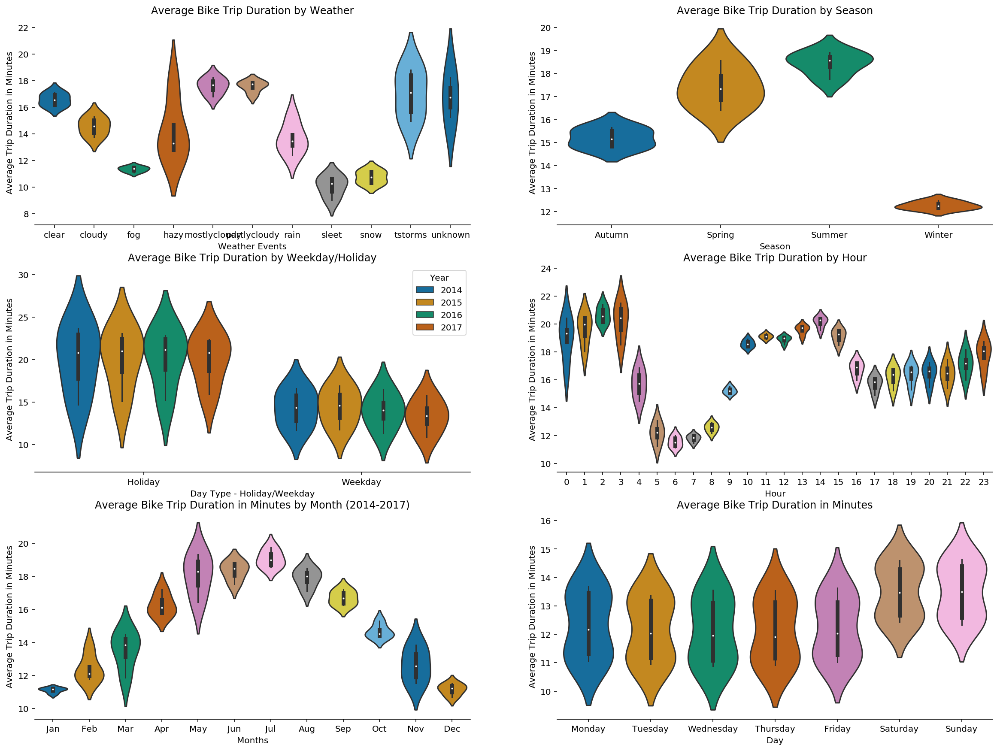

In [26]:
#from matplotlib import pyplot
#a4_dims = (15, 8.27)
f, axes = plt.subplots(3, 2, figsize=(20,15))
sns.despine(left=True)
f.subplots_adjust(hspace=0.2, wspace=0.2)

ax = sns.violinplot(x='events',y='tripInMinutes', data=events_df, orient="v",palette="colorblind",ax=axes[0, 0],scale='count')
ax.set_title('Average Bike Trip Duration by Weather')
ax.set_xlabel('Weather Events')
ax.set_ylabel('Average Trip Duration in Minutes')

ax1 = sns.violinplot(x='season',y='tripInMinutes',data=season_df,orient="v", palette="colorblind",ax=axes[0, 1],scale='count')
ax1.set_title('Average Bike Trip Duration by Season')
ax1.set_xlabel('Season')
ax1.set_ylabel('Average Trip Duration in Minutes')

ax2 = sns.violinplot(x='TypeOfDay',y='tripInMinutes',hue='Year',data=typeOfDay_df,orient="v", palette="colorblind",ax=axes[1, 0],scale='count')
ax2.set_title('Average Bike Trip Duration by Weekday/Holiday')
ax2.set_xlabel('Day Type - Holiday/Weekday')
ax2.set_ylabel('Average Trip Duration in Minutes')

ax3 = sns.violinplot(x='Hour',y='tripInMinutes', data=hour_df,orient="v", palette="colorblind",ax=axes[1, 1],scale='count')
ax3.set_title('Average Bike Trip Duration by Hour')
ax3.set_xlabel('Hour')
ax3.set_ylabel('Average Trip Duration in Minutes')

ax4 = sns.violinplot(x='month_name',y='tripInMinutes', data=month_df,orient="v", palette="colorblind",ax=axes[2, 0],scale='count')
ax4.set_title('Average Bike Trip Duration in Minutes by Month (2014-2017)')
ax4.set_xlabel('Months')
ax4.set_ylabel('Average Trip Duration in Minutes')

ax5 = sns.violinplot(x='DayName',y='tripInMinutes', data=day_df,orient="v", palette="colorblind",ax=axes[2, 1],scale='count')
ax5.set_title('Average Bike Trip Duration in Minutes')
ax5.set_xlabel('Day')
ax5.set_ylabel('Average Trip Duration in Minutes')



The trip duration plots are very interesting and unique comapred to the total bike rentals. After removing 2013 trip data, fewer extreme data values can be observed. Divvy was launched in 2013 and data was available between June-Dec

#### Average Bike Trip Duration by Weather
People have been renting bikes during all the weather conditions. Fewer number of people can be observed in extreme weather conditions. Data in terms of average trip duration appears consistent for cloudy conditions but varies during extreme conditions like tstorms 

#### Average Bike Trip Duration by Season
Bike riders tend to spend more time on the bikes during Summer,Autumn and Spring but comparitively less during winters as expected.

#### Average Bike Trip Duration by Weekday/Holiday
Duration on the bike varies a lot more during holidays compared to weekday. This data can help with organizing the flow of bikes to the station during weekdays

#### Average Bike Trip Duration in Minutes 
All the days shows a bimodal distribution of data indicating modes peak at 11.5 and 13.5 minutes Mon-Fri. As observed earlier bike riders spend more time on the bikes during weekends anywhere between 12.5 and 14.5 minutes

Divvy earns money if the riders don't return the bike on time. It is not clear from the  graphs how many stations are using the bikes for more than 30 minutes.Let's visualize this next.

## Divvy Revenue : Trip Duration and Total Bike Rentals Above 30 minutes

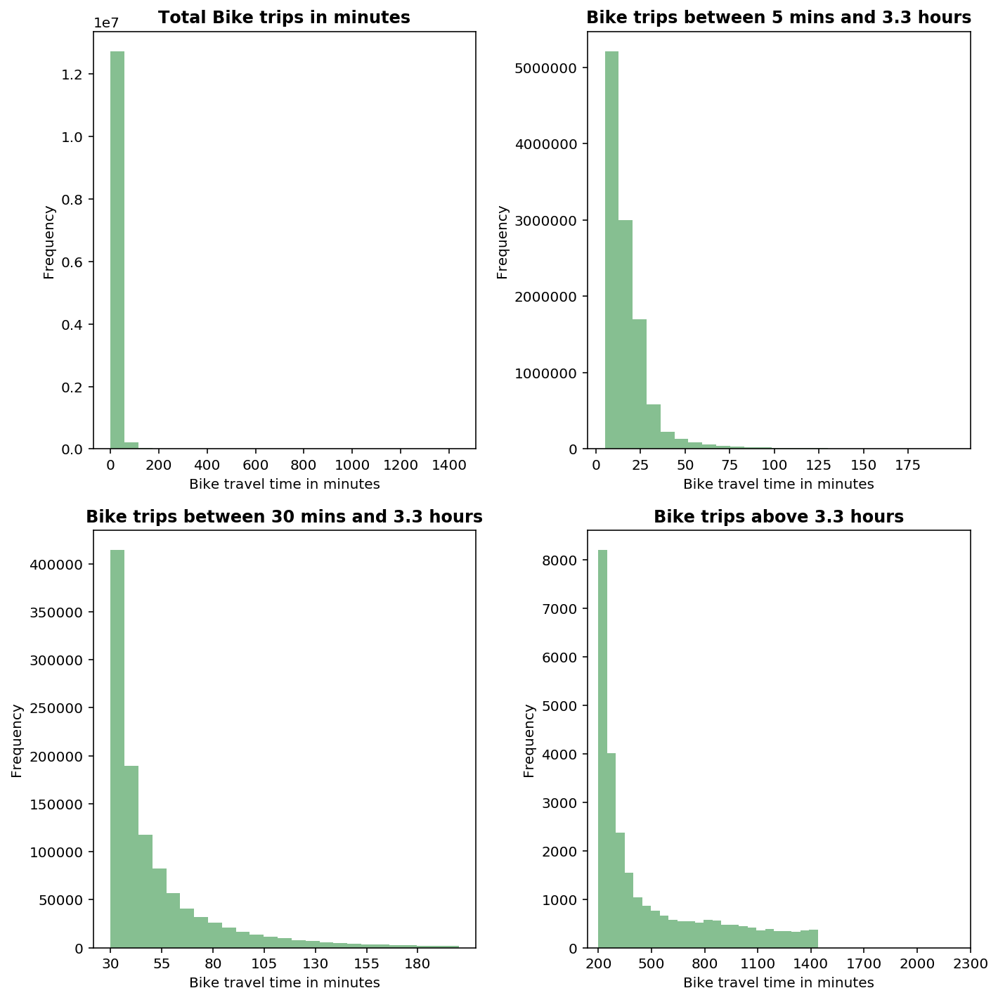

In [27]:
fig = plt.figure(figsize=(10,10))

ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)
ax4 = fig.add_subplot(224)

axes1 = divvyTrips.hist(column='tripInMinutes', bins=25, grid=False, color='#86bf91', ax=ax1, label='Trip In Minutes')
ax1.set_xlabel("Bike travel time in minutes")
ax1.set_ylabel("Frequency")
ax1.set_title("Total Bike trips in minutes",weight='bold', size=12)
    
axes2 = divvyTrips[(divvyTrips.tripInMinutes > 5) & (divvyTrips.tripInMinutes <= 200)].hist(column='tripInMinutes', bins=25, grid=False, ax=ax2, color='#86bf91')
ax2.set_xlabel("Bike travel time in minutes")
ax2.set_ylabel("Frequency")
ax2.set_title("Bike trips between 5 mins and 3.3 hours", weight='bold', size=12)
plt.sca(ax2)
plt.xticks(range(0,200,25))

axes3 = divvyTrips[(divvyTrips.tripInMinutes > 30) & (divvyTrips.tripInMinutes <= 200)].hist(column='tripInMinutes', bins=25, grid=False, ax=ax3, color='#86bf91')
ax3.set_xlabel("Bike travel time in minutes")
ax3.set_ylabel("Frequency")
ax3.set_title("Bike trips between 30 mins and 3.3 hours", weight='bold', size=12)
plt.sca(ax3)
plt.xticks(range(30,200,25))

axes4 = divvyTrips[(divvyTrips.tripInMinutes > 200) & (divvyTrips.tripInMinutes < divvyTrips.tripInMinutes.max())].hist(column='tripInMinutes', bins=25, grid=False, ax=ax4, color='#86bf91')
ax4.set_xlabel("Bike travel time in minutes")
ax4.set_ylabel("Frequency")
ax4.set_title("Bike trips above 3.3 hours", weight='bold', size=12)
plt.sca(ax4)
plt.xticks(range(200,2500,300))


plt.tight_layout()
plt.show() 


Ride Time will be calculated beginning when rider unlocks and removes a Divvy bicycle from a Bike Dock. If Divvy bicycle is returned to a Bike Dock within 30 minutes, no usage fee will be charged. Divvy bicycle is not returned to a Bike Dock within 30 minutes, usage fees  will be charged as set forth in the chart below

1. 00:01-30:00 minutes (00:00:01 - 00:30:00 hours)	$0.00

2. 30:01-60:00 minutes (00:30:01 - 01:00:00 hours)	$1.50

3. 60:01 - 90:00 minutes (01:00:01 - 01:30:00 hours)	$4.50

4. 90:01 - 120:00 minutes (01:30:01 - 02:00:00 hours)	$10.50

5. 120:01 - 150:00 minutes (02:00:01 - 02:30:00 hours)	$16.50

6. 150:01 - 180:00 minutes (02:30:01 - 03:00:00 hours)	$22.50

7. 180:01 - 210:00 minutes (03:00:01 - 03:30:00 hours)	$28.50

8. 210:01 - 240:00 minutes (03:30:01 - 04:00:00 hours)	$34.50


1440:00 minutes (> 24:00:00 hours)	up to $1,200.00

In [ ]:
#Example Revenue Calculation
def trip_cost(trip):
	if (trip['usertype']=='Customer') & (trip['Year'] == 2014):
		cost = 0
		if (trip['tripduration'] > 30*60) & (trip['tripduration'] <= 60*60):
			# 30-60 minutes: $3.00
			cost += 2.0
		if (trip['tripduration'] > 60*60) & (trip['tripduration'] <= 90*60):
			# 60-90 minutes: +$4.50
			cost += 4.0
		if (trip['tripduration'] > 90*60) :
			# Each additional 30 minutes past 90 minutes: $10.50			
			addl_duration = trip['tripduration'] - 90*60
			cost += 8.0*(addl_duration/(30.0*60))
		trip['revenue'] = cost
		print(cost)

divvyTrips.apply(trip_cost,axis=1)

## Bike Rentals by weather conditions

In [61]:

weatherdf = divvyTrips[['trip_id'
,"tripInMinutes"
,'startdate'
,'Month'
,'month_name'
,'months-year'
,'Year'
,'temperature'
,'windchill'
,'dewpoint'
,'humidity'
,'pressure'
,'visibility'
,'wind_speed'
,'precipitation'
,'events'
,'rain'
,'conditions'
]].copy()

weatherdf = weatherdf[(weatherdf['temperature'] > -25)
& (weatherdf['windchill'] > -25)   
& (weatherdf['dewpoint'] > -25)
& (weatherdf['humidity'] > -25)
& (weatherdf['pressure'] > -25)
& (weatherdf['visibility'] > -25)   
& (weatherdf['wind_speed'] > -25)   
& (weatherdf['precipitation'] > -25)
& (weatherdf['rain'] > -25)
]


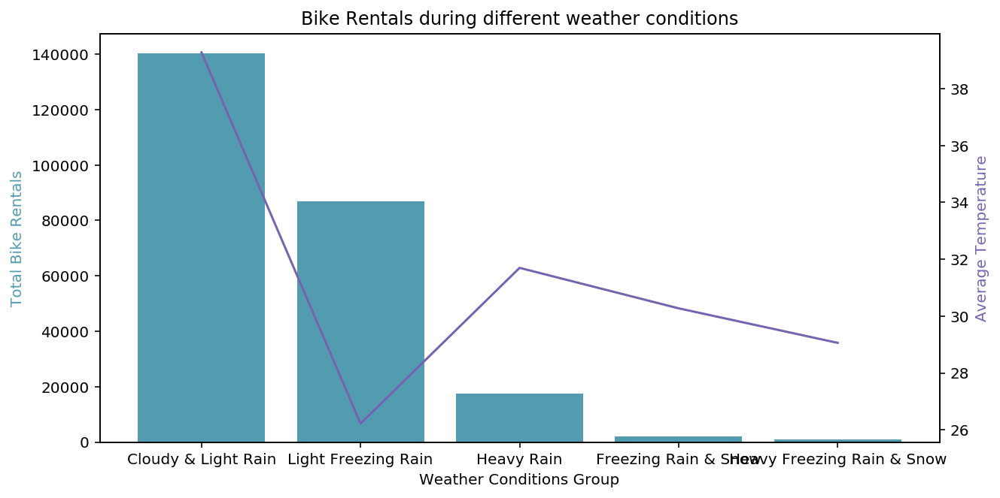

In [62]:
fig = plt.figure(figsize=(10,5))

ax1 = fig.add_subplot(111)

weatherdf['weatherGrp']  = weatherdf['conditions'].apply(weatherCond)

weatherGrpdf = weatherdf.groupby(['weatherGrp'])\
.agg({"temperature": "mean","trip_id":"count"})    
weatherGrpdf.reset_index(inplace=True)

ax1.bar(weatherGrpdf['weatherGrp'], weatherGrpdf['trip_id'], color = '#539caf')
# Label axes
ax1.set_ylabel('Total Bike Rentals', color = '#539caf')
ax1.set_xlabel('Weather Conditions Group')
ax1.set_xticks([1,2,3,4,5])
ax1.set_xticklabels(['Cloudy & Light Rain','Light Freezing Rain','Heavy Rain','Freezing Rain & Snow','Heavy Freezing Rain & Snow'])
ax1.set_title('Bike Rentals during different weather conditions')

# Create the second plot object, telling matplotlib that the two
# objects have the same x-axis
ax2 = ax1.twinx()
ax2.plot(weatherGrpdf['weatherGrp'], weatherGrpdf['temperature'], color = '#7663b0')
ax2.set_ylabel('Average Temperature', color = '#7663b0')
# Show right frame line
ax2.spines['right'].set_visible(True)

Weather conditions feature provides detailed information about the type of the weather. Earlier weather information was grouped into 5 categories shown in the bar chart, this helps clearly define characteristics of trips association with different seasons in Chicago. Considering active riders in 

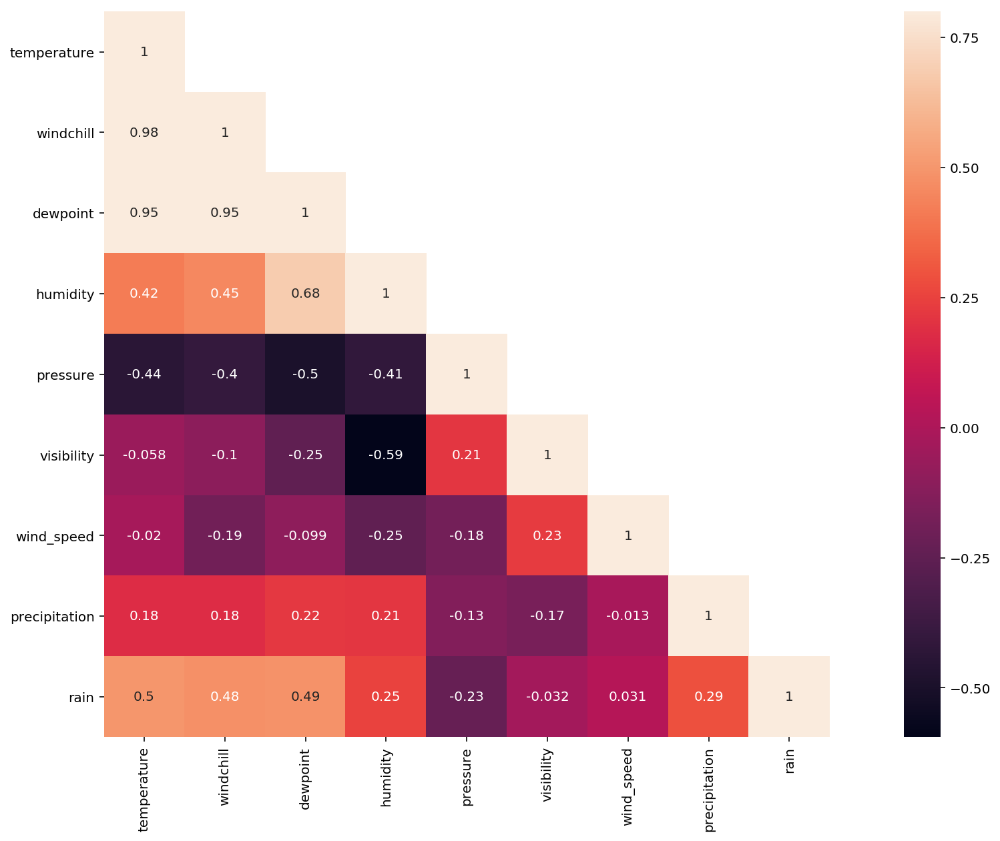

In [58]:
corrMatt = weatherdf[['temperature'
,'windchill'
,'dewpoint'
,'humidity'
,'pressure'
,'visibility'
,'wind_speed'
,'precipitation'
,'events'
,'rain'
,'conditions']].corr()
mask = np.array(corrMatt)
mask[np.tril_indices_from(mask)] = False
fig,ax= plt.subplots()
fig.set_size_inches(20,10)
sns.heatmap(corrMatt, mask=mask,vmax=.8, square=True,annot=True)

## Distribution of Continuous Weather Variables

Text(0.5,1,'Variation of Precipitation')

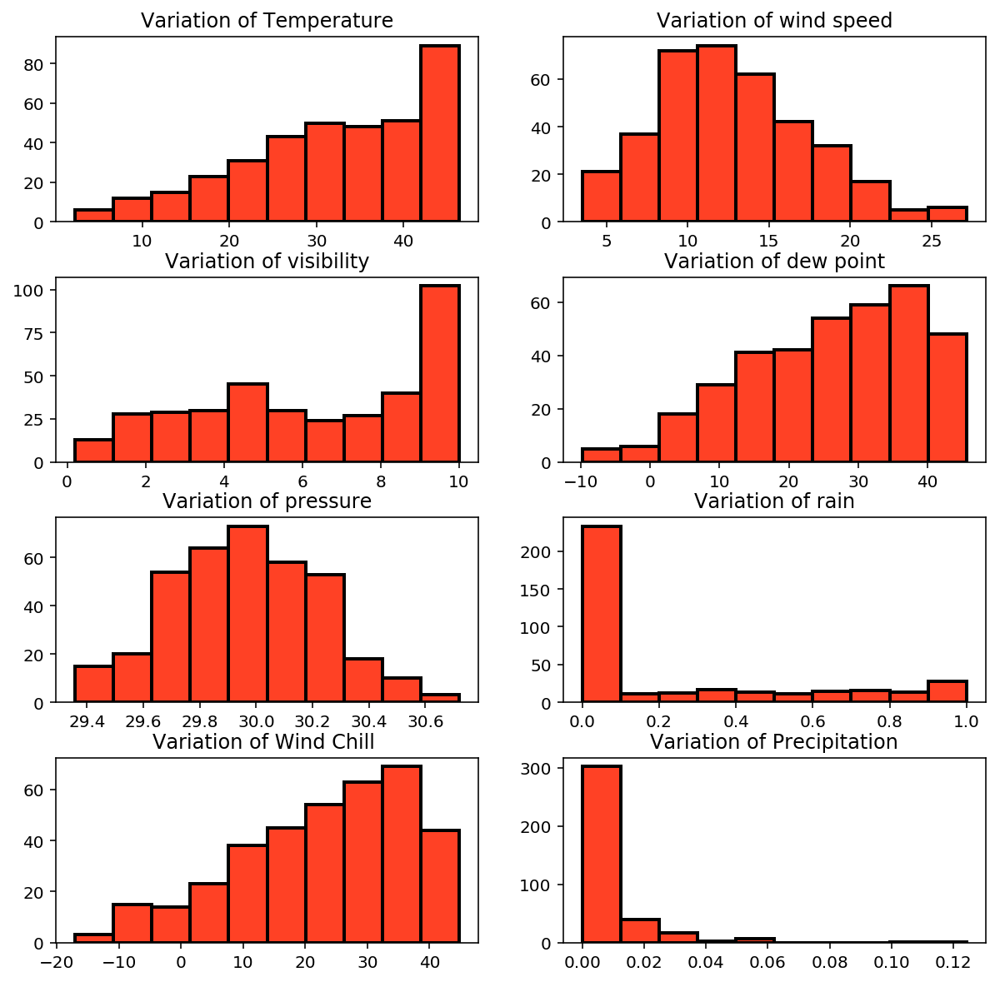

In [77]:
fig,axes=plt.subplots(4,2,figsize=(20,10))

fig.subplots_adjust(hspace=0.3, wspace=0.2)


dailytempdf = weatherdf.groupby(['startdate'])\
.agg({"temperature": "mean","trip_id":"count","tripInMinutes":"mean"})    
dailytempdf.reset_index(inplace=True)

dailytempdf.temperature.unique()
axes[0,0].hist(x="temperature",data=dailytempdf,edgecolor="black",linewidth=2,color='#ff4125')
axes[0,0].set_title("Variation of Temperature")

dailywsdf = weatherdf.groupby(['startdate'])\
.agg({"wind_speed": "mean","trip_id":"count","tripInMinutes":"mean"})    
dailywsdf.reset_index(inplace=True)

dailywsdf.wind_speed.unique()
axes[0,1].hist(x="wind_speed",data=dailywsdf,edgecolor="black",linewidth=2,color='#ff4125')
axes[0,1].set_title("Variation of wind speed")

dailyvisibilitydf = weatherdf.groupby(['startdate'])\
.agg({"visibility": "mean","trip_id":"count","tripInMinutes":"mean"})    
dailyvisibilitydf.reset_index(inplace=True)

dailyvisibilitydf.visibility.unique()
axes[1,0].hist(x="visibility",data=dailyvisibilitydf,edgecolor="black",linewidth=2,color='#ff4125')
axes[1,0].set_title("Variation of visibility")

dailyDewpointdf = weatherdf.groupby(['startdate'])\
.agg({"dewpoint": "mean","trip_id":"count","tripInMinutes":"mean"})    
dailyDewpointdf.reset_index(inplace=True)

dailyDewpointdf.dewpoint.unique()
axes[1,1].hist(x="dewpoint",data=dailyDewpointdf,edgecolor="black",linewidth=2,color='#ff4125')
axes[1,1].set_title("Variation of dew point")

dailypressuredf = weatherdf.groupby(['startdate'])\
.agg({"pressure": "mean","trip_id":"count","tripInMinutes":"mean"})    
dailypressuredf.reset_index(inplace=True)

dailypressuredf.pressure.unique()
axes[2,0].hist(x="pressure",data=dailypressuredf,edgecolor="black",linewidth=2,color='#ff4125')
axes[2,0].set_title("Variation of pressure")

dailyraindf = weatherdf.groupby(['startdate'])\
.agg({"rain": "mean","trip_id":"count","tripInMinutes":"mean"})    
dailyraindf.reset_index(inplace=True)

dailyraindf.rain.unique()
axes[2,1].hist(x="rain",data=dailyraindf,edgecolor="black",linewidth=2,color='#ff4125')
axes[2,1].set_title("Variation of rain")

dailywcdf = weatherdf.groupby(['startdate'])\
.agg({"windchill": "mean","trip_id":"count","tripInMinutes":"mean"})    
dailywcdf.reset_index(inplace=True)

dailywcdf.windchill.unique()
axes[3,0].hist(x="windchill",data=dailywcdf,edgecolor="black",linewidth=2,color='#ff4125')
axes[3,0].set_title("Variation of Wind Chill ")
fig.set_size_inches(10,10)

dailyprecdf = weatherdf.groupby(['startdate'])\
.agg({"precipitation": "mean","trip_id":"count","tripInMinutes":"mean"})    
dailyprecdf.reset_index(inplace=True)

dailyprecdf.precipitation.unique()
axes[3,1].hist(x="precipitation",data=dailyprecdf,edgecolor="black",linewidth=2,color='#ff4125')
axes[3,1].set_title("Variation of Precipitation")


Text(0,0.5,'Average Daily Trip Duration')

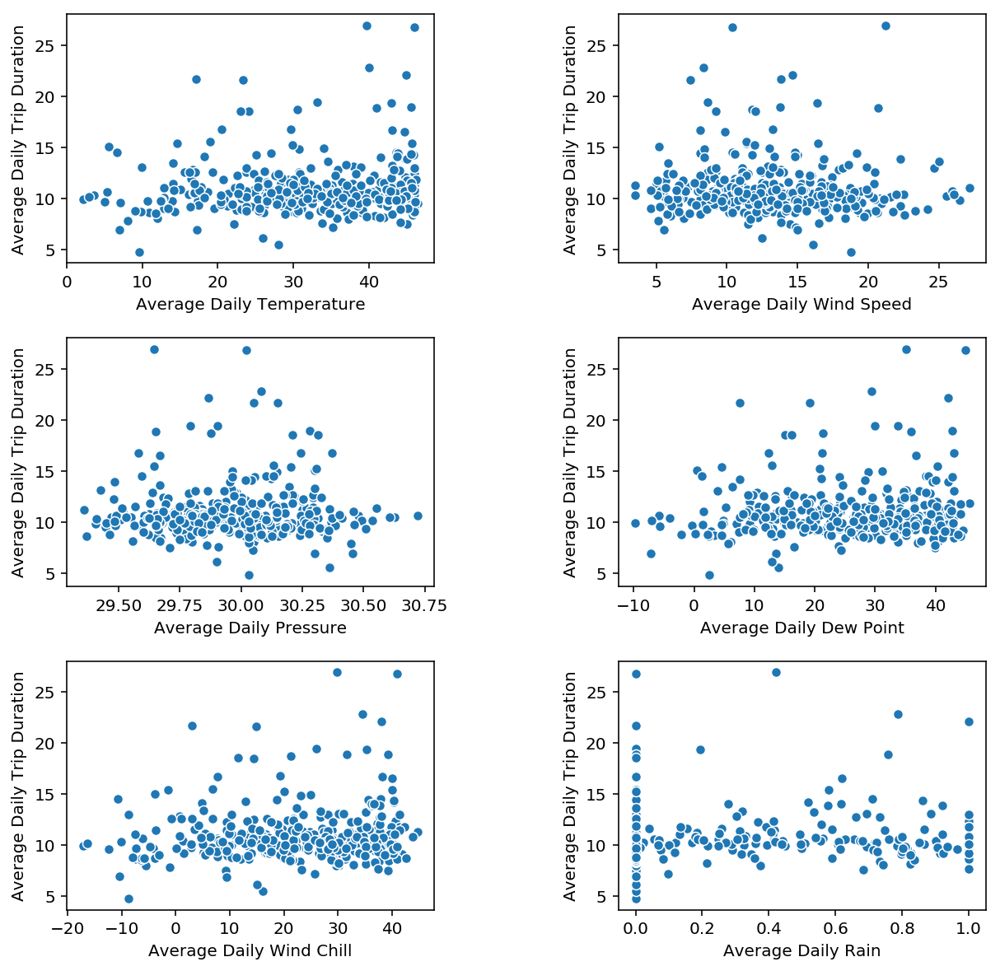

In [78]:
fig = plt.figure(figsize=(10,10))

ax1 = fig.add_subplot(321)
ax2 = fig.add_subplot(322)
ax3 = fig.add_subplot(323)
ax4 = fig.add_subplot(324)
ax5 = fig.add_subplot(325)
ax6 = fig.add_subplot(326)

fig.subplots_adjust(hspace=0.3, wspace=0.5)   

ax1=sns.scatterplot(data=dailytempdf[dailytempdf.tripInMinutes < 30],x='temperature',y='tripInMinutes',ax=ax1)
ax1.set_xlabel('Average Daily Temperature')
ax1.set_ylabel('Average Daily Trip Duration')

ax2=sns.scatterplot(data=dailywsdf[dailywsdf.tripInMinutes < 30],x='wind_speed',y='tripInMinutes',ax=ax2)
ax2.set_xlabel('Average Daily Wind Speed')
ax2.set_ylabel('Average Daily Trip Duration')

ax3=sns.scatterplot(data=dailypressuredf[dailypressuredf.tripInMinutes < 30],x='pressure',y='tripInMinutes',ax=ax3)
ax3.set_xlabel('Average Daily Pressure')
ax3.set_ylabel('Average Daily Trip Duration')

ax4=sns.scatterplot(data=dailyDewpointdf[dailyDewpointdf.tripInMinutes < 30],x='dewpoint',y='tripInMinutes',ax=ax4)
ax4.set_xlabel('Average Daily Dew Point')
ax4.set_ylabel('Average Daily Trip Duration')


ax5=sns.scatterplot(data=dailywcdf[dailywcdf.tripInMinutes < 30],x='windchill',y='tripInMinutes',ax=ax5)
ax5.set_xlabel('Average Daily Wind Chill')
ax5.set_ylabel('Average Daily Trip Duration')

ax6=sns.scatterplot(data=dailyraindf[dailyraindf.tripInMinutes < 30],x='rain',y='tripInMinutes',ax=ax6)
ax6.set_xlabel('Average Daily Rain')
ax6.set_ylabel('Average Daily Trip Duration')


Text(0,0.5,'Average Daily Rain')

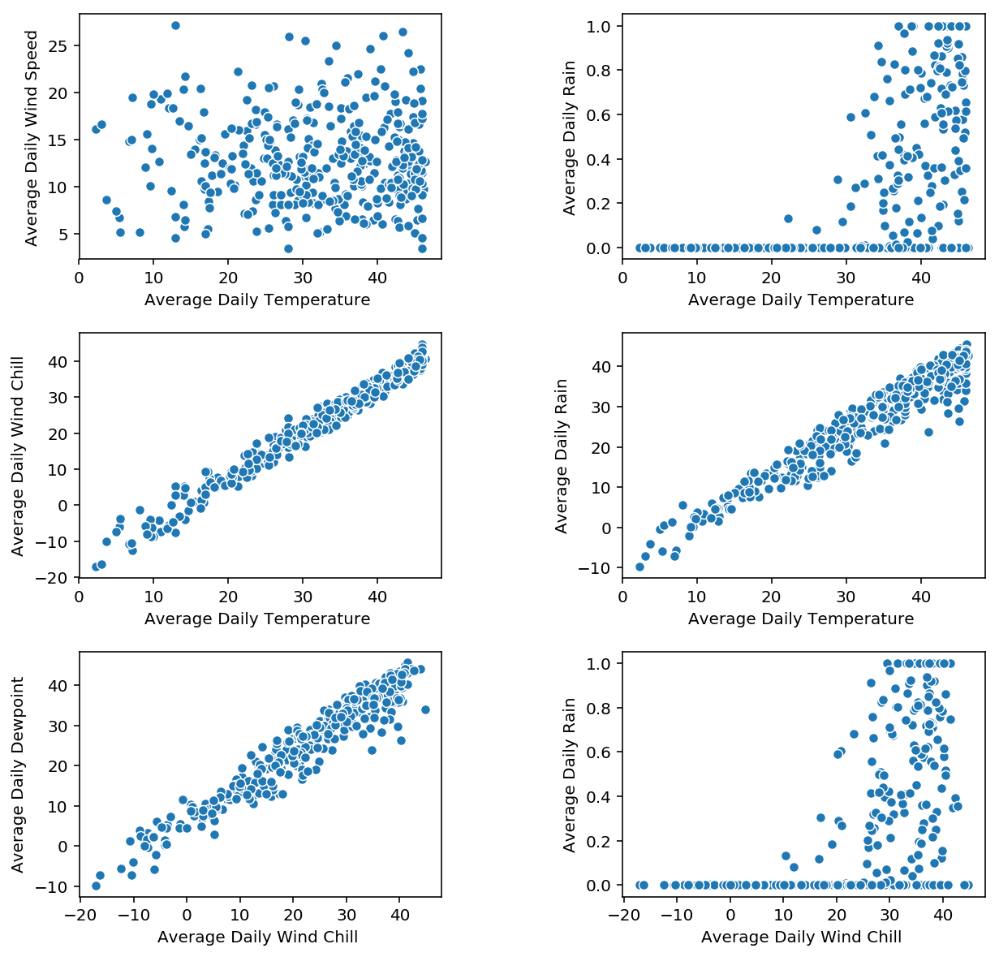

In [52]:
fig = plt.figure(figsize=(10,10))

ax1 = fig.add_subplot(321)
ax2 = fig.add_subplot(322)
ax3 = fig.add_subplot(323)
ax4 = fig.add_subplot(324)
ax5 = fig.add_subplot(325)
ax6 = fig.add_subplot(326)

fig.subplots_adjust(hspace=0.3, wspace=0.5)   

corrTempWs = weatherdf.groupby(['startdate']).agg({"temperature": "mean","wind_speed":"mean"})    
corrTempWs.reset_index(inplace=True)
ax1=sns.scatterplot(data=corrTempWs,x='temperature',y='wind_speed',ax=ax1)
ax1.set_xlabel('Average Daily Temperature ')
ax1.set_ylabel('Average Daily Wind Speed')


corrTempRain = weatherdf.groupby(['startdate']).agg({"temperature": "mean","rain":"mean"})    
corrTempRain.reset_index(inplace=True)
ax2=sns.scatterplot(data=corrTempRain,x='temperature',y='rain',ax=ax2)
ax2.set_xlabel('Average Daily Temperature ')
ax2.set_ylabel('Average Daily Rain')

corrTempWc = weatherdf.groupby(['startdate']).agg({"temperature": "mean","windchill":"mean"})    
corrTempWc.reset_index(inplace=True)
ax3=sns.scatterplot(data=corrTempWc,x='temperature',y='windchill',ax=ax3)
ax3.set_xlabel('Average Daily Temperature ')
ax3.set_ylabel('Average Daily Wind Chill')

corrTempDewpoint = weatherdf.groupby(['startdate']).agg({"temperature": "mean","dewpoint":"mean"})    
corrTempDewpoint.reset_index(inplace=True)
ax4=sns.scatterplot(data=corrTempDewpoint,x='temperature',y='dewpoint',ax=ax4)
ax4.set_xlabel('Average Daily Temperature ')
ax4.set_ylabel('Average Daily Rain')

corrWcDewpoint = weatherdf.groupby(['startdate']).agg({"windchill": "mean","dewpoint":"mean"})    
corrWcDewpoint.reset_index(inplace=True)
ax5=sns.scatterplot(data=corrWcDewpoint,x='windchill',y='dewpoint',ax=ax5)
ax5.set_xlabel('Average Daily Wind Chill ')
ax5.set_ylabel('Average Daily Dewpoint')

corrWcRain = weatherdf.groupby(['startdate']).agg({"windchill": "mean","rain":"mean"})    
corrWcRain.reset_index(inplace=True)
ax6=sns.scatterplot(data=corrWcRain,x='windchill',y='rain',ax=ax6)
ax6.set_xlabel('Average Daily Wind Chill ')
ax6.set_ylabel('Average Daily Rain')



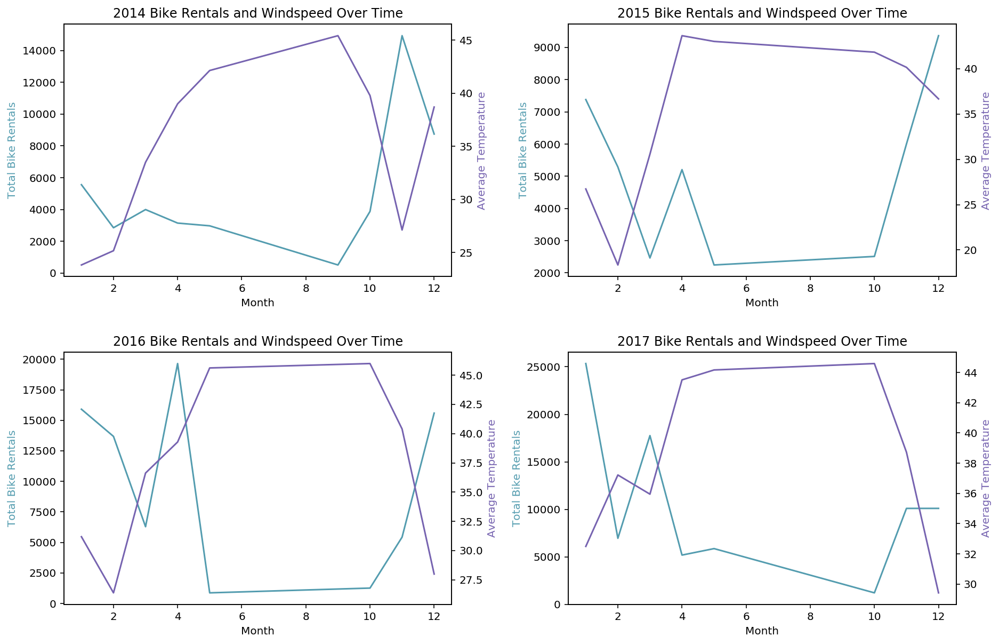

In [34]:
fig = plt.figure(figsize=(15,10))
fig.subplots_adjust(hspace=0.3, wspace=0.3)

ax1 = fig.add_subplot(221)
ax3 = fig.add_subplot(222)
ax5 = fig.add_subplot(223)
ax7 = fig.add_subplot(224)

dailywsdf = weatherdf[(weatherdf.Year == 2014)].groupby(['months-year','Month']).agg({"temperature": "mean","trip_id":"count"})    
dailywsdf.reset_index(inplace=True)
dailywsdf = dailywsdf.sort_values(['Month','months-year'],ascending=True)


ax1.plot(dailywsdf['Month'], dailywsdf['trip_id'], color = '#539caf')
# Label axes
ax1.set_ylabel('Total Bike Rentals', color = '#539caf')
ax1.set_xlabel('Month')
ax1.set_title('2014 Bike Rentals and Windspeed Over Time')

# Create the second plot object, telling matplotlib that the two
# objects have the same x-axis
ax2 = ax1.twinx()
ax2.plot(dailywsdf['Month'], dailywsdf['temperature'], color = '#7663b0')
ax2.set_ylabel('Average Temperature', color = '#7663b0')
# Show right frame line
ax2.spines['right'].set_visible(True)

dailywsdf = weatherdf[(weatherdf.Year == 2015)].groupby(['months-year','Month','Year']).agg({"temperature": "mean","trip_id":"count"})    
dailywsdf.reset_index(inplace=True)
dailywsdf = dailywsdf.sort_values(['Year','Month','months-year'],ascending=True)

ax3.plot(dailywsdf['Month'], dailywsdf['trip_id'], color = '#539caf')
# Label axes
ax3.set_ylabel('Total Bike Rentals', color = '#539caf')
ax3.set_xlabel('Month')
ax3.set_title('2015 Bike Rentals and Windspeed Over Time')

# Create the second plot object, telling matplotlib that the two
# objects have the same x-axis
ax4 = ax3.twinx()
ax4.plot(dailywsdf['Month'], dailywsdf['temperature'], color = '#7663b0')
ax4.set_ylabel('Average Temperature', color = '#7663b0')
# Show right frame line
ax4.spines['right'].set_visible(True)

dailywsdf = weatherdf[(weatherdf.Year == 2016)].groupby(['months-year','Month','Year']).agg({"temperature": "mean","trip_id":"count"})    
dailywsdf.reset_index(inplace=True)
dailywsdf = dailywsdf.sort_values(['Year','Month','months-year'],ascending=True)


ax5.plot(dailywsdf['Month'], dailywsdf['trip_id'], color = '#539caf')
# Label axes
ax5.set_ylabel('Total Bike Rentals', color = '#539caf')
ax5.set_xlabel('Month')
ax5.set_title('2016 Bike Rentals and Windspeed Over Time')

# Create the second plot object, telling matplotlib that the two
# objects have the same x-axis
ax6 = ax5.twinx()
ax6.plot(dailywsdf['Month'], dailywsdf['temperature'], color = '#7663b0')
ax6.set_ylabel('Average Temperature', color = '#7663b0')
# Show right frame line
ax6.spines['right'].set_visible(True)

dailywsdf = weatherdf[(weatherdf.Year == 2017)].groupby(['months-year','Month','Year']).agg({"temperature": "mean","trip_id":"count"})    
dailywsdf.reset_index(inplace=True)
dailywsdf = dailywsdf.sort_values(['Year','Month','months-year'],ascending=True)

ax7.plot(dailywsdf['Month'], dailywsdf['trip_id'], color = '#539caf')
# Label axes
ax7.set_ylabel('Total Bike Rentals', color = '#539caf')
ax7.set_xlabel('Month')
ax7.set_title('2017 Bike Rentals and Windspeed Over Time')

# Create the second plot object, telling matplotlib that the two
# objects have the same x-axis
ax8 = ax7.twinx()
ax8.plot(dailywsdf['Month'], dailywsdf['temperature'], color = '#7663b0')
ax8.set_ylabel('Average Temperature', color = '#7663b0')
# Show right frame line
ax8.spines['right'].set_visible(True)



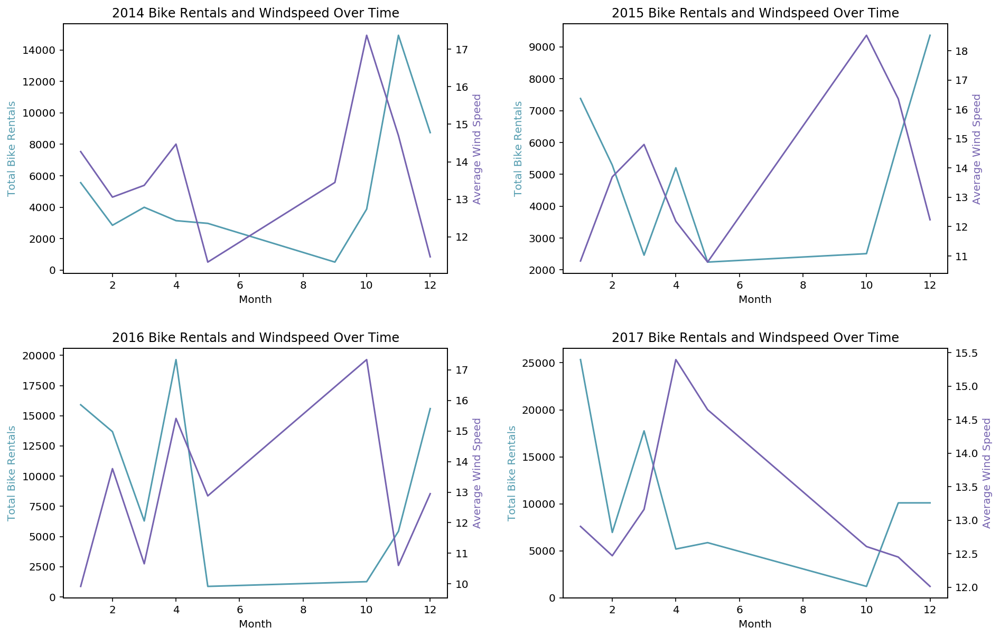

In [53]:
fig = plt.figure(figsize=(15,10))
fig.subplots_adjust(hspace=0.3, wspace=0.3)

ax1 = fig.add_subplot(221)
ax3 = fig.add_subplot(222)
ax5 = fig.add_subplot(223)
ax7 = fig.add_subplot(224)

dailywsdf = weatherdf[(weatherdf.Year == 2014)].groupby(['months-year','Month','Year']).agg({"wind_speed": "mean","trip_id":"count"})    
dailywsdf.reset_index(inplace=True)
dailywsdf = dailywsdf.sort_values(['Year','Month','months-year'],ascending=True)

ax1.plot(dailywsdf['Month'], dailywsdf['trip_id'], color = '#539caf')
# Label axes
ax1.set_ylabel('Total Bike Rentals', color = '#539caf')
ax1.set_xlabel('Month')
ax1.set_title('2014 Bike Rentals and Windspeed Over Time')

# Create the second plot object, telling matplotlib that the two
# objects have the same x-axis
ax2 = ax1.twinx()
ax2.plot(dailywsdf['Month'], dailywsdf['wind_speed'], color = '#7663b0')
ax2.set_ylabel('Average Wind Speed', color = '#7663b0')
# Show right frame line
ax2.spines['right'].set_visible(True)


dailywsdf = weatherdf[(weatherdf.Year == 2015)].groupby(['months-year','Month','Year']).agg({"wind_speed": "mean","trip_id":"count"})    
dailywsdf.reset_index(inplace=True)
dailywsdf = dailywsdf.sort_values(['Year','Month','months-year'],ascending=True)


ax3.plot(dailywsdf['Month'], dailywsdf['trip_id'], color = '#539caf')
# Label axes
ax3.set_ylabel('Total Bike Rentals', color = '#539caf')
ax3.set_xlabel('Month')
ax3.set_title('2015 Bike Rentals and Windspeed Over Time')

# Create the second plot object, telling matplotlib that the two
# objects have the same x-axis
ax4 = ax3.twinx()
ax4.plot(dailywsdf['Month'], dailywsdf['wind_speed'], color = '#7663b0')
ax4.set_ylabel('Average Wind Speed', color = '#7663b0')
# Show right frame line
ax4.spines['right'].set_visible(True)

dailywsdf = weatherdf[(weatherdf.Year == 2016)].groupby(['months-year','Month','Year']).agg({"wind_speed": "mean","trip_id":"count"})    
dailywsdf.reset_index(inplace=True)
dailywsdf = dailywsdf.sort_values(['Year','Month','months-year'],ascending=True)


ax5.plot(dailywsdf['Month'], dailywsdf['trip_id'], color = '#539caf')
# Label axes
ax5.set_ylabel('Total Bike Rentals', color = '#539caf')
ax5.set_xlabel('Month')
ax5.set_title('2016 Bike Rentals and Windspeed Over Time')

# Create the second plot object, telling matplotlib that the two
# objects have the same x-axis
ax6 = ax5.twinx()
ax6.plot(dailywsdf['Month'], dailywsdf['wind_speed'], color = '#7663b0')
ax6.set_ylabel('Average Wind Speed', color = '#7663b0')
# Show right frame line
ax6.spines['right'].set_visible(True)

dailywsdf = weatherdf[(weatherdf.Year == 2017)].groupby(['months-year','Month','Year']).agg({"wind_speed": "mean","trip_id":"count"})    
dailywsdf.reset_index(inplace=True)
dailywsdf = dailywsdf.sort_values(['Year','Month','months-year'],ascending=True)


ax7.plot(dailywsdf['Month'], dailywsdf['trip_id'], color = '#539caf')
# Label axes
ax7.set_ylabel('Total Bike Rentals', color = '#539caf')
ax7.set_xlabel('Month')
ax7.set_title('2017 Bike Rentals and Windspeed Over Time')

# Create the second plot object, telling matplotlib that the two
# objects have the same x-axis
ax8 = ax7.twinx()
ax8.plot(dailywsdf['Month'], dailywsdf['wind_speed'], color = '#7663b0')
ax8.set_ylabel('Average Wind Speed', color = '#7663b0')
# Show right frame line
ax8.spines['right'].set_visible(True)

## Bike Rental distribution of distance travelled 

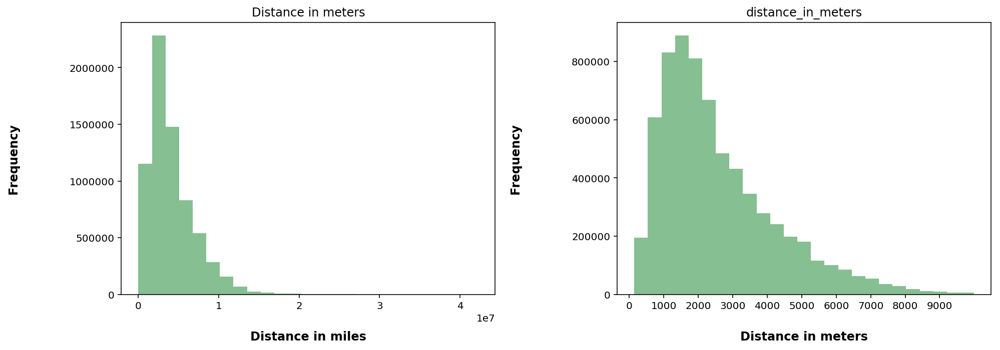

In [398]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(14,5))

ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

divvyTrips['distance_in_miles'] = divvyTrips['distance_in_meters'] / 0.000621371
axes0 = divvyTrips.hist(column='distance_in_miles', bins=25, grid=False, color='#86bf91', ax=ax1)
ax1.set_xlabel("Distance in miles", labelpad=20, weight='bold', size=12)
ax1.set_ylabel("Frequency", labelpad=50, weight='bold', size=12)
ax1.set_title("Distance in Miles")

    
axes3 = divvyTrips[(divvyTrips.distance_in_meters > 0) & (divvyTrips.distance_in_meters < 10000)].hist(column='distance_in_meters', bins=25, grid=False, ax=ax2, color='#86bf91')
ax2.set_xlabel("Distance in meters", labelpad=20, weight='bold', size=12)
ax2.set_ylabel("Frequency", labelpad=50, weight='bold', size=12)
ax1.set_title("Distance in meters")
plt.sca(ax2)
plt.xticks(range(0,10000,1000))

plt.tight_layout()
plt.show() 

## Highest usage of Divvy by months and user type for all the 4 years

In [399]:
#Number of trips by month
divvyTrips.set_index(['gender','usertype','Year']).head(4)
tripsByUsertypePerMonth = divvyTrips.trip_id \
    .groupby([divvyTrips.Year,divvyTrips.Month,divvyTrips.usertype]) \
    .size().reset_index() \
    .rename(columns={0:'count'}) \
    .sort_index() 

####### ASK MENTOR: How to sort month names  #######
#trips_by_usertype_per_month['month_name']=trips_by_usertype_per_month.month.apply(lambda x: calendar.month_abbr[x])
#trips_by_usertype_per_month = trips_by_usertype_per_month.pivot(index='usertype',columns='month_name',values='trip_id')
months = {1: 'Jan', 2: 'Feb', 3: 'Mar',4: 'Apr',5:'May',6: 'Jun',7:'Jul',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12: 'Dec'}
tripsByUsertypePerMonth['months'] = tripsByUsertypePerMonth['Month'].map(months)
tripsByUsertypePerMonth = tripsByUsertypePerMonth.pivot_table(index='usertype',columns=['Year','Month','months'],values='trip_id')

cm = sns.light_palette("green", as_cmap=True)
s = tripsByUsertypePerMonth.style.background_gradient(cmap=cm)
s

#trips_by_usertype_per_month
#MultiIndex(levels=[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], ['Apr', 'Aug', 'Dec', 'Feb', 'Jan', 'Jul', 'Jun', 'Mar', 'May', 'Nov', 'Oct', 'Sep']],
#           labels=[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [4, 3, 7, 0, 8, 6, 5, 1, 11, 10, 9, 2]],
#           names=['month', 'months'])

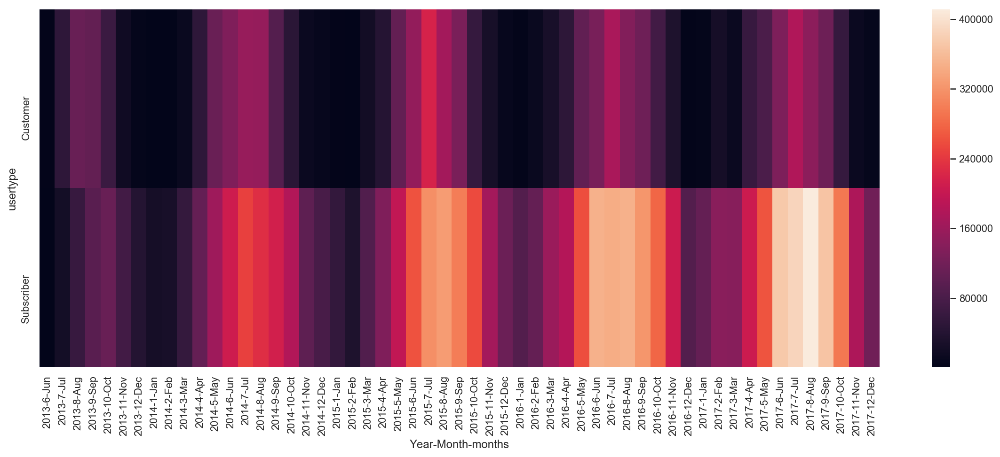

In [942]:
fig = plt.figure(figsize=(20,7))
sns.heatmap(tripsByUsertypePerMonth, annot=False, fmt=".1f")
plt.show()

## Customers cummulative and total bike rentals over the years  

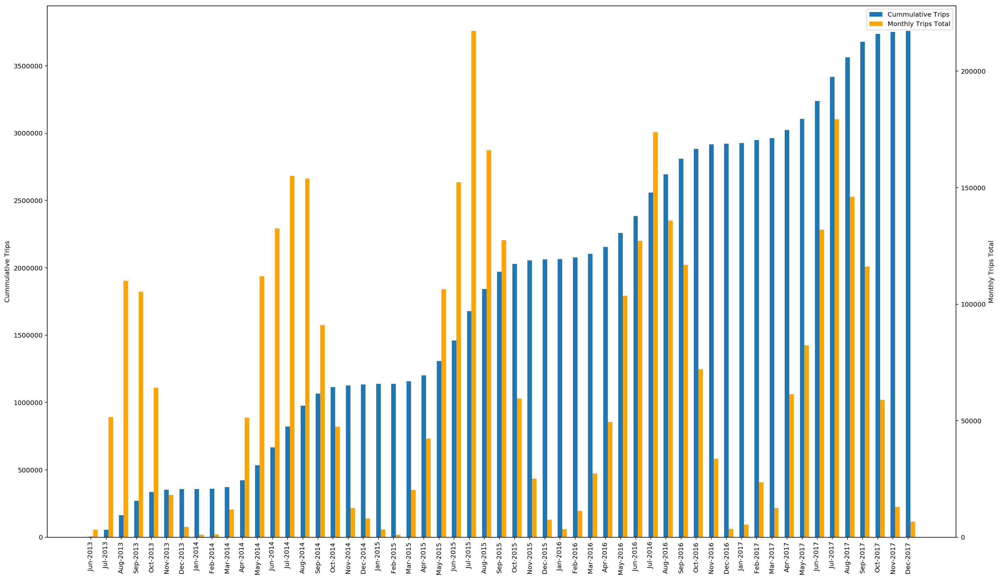

In [400]:

#Number of trips per station
Customer = divvyTrips.loc[divvyTrips['usertype'] == 'Customer',['month_name','trip_id','Month','Year','months-year']].groupby(['month_name','Month','Year','months-year']).agg({'trip_id':'count'})
Customer.reset_index(inplace=True)
Customer.sort_values(['Year','Month'],ascending=True,inplace=True)
Customer['cumulative_trips'] = Customer['trip_id'].cumsum()
x = np.arange(55)

fig, ax1 = plt.subplots(1,1,figsize=(25,15))

width = 0.3 # This is the width of each bar in the bar plot.
plt.xticks(x, Customer['months-year'], rotation='vertical')

#MENTOR : CHECK HOW TO MAKE THIS AN AREA
cumTrips = ax1.bar(x, Customer.cumulative_trips , width)
plt.ylabel('Cummulative Trips')

# ax1.twinx() gives us the same x-axis with the y-axis on the right.
ax2 = ax1.twinx()
trips = ax2.bar(x + width,Customer.trip_id ,
              width, color='orange')
plt.ylabel('Monthly Trips Total')
plt.legend([cumTrips, trips],
           ['Cummulative Trips', 'Monthly Trips Total'])
plt.show()

## Subscribers cummulative and total bike rentals over the years

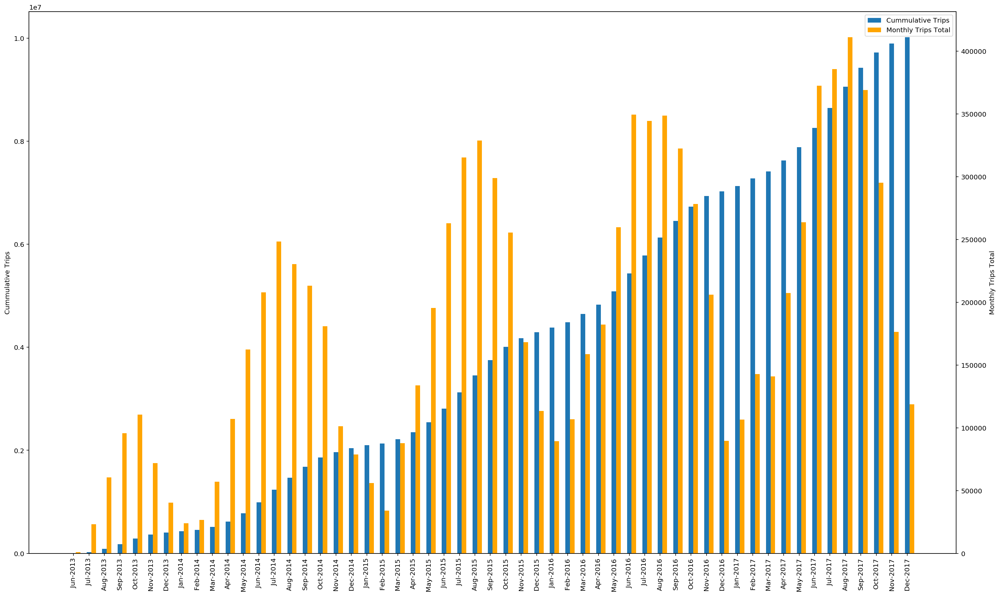

In [401]:
#Number of trips per station
Subscriber = divvyTrips.loc[divvyTrips['usertype'] == 'Subscriber',['month_name','trip_id','Month','Year','months-year']].groupby(['month_name','Month','Year','months-year']).agg({'trip_id':'count'})
Subscriber.reset_index(inplace=True)
Subscriber.sort_values(['Year','Month'],ascending=True,inplace=True)
Subscriber['cumulative_trips'] = Subscriber['trip_id'].cumsum()
x = np.arange(55)
fig, ax1 = plt.subplots(1,1,figsize=(25,15))

width = 0.3 # This is the width of each bar in the bar plot.
plt.xticks(x, Subscriber['months-year'], rotation='vertical')

#MENTOR : CHECK HOW TO MAKE THIS AN AREA
cumTrips = ax1.bar(x, Subscriber.cumulative_trips , width)
plt.ylabel('Cummulative Trips')

# ax1.twinx() gives us the same x-axis with the y-axis on the right.
ax2 = ax1.twinx()
trips = ax2.bar(x + width,Subscriber.trip_id ,
              width, color='orange')
plt.ylabel('Monthly Trips Total')
plt.legend([cumTrips, trips],
           ['Cummulative Trips', 'Monthly Trips Total'])
figure = plt.gcf() # get current figure
plt.show()

In [ ]:
##stations

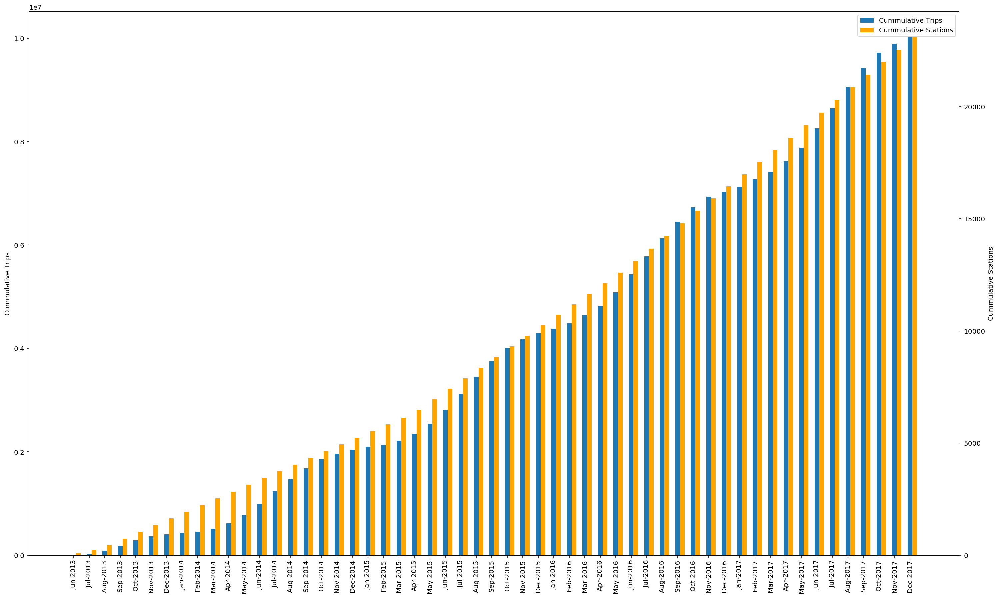

In [402]:
#Number of trips per station
Subscriber = divvyTrips.loc[divvyTrips['usertype'] == 'Subscriber',['month_name','to_station_id','trip_id','Month','Year','months-year']].groupby(['month_name','Month','Year','months-year']).agg({'trip_id':'count','to_station_id':pd.Series.nunique})
Subscriber.reset_index(inplace=True)
Subscriber.sort_values(['Year','Month'],ascending=True,inplace=True)
Subscriber['cumulative_trips'] = Subscriber['trip_id'].cumsum()
Subscriber['cumulative_stations'] = Subscriber['to_station_id'].cumsum()

x = np.arange(55)
fig, ax1 = plt.subplots(1,1,figsize=(25,15))

width = 0.3 # This is the width of each bar in the bar plot.
plt.xticks(x, Subscriber['months-year'], rotation='vertical')

#MENTOR : CHECK HOW TO MAKE THIS AN AREA
cumTrips = ax1.bar(x, Subscriber.cumulative_trips , width)
plt.ylabel('Cummulative Trips')

# ax1.twinx() gives us the same x-axis with the y-axis on the right.
ax2 = ax1.twinx()
cumStations = ax2.bar(x + width,Subscriber.cumulative_stations ,
              width, color='orange')
plt.ylabel('Cummulative Stations')
plt.legend([cumTrips, cumStations],
           ['Cummulative Trips', 'Cummulative Stations'])
figure = plt.gcf() # get current figure
plt.show()

## Same Station Trip Analysis 

In [403]:
# Curious, how many trips went from Station A all the way to Station A
totalTrips = divvyTrips['trip_id'].agg(len)
sameStationTrips = divvyTrips[divvyTrips.from_station_id == divvyTrips.to_station_id]
sameStationTrips.is_copy = False

print ('Total number of trips: {:,}'.format(totalTrips))
print (('Trips from A -> A: {:,}').format(len(sameStationTrips)))
print (('Trips from A -> A: {:.1%}').format(len(sameStationTrips) / totalTrips))

# % of same station trips by usertype
num_trips_by_usertype = divvyTrips.groupby('usertype')['trip_id'].agg(len)
num_same_station_trips_by_usertype = sameStationTrips.groupby('usertype')['trip_id'].agg(len)
num_same_station_trips_by_usertype / num_trips_by_usertype

Total number of trips: 13,772,143
Trips from A -> A: 500,426
Trips from A -> A: 3.6%


usertype
Customer     0.091062
Subscriber   0.015799
Name: trip_id, dtype: float64

usertype
Customer      AxesSubplot(0.125,0.125;0.775x0.755)
Subscriber    AxesSubplot(0.125,0.125;0.775x0.755)
Name: tripInMinutes, dtype: object

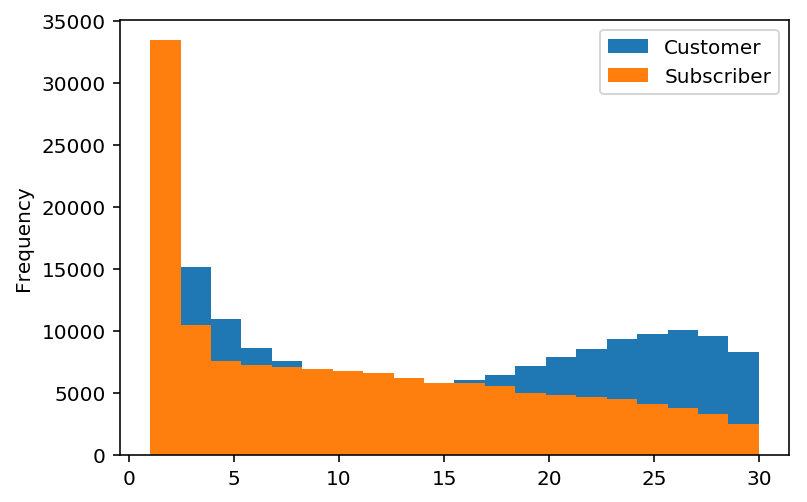

In [404]:
# Divvy's charge more for rides larger than 30 minutes so lets see that
# distribution of usage for less than 30

sameStationTrips[sameStationTrips['tripInMinutes'] < 30] \
    .groupby('usertype')['tripInMinutes'] \
    .plot(kind='hist', stacked=True, legend=True, bins=20)

usertype
Customer      AxesSubplot(0.125,0.125;0.775x0.755)
Subscriber    AxesSubplot(0.125,0.125;0.775x0.755)
Name: tripInMinutes, dtype: object

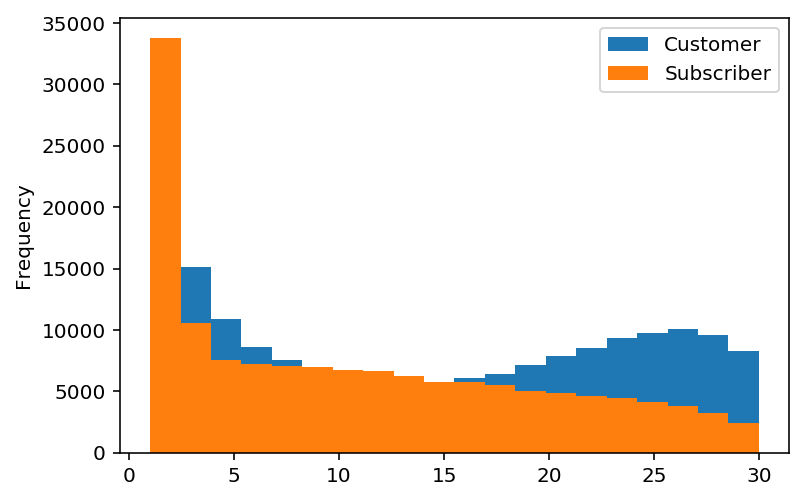

In [130]:
#Same station trips under 3 mins is interesting.
#The subscribers may have had docking issues
#The subscribers didn't need the bike anymore
#Valet parking during a major event
#These can be potential outliers and can be removed from the dataset
sameStationTrips[sameStationTrips['tripInMinutes'] < 30] \
    .groupby('usertype')['tripInMinutes'] \
    .plot(kind='hist', stacked=True, legend=True, bins=20)


Num records dropped: 68664


usertype
Customer      AxesSubplot(0.125,0.125;0.775x0.755)
Subscriber    AxesSubplot(0.125,0.125;0.775x0.755)
Name: tripInMinutes, dtype: object

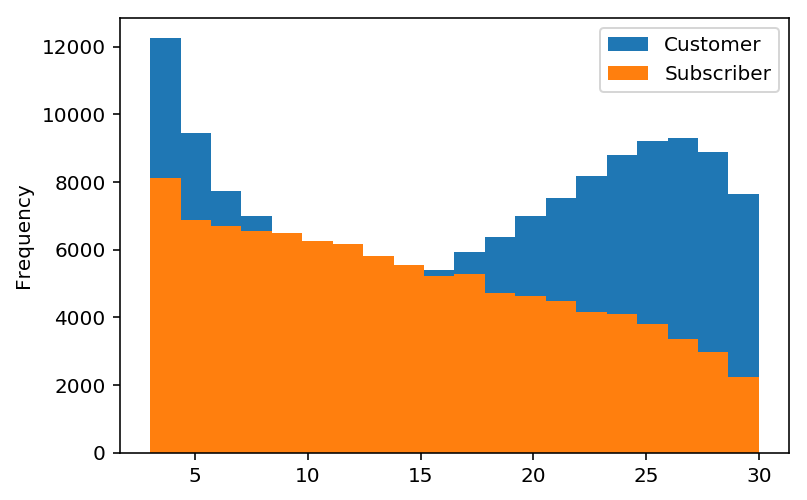

In [405]:
old_count = len(sameStationTrips)
sameStationTrips = sameStationTrips[sameStationTrips.tripInMinutes > 3]
new_count = len(sameStationTrips)
print ('Num records dropped: {}'.format(old_count-new_count))

sameStationTrips[sameStationTrips['tripInMinutes'] < 30] \
    .groupby('usertype')['tripInMinutes'] \
    .plot(kind='hist', stacked=True, legend=True, bins=20)

## Chicago Heat Map using Lat & Long¶


In [406]:
#Number of trips per station
Customer = divvyTrips.loc[divvyTrips['usertype'] == 'Customer',['usertype','from_station_id','from_station_name','latitude_start','longitude_start','trip_id']].groupby(['from_station_id','from_station_name','latitude_start','longitude_start'])['trip_id'].size()
Customer = Customer.to_frame().reset_index()
Customer.head(2)

Subscriber = divvyTrips.loc[divvyTrips['usertype'] == 'Subscriber',['usertype','from_station_id','from_station_name','latitude_start','longitude_start','trip_id']].groupby(['from_station_id','from_station_name','latitude_start','longitude_start'])['trip_id'].size()
Subscriber = Subscriber.to_frame().reset_index()
Subscriber.head(2)


,from_station_id,from_station_name,latitude_start,longitude_start,trip_id
0,2,Buckingham Fountain,41.872293,-87.624091,1624
1,2,Buckingham Fountain,41.876393,-87.620328,1350


In [407]:
#Create Folium map of Station locations centered around Chicago
m = folium.Map([41.8781, -87.6298], 
               zoom_start=11)

for index, row in Customer.iterrows():
    folium.CircleMarker([row['latitude_start'], row['longitude_start']],
                        radius=1,
                        popup=row['from_station_name'],
                        fill_color="#3db7e4", # divvy color
                       ).add_to(m)
#Convert to (n, 2) nd-array format for heatmap
stationArr = Customer[['latitude_start','longitude_start']].as_matrix()


# plot heatmap
m.add_child(plugins.HeatMap(stationArr, radius=15))
m

In [408]:
#Create Folium map of Station locations centered around Chicago
m = folium.Map([41.8781, -87.6298], 
               zoom_start=11)

for index, row in Subscriber.iterrows():
    folium.CircleMarker([row['latitude_start'], row['longitude_start']],
                        radius=1,
                        popup=row['from_station_name'],
                        fill_color="#3db7e4", # divvy color
                       ).add_to(m)
#Convert to (n, 2) nd-array format for heatmap
stationArr = Subscriber[['latitude_start','longitude_start']].as_matrix()

# plot heatmap
m.add_children(plugins.HeatMap(stationArr, radius=15))
m

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  from ipykernel import kernelapp as app


## How has subscribers performed over the years ?

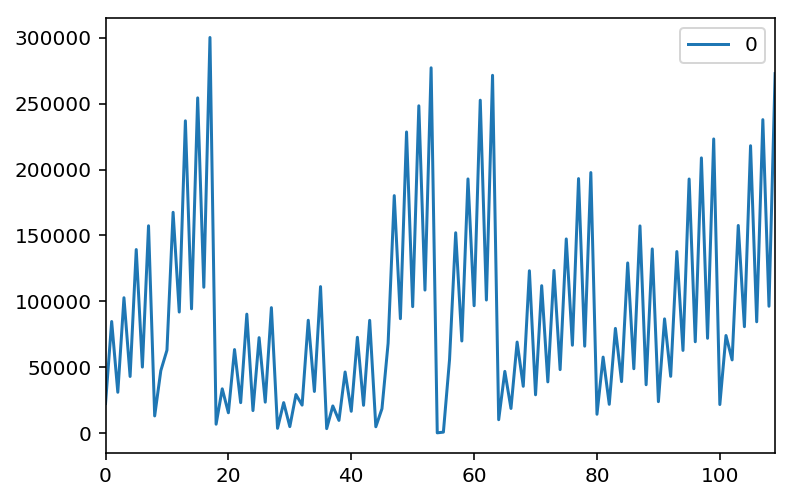

In [411]:
subscriber_df=divvyTrips.loc[(divvyTrips.usertype == 'Subscriber'),['months-year','gender']]\
                  .groupby(['months-year','gender'])\
                  .size() 

#####Errors out when a list is provided to loc to get a dataframe instead of series   
#type(subscriber_df)
#### pandas.core.series.Series

#isinstance(subscriber_df, pd.DataFrame)
#### False

# subscriber_df is a multilevel index
# subscriber_df.index
subscriber_df.unstack(level =0)

subscriber_df.plot(kind='hist')
plt.title("Histogram of Subscribers")
plt.xlabel("Total Trips By Subscribers")
plt.ylabel("Frequency");
plt.show()
plot_df = subscriber_df.to_frame().reset_index()
plot_df.unstack(level=-1)
plot_df.cumsum()
plot_df.plot()
#type(plot_df)
#pandas.core.frame.DataFrame

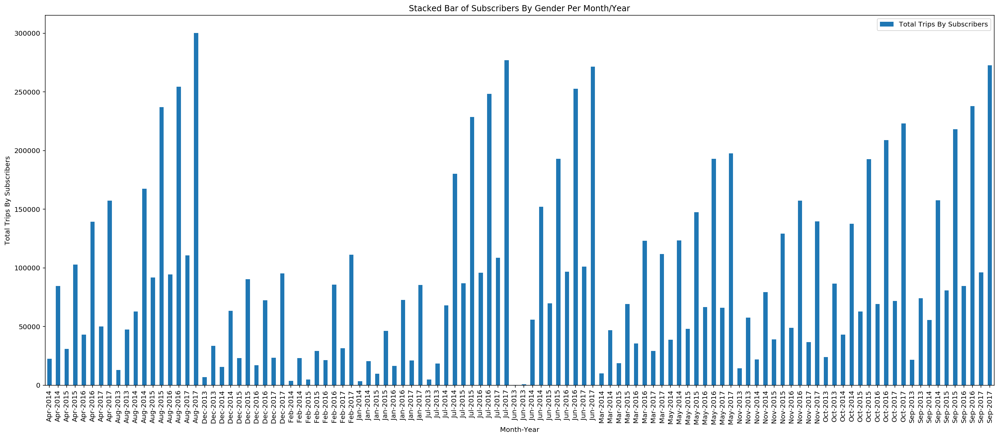

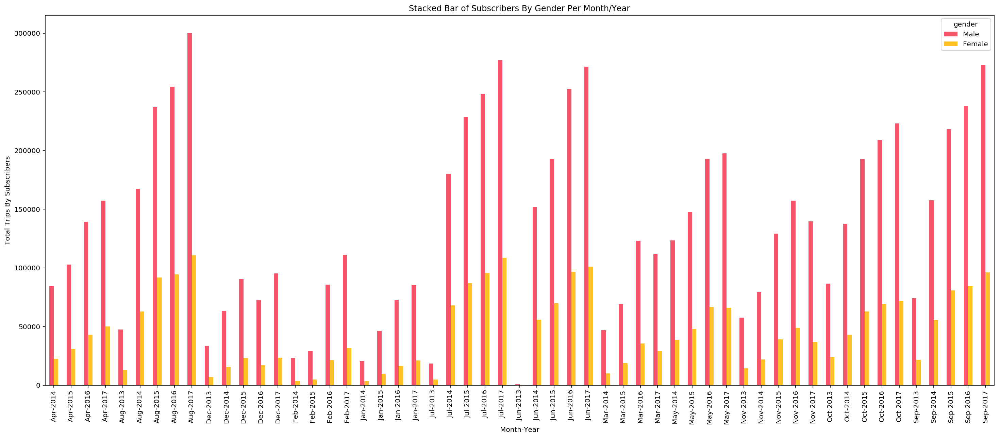

In [412]:
plt.rcParams["figure.figsize"] = (25,10)
plot_df.columns=['months-year', 'gender', 'Total Trips By Subscribers']
colors = ["#f6546a", "#ffc125"]

plot_df[['Total Trips By Subscribers']].plot(kind='bar'
                                              ,stacked=True
                                              ,x=plot_df['months-year']
                                              ,use_index='Total Trips By Subscribers')
plt.title("Stacked Bar of Subscribers By Gender Per Month/Year")
plt.xlabel("Month-Year")
plt.ylabel("Total Trips By Subscribers");

pivot_df = plot_df.pivot(columns='gender', index='months-year', values='Total Trips By Subscribers')
pivot_df.loc[:,['Male','Female']].plot.bar(stacked=False, color=colors, figsize=(25,10))
plt.title("Stacked Bar of Subscribers By Gender Per Month/Year")
plt.xlabel("Month-Year")
plt.ylabel("Total Trips By Subscribers");

#plot_df.plot(kind='bar', stacked=True)

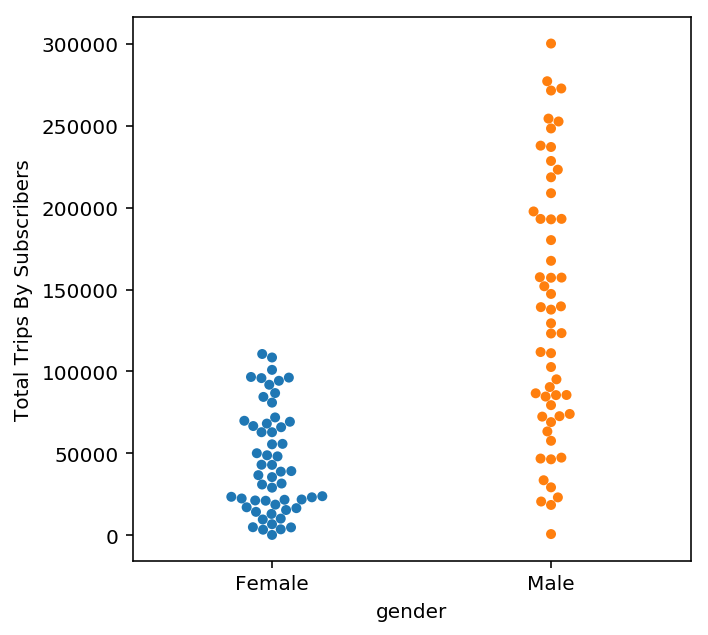

In [53]:
plt.rcParams["figure.figsize"] = (5,5)

sns.swarmplot(x="gender", y="Total Trips By Subscribers", data=plot_df)


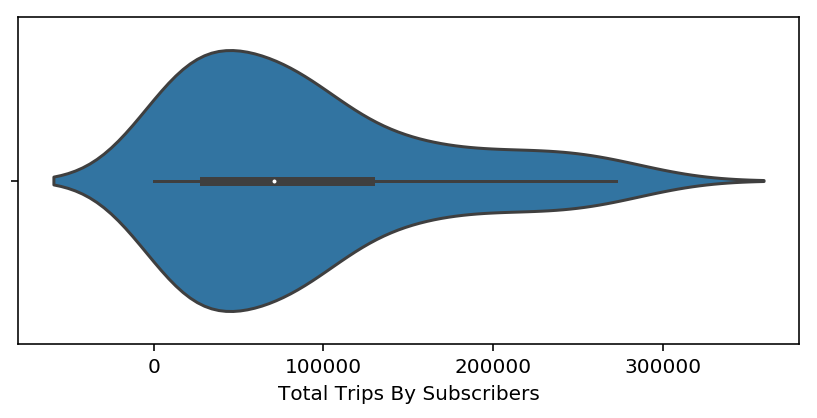

In [413]:
plt.rcParams["figure.figsize"] = (7,3)

sns.violinplot(x = "Total Trips By Subscribers", data=plot_df)

## Trips by day of the week

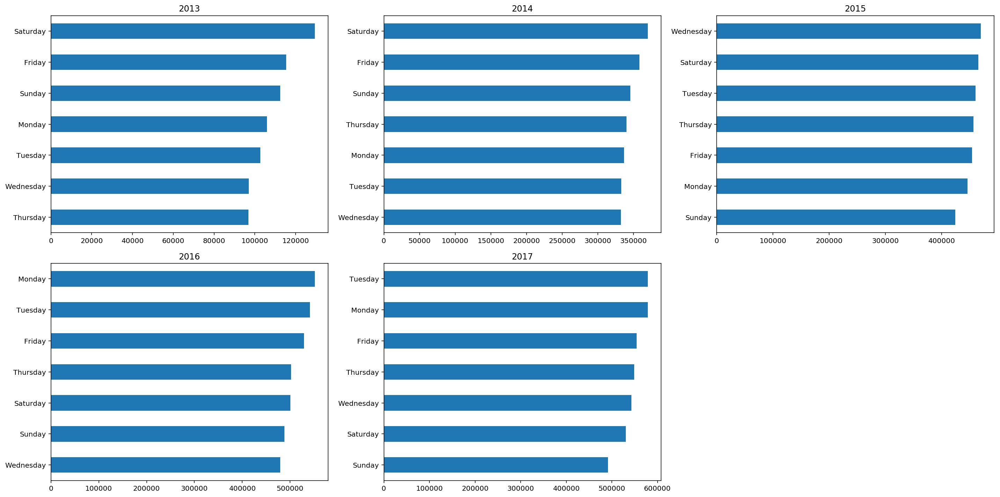

In [414]:
#fig = plt.figure()
#
#for i in range(1, 6):
#    plt.subplot(2, 3, i)
#    plt.text(0.5, 0.5, str((2, 3, i)),
#             fontsize=18, ha='center')
    
#fig, ax = plt.subplots(2, 3, sharex='col', sharey='row')

fig = plt.figure(figsize=(20,10))
fig.subplots_adjust(hspace=1.0, wspace=2)
# Divide the figure into a 2x1 grid, and give me the first section
#ax1 = fig.add_subplot(211)
# Divide the figure into a 2x1 grid, and give me the second section
#ax2 = fig.add_subplot(212)

ax1 = fig.add_subplot(231)
ax2 = fig.add_subplot(232)
ax3 = fig.add_subplot(233)
ax4 = fig.add_subplot(234)
ax5 = fig.add_subplot(235)


y13=divvyTrips[divvyTrips['Year'] == 2013].groupby('DayName')['trip_id'].size().sort_values()
y13.plot(kind='barh', ax=ax1)
y14=divvyTrips[divvyTrips['Year'] == 2014].groupby('DayName')['trip_id'].size().sort_values()
y14.plot(kind='barh', ax=ax2)
y15=divvyTrips[divvyTrips['Year'] == 2015].groupby('DayName')['trip_id'].size().sort_values()
y15.plot(kind='barh', ax=ax3)
y16=divvyTrips[divvyTrips['Year'] == 2016].groupby('DayName')['trip_id'].size().sort_values()
y16.plot(kind='barh', ax=ax4)
y17=divvyTrips[divvyTrips['Year'] == 2017].groupby('DayName')['trip_id'].size().sort_values()
y17.plot(kind='barh', ax=ax5)


ax1.yaxis.set_label_text("")
ax1.set_title("2013")

ax2.yaxis.set_label_text("")
ax2.set_title("2014")

ax3.yaxis.set_label_text("")
ax3.set_title("2015")

ax4.yaxis.set_label_text("")
ax4.set_title("2016")

ax5.yaxis.set_label_text("")
ax5.set_title("2017")

plt.tight_layout()

## Trips by weather events

Text(0,0.5,'Trip time in minutes')

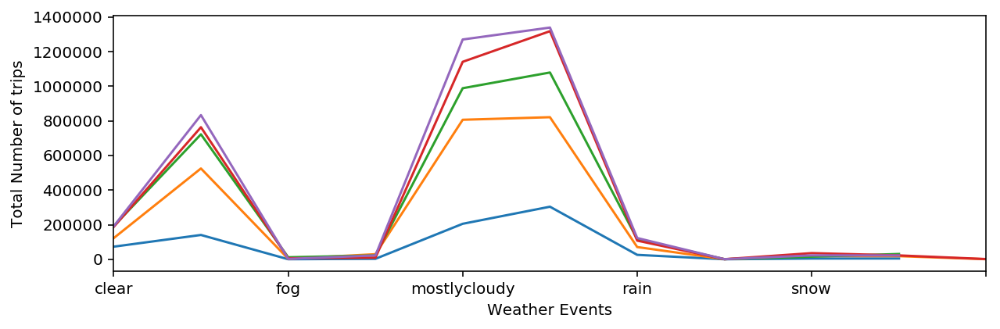

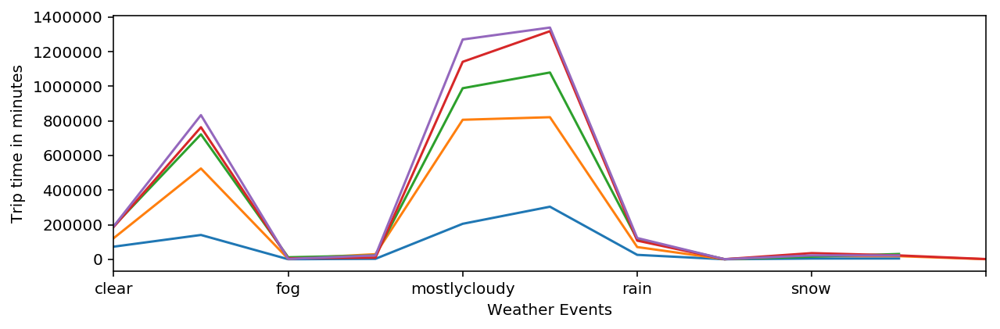

In [415]:
fig = plt.figure(figsize=(10,3))
ax = fig.add_subplot(111)

y13 = divvyTrips.loc[divvyTrips['Year'] == 2013,['Year','events','trip_id']].groupby('events')['trip_id'].size()
y14 = divvyTrips.loc[divvyTrips['Year'] == 2014,['Year','events','trip_id']].groupby('events')['trip_id'].size()
y15 = divvyTrips.loc[divvyTrips['Year'] == 2015,['Year','events','trip_id']].groupby('events')['trip_id'].size()
y16 = divvyTrips.loc[divvyTrips['Year'] == 2016,['Year','events','trip_id']].groupby('events')['trip_id'].size()
y17 = divvyTrips.loc[divvyTrips['Year'] == 2017,['Year','events','trip_id']].groupby('events')['trip_id'].size()

y13.plot()
y14.plot()
y15.plot()
y16.plot()
y17.plot()
plt.xlabel('Weather Events')
plt.ylabel('Total Number of trips')

fig = plt.figure(figsize=(10,3))
ax = fig.add_subplot(111)

y13 = divvyTrips.loc[divvyTrips['Year'] == 2013,['Year','events','tripInMinutes']].groupby('events')['tripInMinutes'].size()
y14 = divvyTrips.loc[divvyTrips['Year'] == 2014,['Year','events','tripInMinutes']].groupby('events')['tripInMinutes'].size()
y15 = divvyTrips.loc[divvyTrips['Year'] == 2015,['Year','events','tripInMinutes']].groupby('events')['tripInMinutes'].size()
y16 = divvyTrips.loc[divvyTrips['Year'] == 2016,['Year','events','tripInMinutes']].groupby('events')['tripInMinutes'].size()
y17 = divvyTrips.loc[divvyTrips['Year'] == 2017,['Year','events','tripInMinutes']].groupby('events')['tripInMinutes'].size()

y13.plot()
y14.plot()
y15.plot()
y16.plot()
y17.plot()
plt.xlabel('Weather Events')
plt.ylabel('Trip time in minutes')

## Hourly

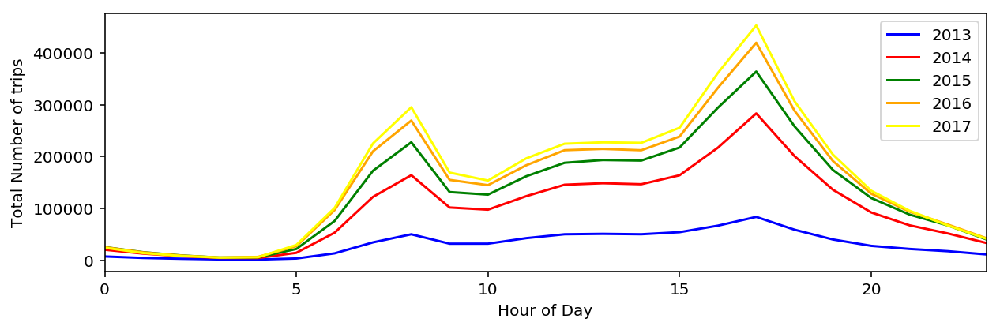

In [416]:
fig = plt.figure(figsize=(10,3))
ax = fig.add_subplot(111)
divvyTrips.starttime = pd.to_datetime(divvyTrips.starttime)
divvyTrips['Hour'] = divvyTrips.starttime.apply(lambda x: x.hour)
#df.assign(hour=df.datetime.dt.strftime('%H:%M:%S'))

y13 = divvyTrips.loc[divvyTrips['Year'] == 2013,['Hour','events','trip_id']].groupby('Hour')['trip_id'].size()
y14 = divvyTrips.loc[divvyTrips['Year'] == 2014,['Hour','events','trip_id']].groupby('Hour')['trip_id'].size()
y15 = divvyTrips.loc[divvyTrips['Year'] == 2015,['Hour','events','trip_id']].groupby('Hour')['trip_id'].size()
y16 = divvyTrips.loc[divvyTrips['Year'] == 2016,['Hour','events','trip_id']].groupby('Hour')['trip_id'].size()
y17 = divvyTrips.loc[divvyTrips['Year'] == 2017,['Hour','events','trip_id']].groupby('Hour')['trip_id'].size()

y13.plot(color='blue',label='2013')
y14.plot(color='red',label='2014')
y15.plot(color='green',label='2015')
y16.plot(color='orange',label='2016')
y17.plot(color='yellow',label='2017')
plt.xlabel('Hour of Day')
plt.ylabel('Total Number of trips')
ax.legend(['2013','2014','2015','2016','2017'], loc='best')  # legend for first two lines only


# Hourly distribution of Bike Rentals By Season

[Text(0,0.5,'Total Bike Rentals')]

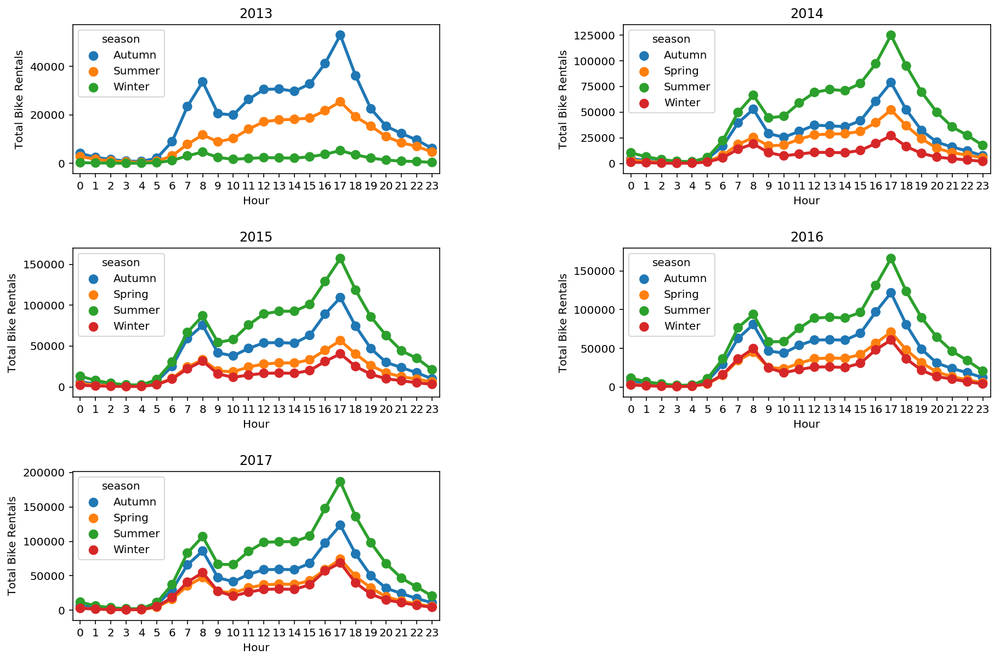

In [417]:
fig = plt.figure(figsize=(15,10))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
# Divide the figure into a 2x1 grid, and give me the first section
#ax1 = fig.add_subplot(211)
# Divide the figure into a 2x1 grid, and give me the second section
#ax2 = fig.add_subplot(212)

ax1 = fig.add_subplot(321)
ax2 = fig.add_subplot(322)
ax3 = fig.add_subplot(323)
ax4 = fig.add_subplot(324)
ax5 = fig.add_subplot(325)

y13 = divvyTrips[divvyTrips['Year'] == 2013].groupby(['season','Hour']).agg({'trip_id':'count'})
y13.reset_index(inplace=True)
y14 = divvyTrips[divvyTrips['Year'] == 2014].groupby(['season','Hour']).agg({'trip_id':'count'})
y14.reset_index(inplace=True)
y15 = divvyTrips[divvyTrips['Year'] == 2015].groupby(['season','Hour']).agg({'trip_id':'count'})
y15.reset_index(inplace=True)
y16 = divvyTrips[divvyTrips['Year'] == 2016].groupby(['season','Hour']).agg({'trip_id':'count'})
y16.reset_index(inplace=True)
y17 = divvyTrips[divvyTrips['Year'] == 2017].groupby(['season','Hour']).agg({'trip_id':'count'})
y17.reset_index(inplace=True)

sns.pointplot(data=y13,x='Hour',y='trip_id',hue='season',ax=ax1)
ax1.set(title="2013")
ax1.set(ylabel="Total Bike Rentals")

sns.pointplot(data=y14,x='Hour',y='trip_id',hue='season',ax=ax2)
ax2.set(title="2014")
ax2.set(ylabel="Total Bike Rentals")

sns.pointplot(data=y15,x='Hour',y='trip_id',hue='season',ax=ax3)
ax3.set(title="2015")
ax3.set(ylabel="Total Bike Rentals")

sns.pointplot(data=y16,x='Hour',y='trip_id',hue='season',ax=ax4)
ax4.set(title="2016")
ax4.set(ylabel="Total Bike Rentals")

sns.pointplot(data=y17,x='Hour',y='trip_id',hue='season',ax=ax5)
ax5.set(title="2017")
ax5.set(ylabel="Total Bike Rentals")


[Text(0,0.5,'Total Distance In Meters')]

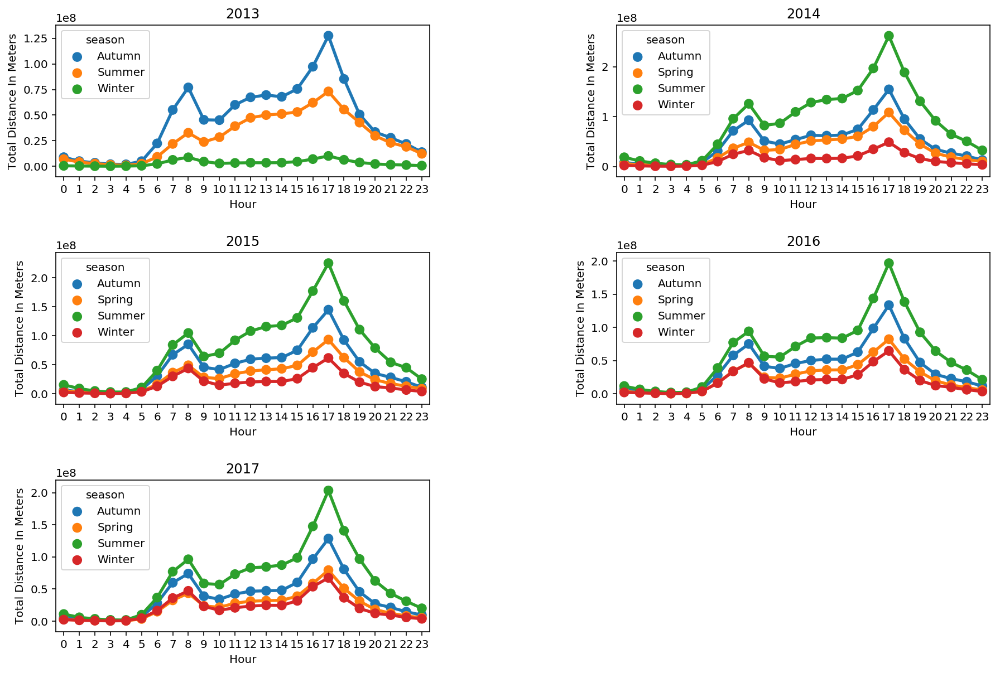

In [418]:
fig = plt.figure(figsize=(15,10))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
# Divide the figure into a 2x1 grid, and give me the first section
#ax1 = fig.add_subplot(211)
# Divide the figure into a 2x1 grid, and give me the second section
#ax2 = fig.add_subplot(212)

ax1 = fig.add_subplot(321)
ax2 = fig.add_subplot(322)
ax3 = fig.add_subplot(323)
ax4 = fig.add_subplot(324)
ax5 = fig.add_subplot(325)

y13 = divvyTrips[divvyTrips['Year'] == 2013].groupby(['season','Hour']).agg({'distance_in_meters':'sum'})
y13.reset_index(inplace=True)
y14 = divvyTrips[divvyTrips['Year'] == 2014].groupby(['season','Hour']).agg({'distance_in_meters':'sum'})
y14.reset_index(inplace=True)
y15 = divvyTrips[divvyTrips['Year'] == 2015].groupby(['season','Hour']).agg({'distance_in_meters':'sum'})
y15.reset_index(inplace=True)
y16 = divvyTrips[divvyTrips['Year'] == 2016].groupby(['season','Hour']).agg({'distance_in_meters':'sum'})
y16.reset_index(inplace=True)
y17 = divvyTrips[divvyTrips['Year'] == 2017].groupby(['season','Hour']).agg({'distance_in_meters':'sum'})
y17.reset_index(inplace=True)

sns.pointplot(data=y13,x='Hour',y='distance_in_meters',hue='season',ax=ax1)
ax1.set(title="2013")
ax1.set(ylabel="Total Distance In Meters")

sns.pointplot(data=y14,x='Hour',y='distance_in_meters',hue='season',ax=ax2)
ax2.set(title="2014")
ax2.set(ylabel="Total Distance In Meters")

sns.pointplot(data=y15,x='Hour',y='distance_in_meters',hue='season',ax=ax3)
ax3.set(title="2015")
ax3.set(ylabel="Total Distance In Meters")

sns.pointplot(data=y16,x='Hour',y='distance_in_meters',hue='season',ax=ax4)
ax4.set(title="2016")
ax4.set(ylabel="Total Distance In Meters")

sns.pointplot(data=y17,x='Hour',y='distance_in_meters',hue='season',ax=ax5)
ax5.set(title="2017")
ax5.set(ylabel="Total Distance In Meters")


[Text(0,0.5,'Total duration In minutes')]

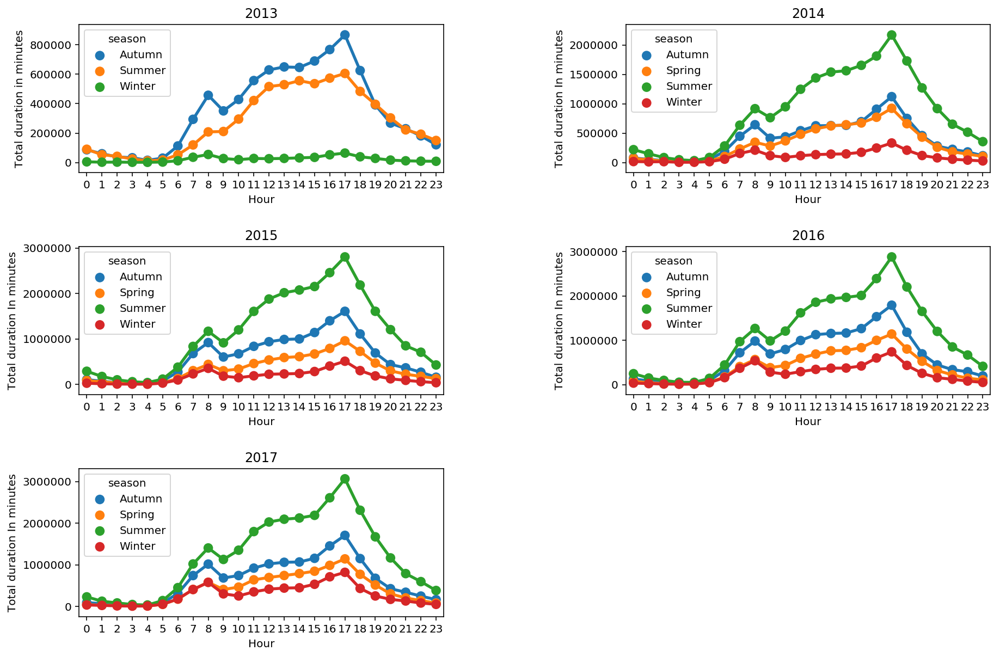

In [419]:
fig = plt.figure(figsize=(15,10))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
# Divide the figure into a 2x1 grid, and give me the first section
#ax1 = fig.add_subplot(211)
# Divide the figure into a 2x1 grid, and give me the second section
#ax2 = fig.add_subplot(212)

ax1 = fig.add_subplot(321)
ax2 = fig.add_subplot(322)
ax3 = fig.add_subplot(323)
ax4 = fig.add_subplot(324)
ax5 = fig.add_subplot(325)

y13 = divvyTrips[divvyTrips['Year'] == 2013].groupby(['season','Hour']).agg({'tripInMinutes':'sum'})
y13.reset_index(inplace=True)
y14 = divvyTrips[divvyTrips['Year'] == 2014].groupby(['season','Hour']).agg({'tripInMinutes':'sum'})
y14.reset_index(inplace=True)
y15 = divvyTrips[divvyTrips['Year'] == 2015].groupby(['season','Hour']).agg({'tripInMinutes':'sum'})
y15.reset_index(inplace=True)
y16 = divvyTrips[divvyTrips['Year'] == 2016].groupby(['season','Hour']).agg({'tripInMinutes':'sum'})
y16.reset_index(inplace=True)
y17 = divvyTrips[divvyTrips['Year'] == 2017].groupby(['season','Hour']).agg({'tripInMinutes':'sum'})
y17.reset_index(inplace=True)

sns.pointplot(data=y13,x='Hour',y='tripInMinutes',hue='season',ax=ax1)
ax1.set(title="2013")
ax1.set(ylabel="Total duration in minutes")

sns.pointplot(data=y14,x='Hour',y='tripInMinutes',hue='season',ax=ax2)
ax2.set(title="2014")
ax2.set(ylabel="Total duration In minutes")

sns.pointplot(data=y15,x='Hour',y='tripInMinutes',hue='season',ax=ax3)
ax3.set(title="2015")
ax3.set(ylabel="Total duration In minutes")

sns.pointplot(data=y16,x='Hour',y='tripInMinutes',hue='season',ax=ax4)
ax4.set(title="2016")
ax4.set(ylabel="Total duration In minutes")

sns.pointplot(data=y17,x='Hour',y='tripInMinutes',hue='season',ax=ax5)
ax5.set(title="2017")
ax5.set(ylabel="Total duration In minutes")


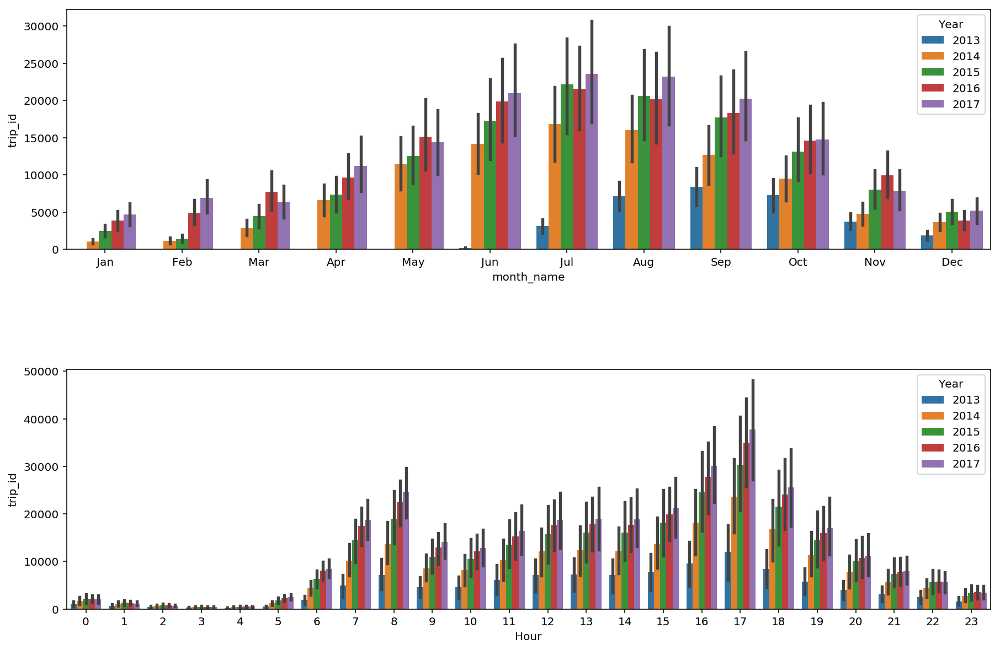

In [421]:
fig = plt.figure(figsize=(15,10))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
# Divide the figure into a 2x1 grid, and give me the first section
#ax1 = fig.add_subplot(211)
# Divide the figure into a 2x1 grid, and give me the second section
#ax2 = fig.add_subplot(212)

ax1 = fig.add_subplot(211)
ax2 = fig.add_subplot(212)


tripsEvening = divvyTrips.groupby(['Month','month_name','Hour','Year']).agg({'trip_id':'count'})
tripsEvening.reset_index(inplace=True)
tripsEvening = tripsEvening.sort_values('Month',ascending=True)
#tripsEvening = tripsEvening.fillna(0).rolling(7)['months-year','Hour','Year','trip_id'].mean()
ax1=sns.barplot(data =tripsEvening, x=tripsEvening['month_name'], y=tripsEvening.trip_id, hue=tripsEvening.Year,ax=ax1)

tripsEvening = divvyTrips.groupby(['Month','month_name','Hour','Year']).agg({'trip_id':'count'})
tripsEvening.reset_index(inplace=True)
tripsEvening = tripsEvening.sort_values('Month',ascending=True)
#tripsEvening = tripsEvening.fillna(0).rolling(7)['months-year','Hour','Year','trip_id'].mean()
ax2=sns.barplot(data =tripsEvening, x=tripsEvening['Hour'], y=tripsEvening.trip_id, hue=tripsEvening.Year,ax=ax2)


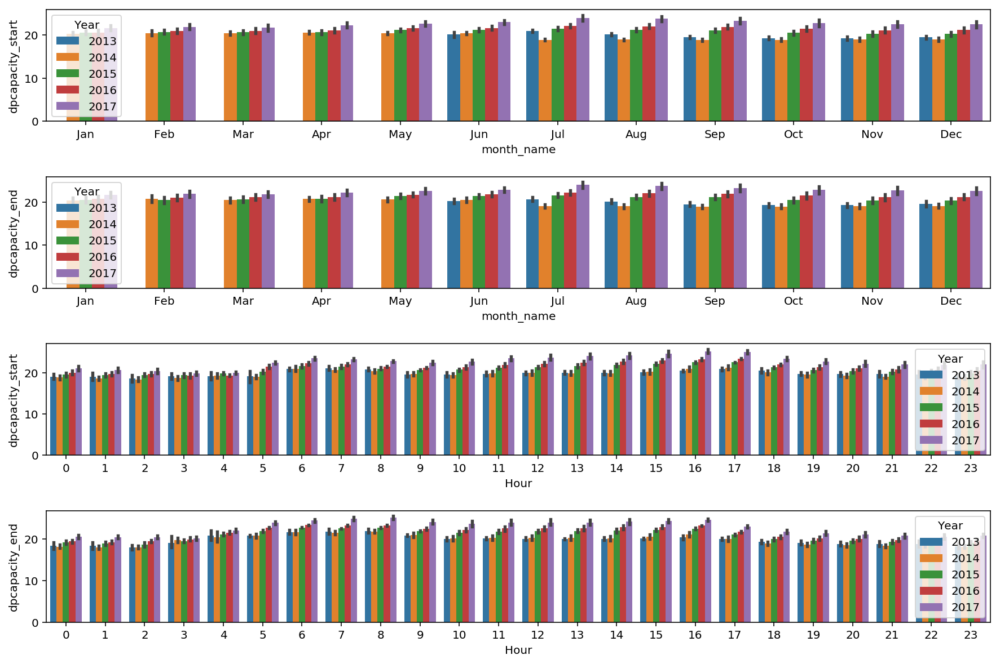

In [422]:
fig = plt.figure(figsize=(15,10))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
# Divide the figure into a 2x1 grid, and give me the first section
#ax1 = fig.add_subplot(211)
# Divide the figure into a 2x1 grid, and give me the second section
#ax2 = fig.add_subplot(212)

ax1 = fig.add_subplot(411)
ax2 = fig.add_subplot(412)
ax3 = fig.add_subplot(413)
ax4 = fig.add_subplot(414)

dpEvening = divvyTrips.groupby(['Month','month_name','Hour','Year']).agg({'dpcapacity_start':'mean'})
dpEvening.reset_index(inplace=True)
dpEvening = dpEvening.sort_values('Month',ascending=True)
#tripsEvening = tripsEvening.fillna(0).rolling(7)['months-year','Hour','Year','trip_id'].mean()
ax1=sns.barplot(data =dpEvening, x=dpEvening['month_name'], y=dpEvening.dpcapacity_start, hue=dpEvening.Year,ax=ax1)

dpEvening = divvyTrips.groupby(['Month','month_name','Hour','Year']).agg({'dpcapacity_end':'mean'})
dpEvening.reset_index(inplace=True)
dpEvening = dpEvening.sort_values('Month',ascending=True)
#tripsEvening = tripsEvening.fillna(0).rolling(7)['months-year','Hour','Year','trip_id'].mean()
ax2=sns.barplot(data =dpEvening, x=dpEvening['month_name'], y=dpEvening.dpcapacity_end, hue=dpEvening.Year,ax=ax2)


dpEvening = divvyTrips.groupby(['Month','month_name','Hour','Year']).agg({'dpcapacity_start':'mean'})
dpEvening.reset_index(inplace=True)
dpEvening = dpEvening.sort_values('Month',ascending=True)
#tripsEvening = tripsEvening.fillna(0).rolling(7)['months-year','Hour','Year','trip_id'].mean()
ax3=sns.barplot(data =dpEvening, x=dpEvening['Hour'], y=dpEvening.dpcapacity_start, hue=dpEvening.Year,ax=ax3)

dpEvening = divvyTrips.groupby(['Month','month_name','Hour','Year']).agg({'dpcapacity_end':'mean'})
dpEvening.reset_index(inplace=True)
dpEvening = dpEvening.sort_values('Month',ascending=True)
#tripsEvening = tripsEvening.fillna(0).rolling(7)['months-year','Hour','Year','trip_id'].mean()
ax4=sns.barplot(data =dpEvening, x=dpEvening['Hour'], y=dpEvening.dpcapacity_end, hue=dpEvening.Year,ax=ax4)


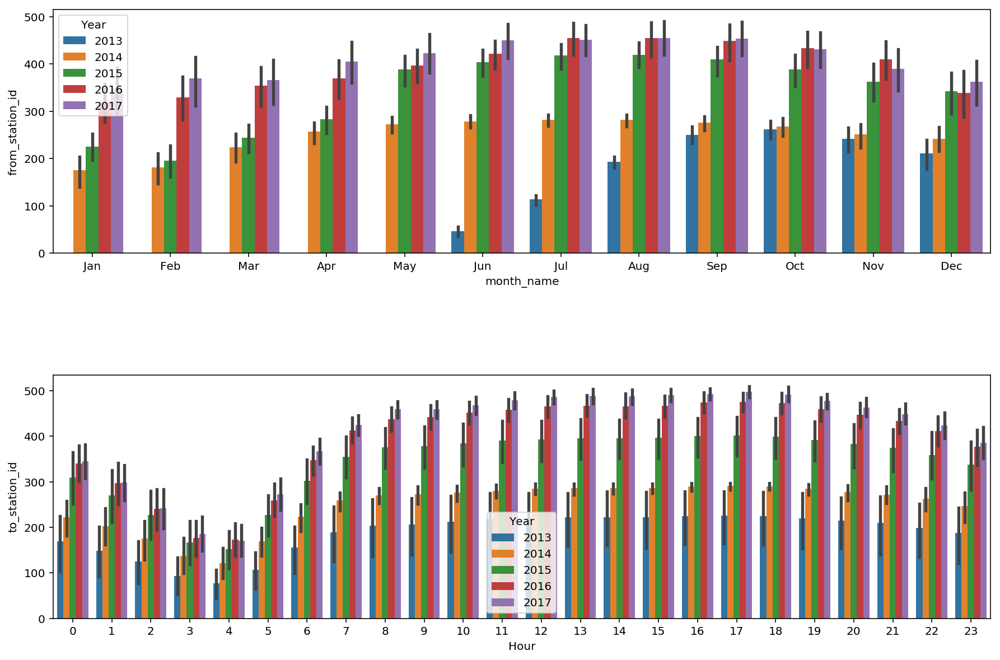

In [423]:
fig = plt.figure(figsize=(15,10))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
# Divide the figure into a 2x1 grid, and give me the first section
#ax1 = fig.add_subplot(211)
# Divide the figure into a 2x1 grid, and give me the second section
#ax2 = fig.add_subplot(212)

ax1 = fig.add_subplot(211)
ax2 = fig.add_subplot(212)


#divvyTrips['startdate'] = divvyTrips.starttime.dt.date
tripsEvening = divvyTrips.groupby(['Month','month_name','Hour','Year']).agg({'from_station_id':pd.Series.nunique})
tripsEvening.reset_index(inplace=True)
tripsEvening = tripsEvening.sort_values('Month',ascending=True)
#tripsEvening = tripsEvening.fillna(0).rolling(7)['months-year','Hour','Year','trip_id'].mean()
ax1=sns.barplot(data =tripsEvening, x=tripsEvening['month_name'], y=tripsEvening.from_station_id, hue=tripsEvening.Year,ax=ax1)

#divvyTrips['startdate'] = divvyTrips.starttime.dt.date
tripsEvening = divvyTrips.groupby(['Month','month_name','Hour','Year']).agg({'to_station_id':pd.Series.nunique})
tripsEvening.reset_index(inplace=True)
tripsEvening = tripsEvening.sort_values('Month',ascending=True)
#tripsEvening = tripsEvening.fillna(0).rolling(7)['months-year','Hour','Year','trip_id'].mean()
ax2=sns.barplot(data =tripsEvening, x=tripsEvening['Hour'], y=tripsEvening.to_station_id, hue=tripsEvening.Year,ax=ax2)


# How frequently are the stations used for bike rentals?

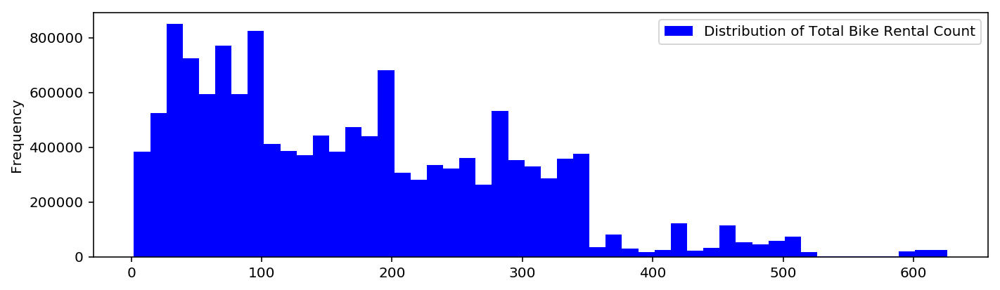

In [424]:
fig = plt.figure(figsize=(10,3))
divvyTrips['from_station_id'].plot(kind='hist',bins = 50 \
            #, ylabel = 'Frequency of Rental' \
            #, xlabel = 'Total Bike Rental Count' \
            , label = 'Distribution of Total Bike Rental Count' \
            , color = 'blue' \
            , legend=True
)
ax.set_ylabel('Frequency of Rental')
ax.set_xlabel('Total Bike Rental Count')
fig.tight_layout()
plt.show()

## Average Number of Trips in 5 mins by day of week

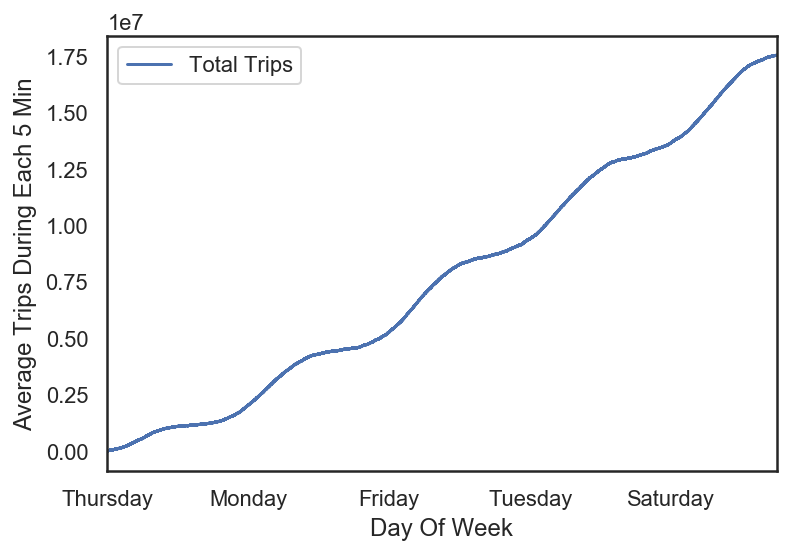

In [565]:
fig = plt.figure(figsize=(15,3))


divvyTrips.index = pd.to_datetime(divvyTrips.starttime,unit='s')
tripStartEvery5Min = divvyTrips['trip_id'].resample('5T').mean()
tripStartEvery5Min = tripStartEvery5Min.to_frame().reset_index()
tripStartEvery5Min['DayOfWeek'] = tripStartEvery5Min['starttime'].apply(lambda d: d.weekday_name)
tripStartEvery5Min['DOW'] = tripStartEvery5Min['starttime'].apply(lambda d: d.dayofweek)
tripStartEvery5Min = tripStartEvery5Min.sort_values(['starttime','DOW'],ascending=True)
tripStartEvery5Min.rename(columns={'trip_id':'Total Trips'},inplace=True)
tripStartEvery5Min.plot(kind='line',x='DayOfWeek',y='Total Trips')
plt.xlabel('Day Of Week')
plt.ylabel('Average Trips During Each 5 Min')
plt.show()


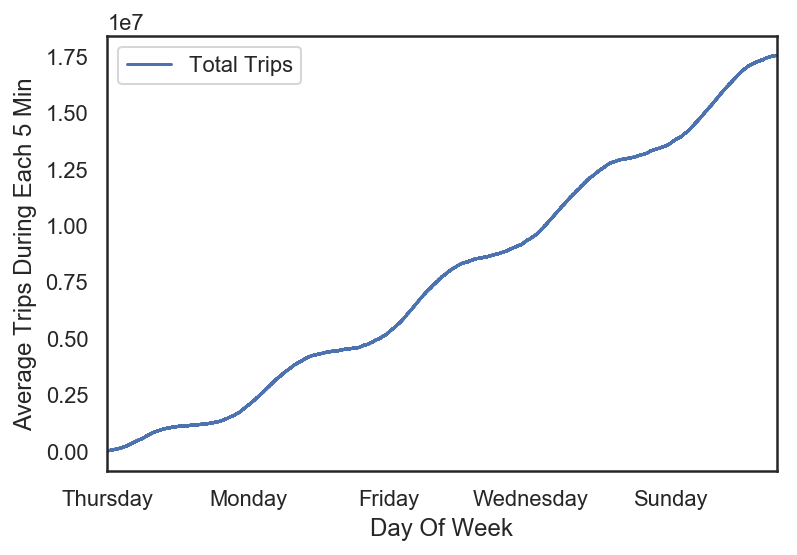

In [566]:
divvyTrips.index = pd.to_datetime(divvyTrips.stoptime,unit='s')
tripStopEvery5Min = divvyTrips['trip_id'].resample('5T').mean()
tripStopEvery5Min = tripStopEvery5Min.to_frame().reset_index()
tripStopEvery5Min['DayOfWeek'] = tripStopEvery5Min['stoptime'].apply(lambda d: d.weekday_name)
tripStopEvery5Min['DOW'] = tripStopEvery5Min['stoptime'].apply(lambda d: d.dayofweek)
tripStopEvery5Min = tripStopEvery5Min.sort_values(['stoptime','DOW'],ascending=True)
tripStopEvery5Min.rename(columns={'trip_id':'Total Trips'},inplace=True)
tripStopEvery5Min.plot(kind='line',x='DayOfWeek',y='Total Trips')
plt.xlabel('Day Of Week')
plt.ylabel('Average Trips During Each 5 Min')
plt.show()

## DOCK CAPACITY ANALYSIS

## Total Docks and Total Stations  

Text(0.5,1,'Total Docks over time')

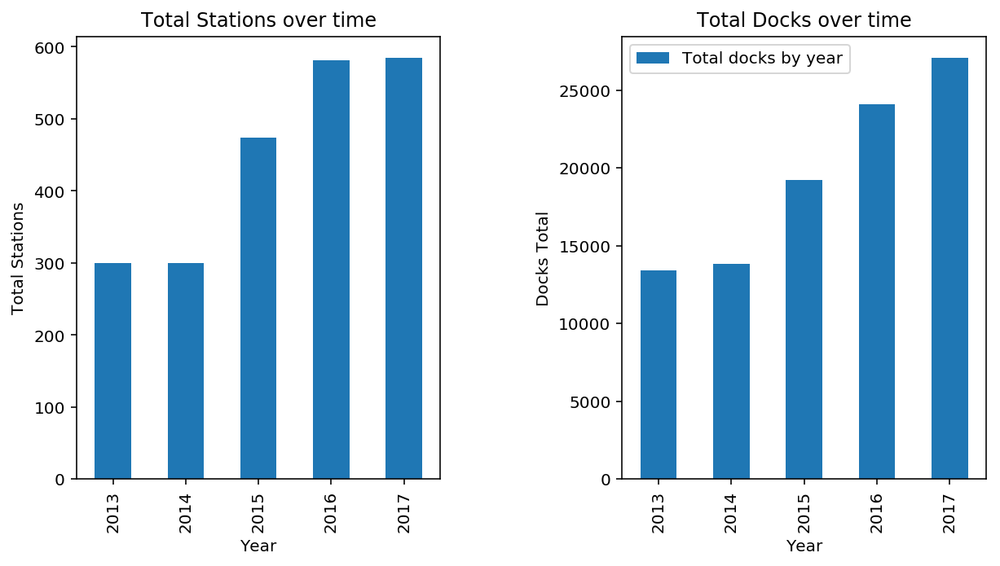

In [425]:
fig = plt.figure(figsize=(10,5))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
fig.subplots_adjust(hspace=1.0, wspace=0.5)

totalStationsByYear = divvyTrips.groupby('Year')['to_station_id'].nunique()
totalStationsByYear.plot(kind='bar',ax=ax1,label='Total stations by year')
ax1.set_xlabel('Year')
ax1.set_ylabel('Total Stations')
ax1.set_title('Total Stations over time')

docksAtStation = divvyTrips.groupby(['to_station_id','Year']).agg({'dpcapacity_start':'max'})
docksAtStation.dpcapacity_start = docksAtStation.dpcapacity_start.apply(int)
docksAtStation.reset_index(inplace=True)
docksAtStation.drop_duplicates()

totalDocksByYear = docksAtStation.groupby('Year').agg({'dpcapacity_start':'sum'})
totalDocksByYear.reset_index(inplace=True)
totalDocksByYear.plot(kind='bar',x='Year',y='dpcapacity_start',ax=ax2,label='Total docks by year')
ax2.set_xlabel('Year')
ax2.set_ylabel('Docks Total')
ax2.set_title('Total Docks over time')


# Top 10 stations with high bike rental engagement

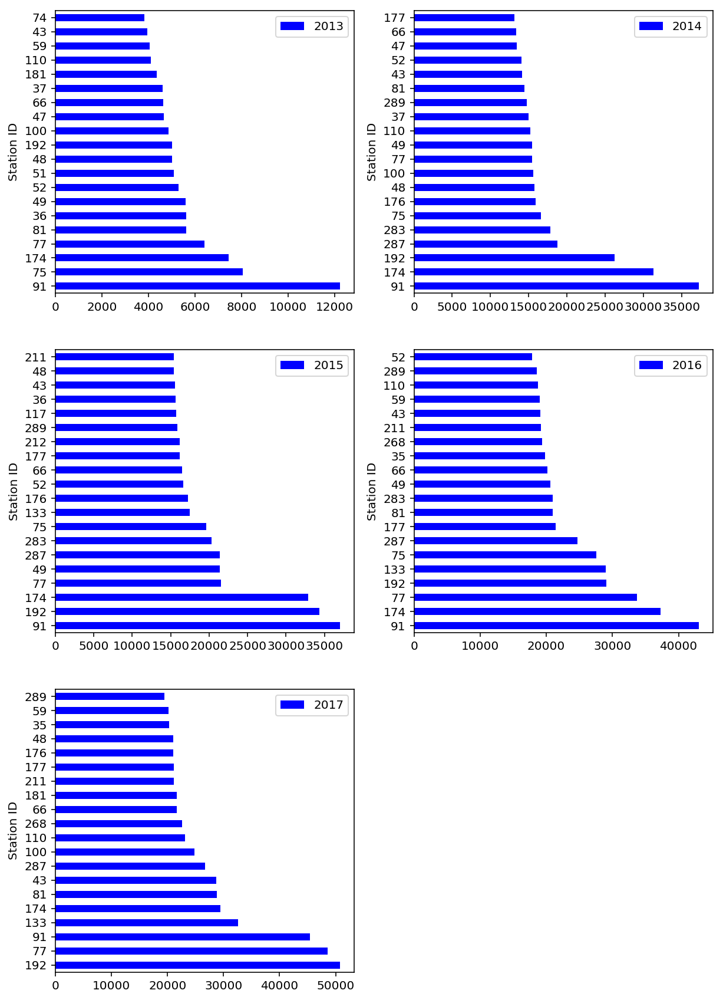

In [426]:
fig = plt.figure(figsize=(10,15))
ax1 = fig.add_subplot(321)
ax2 = fig.add_subplot(322)
ax3 = fig.add_subplot(323)
ax4 = fig.add_subplot(324)
ax5 = fig.add_subplot(325)
#fig.subplots_adjust(hspace=1.0, wspace=0.5)

subscribersStationUsage = divvyTrips[divvyTrips.usertype=='Subscriber'].groupby(['to_station_id','Year']).agg({'usertype':'count'})
subscribersStationUsage.reset_index(inplace=True)
subscribersStationUsage.rename(columns={'to_station_id': 'Station ID','usertype': 'Total Subscribers'},inplace=True)

s13 = subscribersStationUsage[subscribersStationUsage.Year == 2013].sort_values('Total Subscribers',ascending=False).head(20)
s14 = subscribersStationUsage[subscribersStationUsage.Year == 2014].sort_values('Total Subscribers',ascending=False).head(20)
s15 = subscribersStationUsage[subscribersStationUsage.Year == 2015].sort_values('Total Subscribers',ascending=False).head(20)
s16 = subscribersStationUsage[subscribersStationUsage.Year == 2016].sort_values('Total Subscribers',ascending=False).head(20)
s17 = subscribersStationUsage[subscribersStationUsage.Year == 2017].sort_values('Total Subscribers',ascending=False).head(20)


ax1 = s13.plot(kind='barh',y="Total Subscribers", x="Station ID", 
            label="2013", color="b",ax=ax1)
ax2 = s14.plot(kind='barh',y="Total Subscribers", x="Station ID", 
            label="2014", color="b",ax=ax2)
ax3 = s15.plot(kind='barh',y="Total Subscribers", x="Station ID", 
            label="2015", color="b",ax=ax3)
ax4 = s16.plot(kind='barh',y="Total Subscribers", x="Station ID", 
            label="2016", color="b",ax=ax4)
ax5 = s17.plot(kind='barh',y="Total Subscribers", x="Station ID", 
            label="2017", color="b",ax=ax5)

highUsageStationIds = s13['Station ID'].append(s14['Station ID']).append(s15['Station ID']).append(s16['Station ID']).append(s17['Station ID'])

highUsageStationIds = highUsageStationIds.unique()

## Top 20 stations with low Bike Rentals

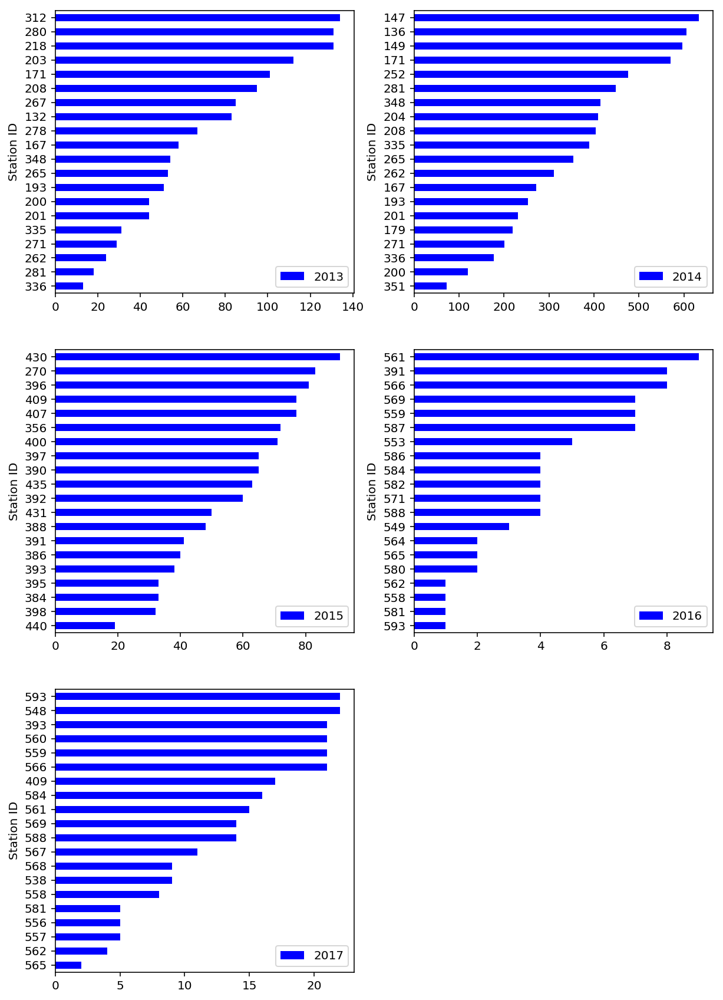

In [427]:
fig = plt.figure(figsize=(10,15))
ax1 = fig.add_subplot(321)
ax2 = fig.add_subplot(322)
ax3 = fig.add_subplot(323)
ax4 = fig.add_subplot(324)
ax5 = fig.add_subplot(325)

s13 = subscribersStationUsage[subscribersStationUsage.Year == 2013].sort_values('Total Subscribers',ascending=True).head(20)
s14 = subscribersStationUsage[subscribersStationUsage.Year == 2014].sort_values('Total Subscribers',ascending=True).head(20)
s15 = subscribersStationUsage[subscribersStationUsage.Year == 2015].sort_values('Total Subscribers',ascending=True).head(20)
s16 = subscribersStationUsage[subscribersStationUsage.Year == 2016].sort_values('Total Subscribers',ascending=True).head(20)
s17 = subscribersStationUsage[subscribersStationUsage.Year == 2017].sort_values('Total Subscribers',ascending=True).head(20)


ax1 = s13.plot(kind='barh',y="Total Subscribers", x="Station ID", 
            label="2013", color="b",ax=ax1)
ax2 = s14.plot(kind='barh',y="Total Subscribers", x="Station ID", 
            label="2014", color="b",ax=ax2)
ax3 = s15.plot(kind='barh',y="Total Subscribers", x="Station ID", 
            label="2015", color="b",ax=ax3)
ax4 = s16.plot(kind='barh',y="Total Subscribers", x="Station ID", 
            label="2016", color="b",ax=ax4)
ax5 = s17.plot(kind='barh',y="Total Subscribers", x="Station ID", 
            label="2017", color="b",ax=ax5)

lowUsageStationIds = s13['Station ID'].append(s14['Station ID']).append(s15['Station ID']).append(s16['Station ID']).append(s17['Station ID'])

lowUsageStationIds = lowUsageStationIds.unique()

# Origin Destination Matrix : Top trending and under utilized station pairs for bike rentals in Summer Season

In [428]:
originDestMatrix = divvyTrips[divvyTrips.season=='Summer'].groupby(['from_station_id','to_station_id']).\
agg({
#'tripInMinutes': 'sum',
#,'distance_in_meters': 'sum',
'trip_id': 'count'
})
#originDestMatrix = highUsageStationFirstTrip.to_frame().reset_index()
originDestMatrix.rename(columns={'from_station_id':'Origin Station'
                               ,'to_station_id':'Destination Station'
                               #,'tripInMinutes':'Duration in Minutes'
                               #,'distance_in_meters' : 'Distance',
                                ,'trip_id' : 'Total Bike Rentals'
                               }
                      ,inplace=True)
originDestMatrix.reset_index(inplace=True)
originDestMatrix.drop_duplicates(inplace=True)
originDestMatrix.head(2)


,from_station_id,to_station_id,Total Bike Rentals
0,2,2,2581
1,2,3,1322


In [429]:
top100Stations = originDestMatrix.sort_values('Total Bike Rentals',ascending=False).head(100)
top100TripCount = top100Stations['Total Bike Rentals'].count()


df1 = pd.DataFrame(pd.np.concatenate([top100Stations.values, top100Stations.values[:, [1,0,2]]])).drop_duplicates()
top100StationPairs = pd.pivot_table(df1,index=0,columns=1,values=2).fillna(0)


In [430]:
top100rangeStations = originDestMatrix[(originDestMatrix['Total Bike Rentals'] > 500) & (originDestMatrix['Total Bike Rentals'] < top100Stations['Total Bike Rentals'].min())].sort_values('Total Bike Rentals',ascending=False).head(100)
top100rangeTripCount = top100rangeStations['Total Bike Rentals'].count()


df3 = pd.DataFrame(pd.np.concatenate([top100rangeStations.values, top100rangeStations.values[:, [1,0,2]]])).drop_duplicates()
top100rangeStationPairs = pd.pivot_table(df3,index=0,columns=1,values=2).fillna(0)


In [431]:

bottom100rangeStations = originDestMatrix[(originDestMatrix['Total Bike Rentals'] > 500) & (originDestMatrix['Total Bike Rentals'] < top100Stations['Total Bike Rentals'].min())].sort_values('Total Bike Rentals',ascending=True).head(100)
bottom100rangeTripCount = bottom100rangeStations['Total Bike Rentals'].count()


df4 = pd.DataFrame(pd.np.concatenate([bottom100rangeStations.values, bottom100rangeStations.values[:, [1,0,2]]])).drop_duplicates()
bottom100rangeStationPairs = pd.pivot_table(df4,index=0,columns=1,values=2).fillna(0)


In [432]:
bottom100StationPairs = originDestMatrix.sort_values('Total Bike Rentals',ascending=True).head(100)
bottom100TripCount = bottom100StationPairs['Total Bike Rentals'].count()

df2 = pd.DataFrame(pd.np.concatenate([bottom100StationPairs.values, bottom100StationPairs.values[:, [1,0,2]]])).drop_duplicates()
bottom100StationPairs = pd.pivot_table(df2,index=0,columns=1,values=2).fillna(0)


Text(0.5,1,'Under utilized Origin and Destination Stations')

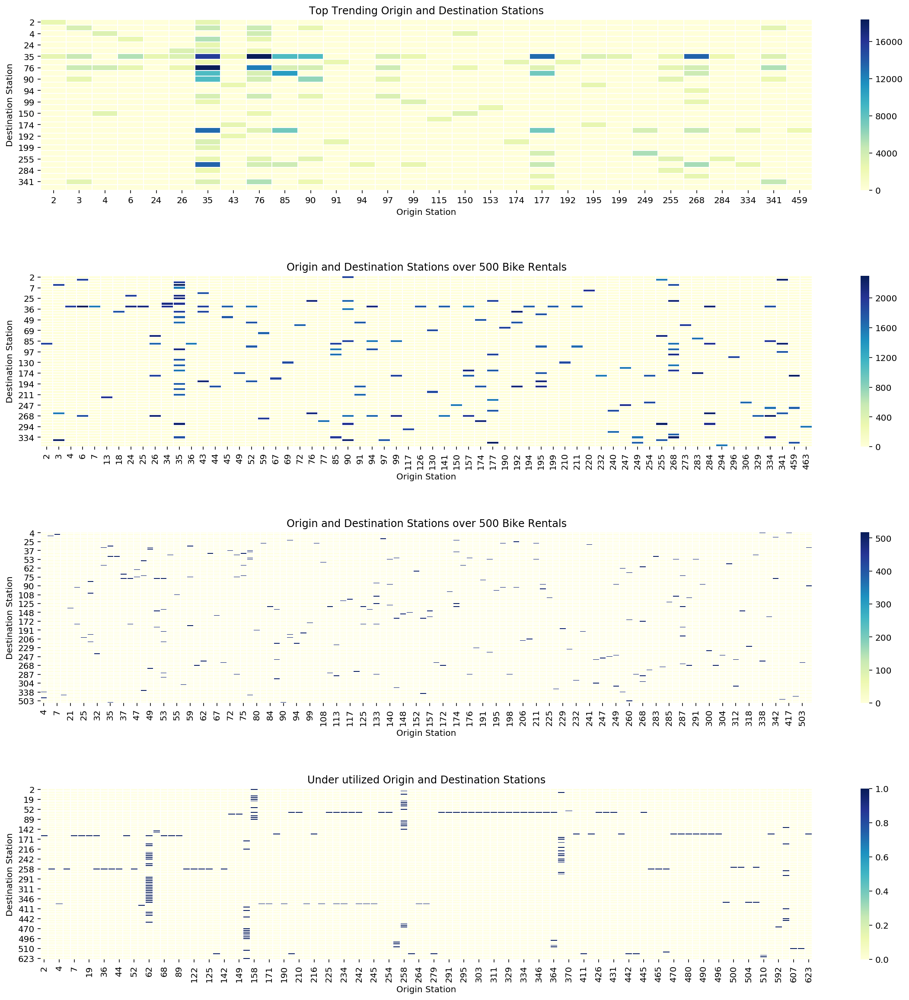

In [433]:

fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(411)
ax2 = fig.add_subplot(412)
ax3 = fig.add_subplot(413)
ax4 = fig.add_subplot(414)

fig.subplots_adjust(hspace=0.5)

#Divide by total trips
top100StationPairs.divide(top100TripCount,axis=1)
sns.heatmap(top100StationPairs,cmap="YlGnBu",linewidths=0.5,ax=ax1)
ax1.set_xlabel('Origin Station')
ax1.set_ylabel('Destination Station')
ax1.set_title('Top Trending Origin and Destination Stations')

top100rangeStationPairs.divide(top100rangeTripCount,axis=1)
sns.heatmap(top100rangeStationPairs,cmap="YlGnBu",linewidths=0.5,ax=ax2)
ax2.set_xlabel('Origin Station')
ax2.set_ylabel('Destination Station')
ax2.set_title('Origin and Destination Stations over 500 Bike Rentals')

bottom100rangeStationPairs.divide(bottom100rangeTripCount,axis=1)
sns.heatmap(bottom100rangeStationPairs,cmap="YlGnBu",linewidths=0.5,ax=ax3)
ax3.set_xlabel('Origin Station')
ax3.set_ylabel('Destination Station')
ax3.set_title('Origin and Destination Stations over 500 Bike Rentals')

bottom100StationPairs.divide(bottom100TripCount,axis=1)
sns.heatmap(bottom100StationPairs,cmap="YlGnBu",linewidths=0.5,ax=ax4)
ax4.set_xlabel('Origin Station')
ax4.set_ylabel('Destination Station')
ax4.set_title('Under utilized Origin and Destination Stations')


## Subscriber Cohort analysis

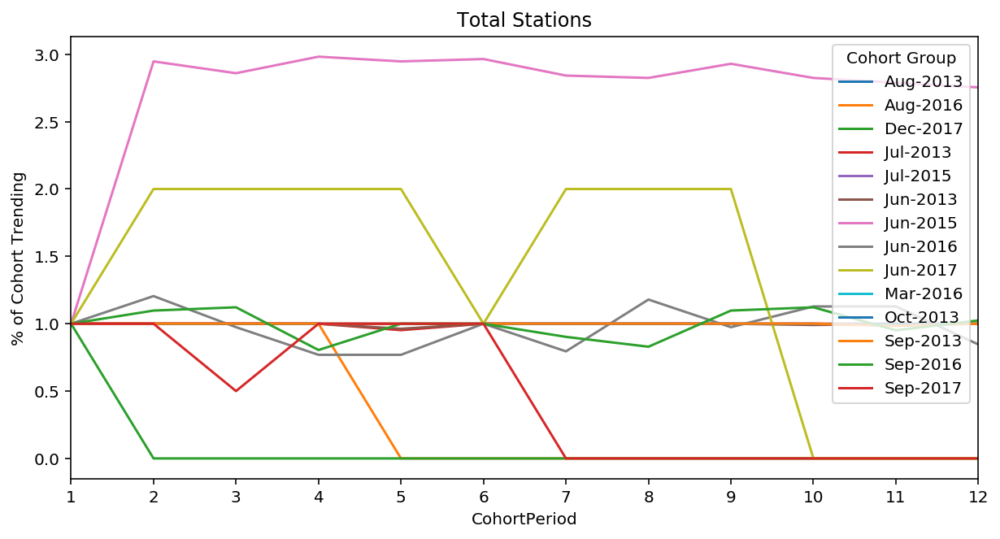

In [434]:
#highUsageStationFirstTrip = divvyTrips[divvyTrips.to_station_id.isin(highUsageStationIds)].groupby(['to_station_id'])['months-year'].first()
#lowUsageStationFirstTrip = divvyTrips[divvyTrips.to_station_id.isin(lowUsageStationIds)].groupby(['to_station_id'])['months-year'].first()

#Cohort Definition : First Trip month of every station
highUsageStationFirstTrip = divvyTrips.groupby(['from_station_id'])['months-year'].first()
stationCohorts = highUsageStationFirstTrip.to_frame().reset_index()
stationCohorts.rename(columns={'from_station_id':'Station ID','months-year':'Cohort Group'},inplace=True)
stationCohorts.head(2)

tripDetails = divvyTrips[(divvyTrips.usertype == 'Subscriber')]\
.groupby(['from_station_id','months-year'])\
.agg({'trip_id':'count', 'tripInMinutes':'sum','dpcapacity_start':'max','dpcapacity_end':'max'})
tripDetails.reset_index(inplace=True)

tripDetails.rename(columns={'from_station_id':'Station ID'
                            ,'months-year':'Trip Period'
                            ,'trip_id':'Bike Rentals Total'
                            ,'tripInMinutes':'Trip Duration in Minutes'
                            ,'dpcapacity_start':'Departure Dock Capacity'
                            ,'dpcapacity_end':'Arrival Dock Capacity'
                           },inplace=True)

tripDetails = tripDetails.merge(stationCohorts,left_on='Station ID',right_on='Station ID')
tripDetails.head(2)

cohorts = tripDetails.groupby(['Cohort Group', 'Trip Period'])\
.agg({'Station ID': pd.Series.nunique,
                       'Bike Rentals Total': 'sum',
                       'Trip Duration in Minutes':'sum'
                      })

# make the column names more meaningful
cohorts.rename(columns={'Station ID': 'Total Stations'}, inplace=True)

cohorts.head(2)

def cohort_period(df):
    """
    Creates a `CohortPeriod` column, which is the Nth period based on the user's first purchase.
    
    Example
    -------
    Say you want to get the 3rd month for every user:
        df.sort(['UserId', 'OrderTime', inplace=True)
        df = df.groupby('UserId').apply(cohort_period)
        df[df.CohortPeriod == 3]
    """
    df['CohortPeriod'] = np.arange(len(df)) + 1
    return df

cohorts = cohorts.groupby(level=0).apply(cohort_period)
cohorts.head(2)

# reindex the DataFrame
cohorts.reset_index(inplace=True)
cohorts.set_index(['Cohort Group', 'CohortPeriod'], inplace=True)

# create a Series holding the total size of each CohortGroup
cohort_group_size = cohorts['Total Stations'].groupby(level=0).first()
cohort_group_size.head()
cohorts['Total Stations'].unstack(0).head()
station_usage = cohorts['Total Stations'].unstack(0).fillna(0).divide(cohort_group_size, axis=1)
station_usage.head(2)


station_usage.plot(figsize=(10,5))
plt.title('Total Stations')
plt.xticks(np.arange(1, 12.1, 1))
plt.xlim(1, 12)
plt.ylabel('% of Cohort Trending');

#import seaborn as sns
#sns.set(style='white')

#plt.figure(figsize=(12, 8))
#plt.title('Cohorts: User Retention')
#sns.heatmap(station_usage.T, mask=station_usage.T.isnull(), annot=True, fmt='.0%');

## Docks volume in the stations over the years

Text(0.5,1,'Total Stations with more than 50 docks per station')

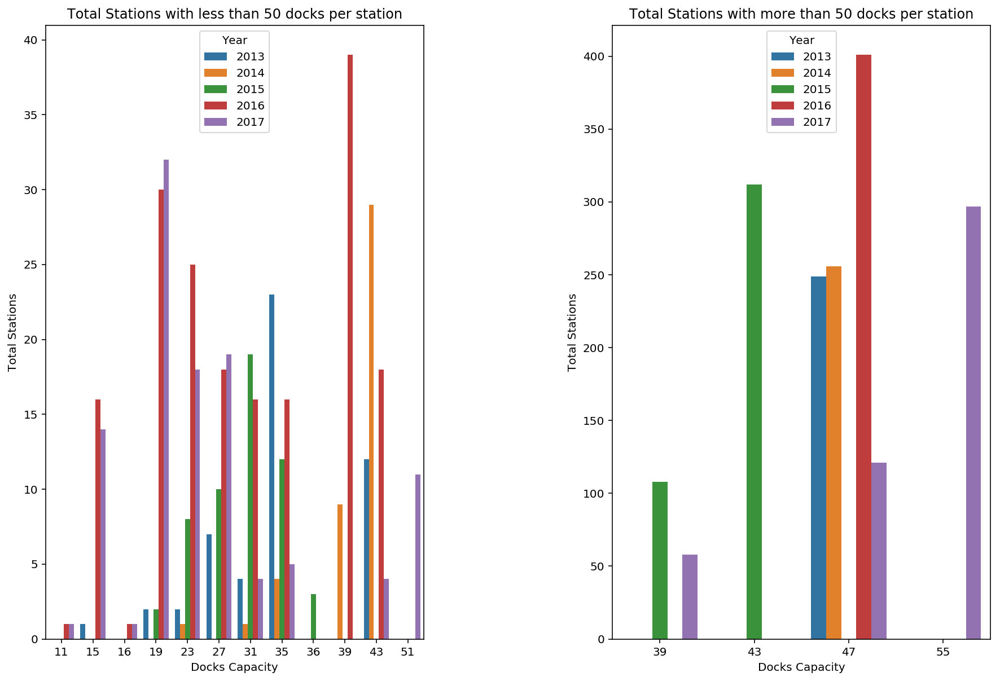

In [435]:
fig = plt.figure(figsize=(15,10))
ax3 = fig.add_subplot(121)
ax4 = fig.add_subplot(122)
fig.subplots_adjust(hspace=1.0, wspace=0.5)

totalStationsByDocks = docksAtStation.groupby(['dpcapacity_start','Year']).agg({'to_station_id':'count'})
totalStationsByDocks.reset_index(inplace=True)

totalStationsBelow50 = totalStationsByDocks.loc[(totalStationsByDocks.to_station_id <= 50),:]
ax3 = sns.barplot(x='dpcapacity_start',y='to_station_id',hue='Year',data=totalStationsBelow50,ax=ax3)
ax3.set_xlabel('Docks Capacity')
ax3.set_ylabel('Total Stations')
ax3.set_title('Total Stations with less than 50 docks per station')


totalStationsabove50 = totalStationsByDocks.loc[(totalStationsByDocks.to_station_id > 50),:]
ax4 = sns.barplot(x='dpcapacity_start',y='to_station_id',hue='Year',data=totalStationsabove50,ax=ax4)
ax4.set_xlabel('Docks Capacity')
ax4.set_ylabel('Total Stations')
ax4.set_title('Total Stations with more than 50 docks per station')


## Station Capacity Groups

usertype
Customer      AxesSubplot(0.125,0.125;0.775x0.755)
Subscriber    AxesSubplot(0.125,0.125;0.775x0.755)
Name: tripInMinutes, dtype: object

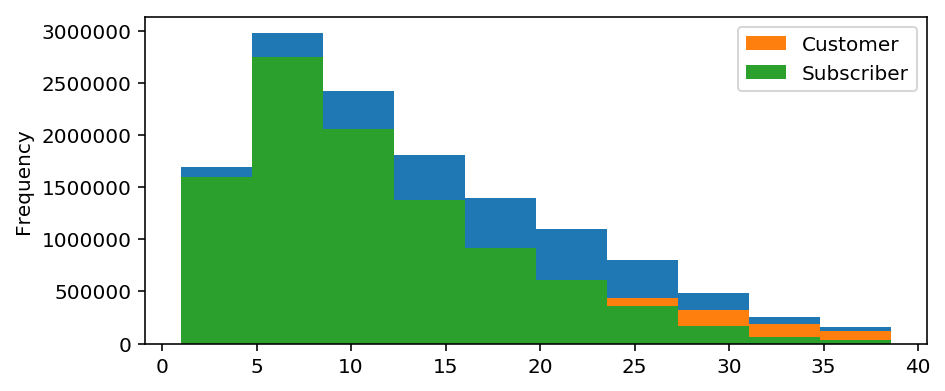

In [436]:
# check out trip in minutes distrubtion
tripDuration = divvyTrips['tripInMinutes']
tripDuration[tripDuration < tripDuration.quantile(.95)].plot(kind='hist')

divvyTrips[tripDuration < 
                 tripDuration.quantile(.95)]\
                .groupby('usertype')['tripInMinutes']\
    .plot(kind='hist', legend=True) 


## Station Utilization

In [437]:
divvyTrips['startdate'] = divvyTrips.starttime.dt.date
divvyTrips['stopdate'] = divvyTrips.stoptime.dt.date

In [438]:
## Origin

#Subset Monthly dock capacity data
totalDocksAtOrigStation = divvyTrips[divvyTrips['dpcapacity_start'] > 0].groupby(['from_station_id']).agg({'dpcapacity_start':'max'})
#totalDocksAtOrigStation.dpcapacity_start = totalDocksAtOrigStation['dpcapacity_start'].apply(lambda x: roundup(x))
totalDocksAtOrigStation.dpcapacity_start = totalDocksAtOrigStation.dpcapacity_start.fillna(0).apply(int)
totalDocksAtOrigStation.reset_index(inplace=True)
totalDocksAtOrigStation.drop_duplicates()
totalDocksAtOrigStation.rename(columns={'dpcapacity_start':'Yearly Average Dock Capacity'},inplace=True)

#Subset Hourly dock capacity data
docksAtOriginStation = divvyTrips[divvyTrips['dpcapacity_start'] > 0].groupby(['startdate','from_station_id','Year','Hour','Month','month_name','months-year','season']).agg({'dpcapacity_start':'mean'})
docksAtOriginStation.dpcapacity_start = docksAtOriginStation.dpcapacity_start.fillna(0).apply(int)
docksAtOriginStation.reset_index(inplace=True)
docksAtOriginStation.drop_duplicates()
docksAtOriginStation.rename(columns={'dpcapacity_start':'Hourly Average Dock Capacity'},inplace=True)

#Join Hourly and Monthly dock capacity data
originStnUtil = docksAtOriginStation.merge(totalDocksAtOrigStation, left_on=['from_station_id'],right_on=['from_station_id'],how='inner')

#Used Docks
originStnUtil['usedDocks'] = originStnUtil['Yearly Average Dock Capacity'] - originStnUtil['Hourly Average Dock Capacity']

originStnUtil['Utilization'] = originStnUtil['usedDocks'] / originStnUtil['Yearly Average Dock Capacity']*100 

##Destination
#Subset Monthly dock capacity data
totalDocksAtDestStation = divvyTrips[divvyTrips['dpcapacity_end'] > 0].groupby(['to_station_id']).agg({'dpcapacity_end':'max'})
#totalDocksAtDestStation.dpcapacity_end = totalDocksAtDestStation['dpcapacity_end'].apply(lambda x: roundup(x))
totalDocksAtDestStation.dpcapacity_end = totalDocksAtDestStation.dpcapacity_end.fillna(0).apply(int)
totalDocksAtDestStation.reset_index(inplace=True)
totalDocksAtDestStation.drop_duplicates()
totalDocksAtDestStation.rename(columns={'dpcapacity_end':'Yearly Average Dock Capacity'},inplace=True)


#Subset Hourly dock capacity data
docksAtDestStation = divvyTrips[divvyTrips['dpcapacity_end'] > 0].groupby(['startdate','to_station_id','Year','Hour','Month','month_name','months-year','season']).agg({'dpcapacity_end':'mean'})
docksAtDestStation.dpcapacity_end = docksAtDestStation.dpcapacity_end.fillna(0).apply(int)
docksAtDestStation.reset_index(inplace=True)
docksAtDestStation.drop_duplicates()
docksAtDestStation.rename(columns={'dpcapacity_end':'Hourly Average Dock Capacity'},inplace=True)

#Join Hourly and Monthly dock capacity data
destStnUtil = docksAtDestStation.merge(totalDocksAtDestStation, left_on=['to_station_id'],right_on=['to_station_id'],how='inner')

#Used Docks
destStnUtil['usedDocks'] = destStnUtil['Yearly Average Dock Capacity'] - destStnUtil['Hourly Average Dock Capacity']

destStnUtil['Utilization'] = destStnUtil['usedDocks'] / destStnUtil['Yearly Average Dock Capacity']*100 

# Rename Columns
originStnUtil.rename(columns={'Yearly Average Dock Capacity':'Average Dock Capacity'
                            ,'from_station_id': 'Station ID'
                            ,'usedDocks' : 'Unavailable Docks'
                            ,'Hourly Average Dock Capacity' : 'Hourly Average Dock Capacity'
                            ,'Utilization': 'Utilization'
                           },inplace=True)


destStnUtil.rename(columns={'Yearly Average Dock Capacity':'Average Dock Capacity'
                            ,'to_station_id': 'Station ID'
                            ,'usedDocks' : 'Unavailable Docks'
                            ,'Hourly Average Dock Capacity' : 'Hourly Average Dock Capacity'
                            ,'Utilization': 'Utilization'
                           },inplace=True)


In [439]:
stnOriginDestUtil = pd.concat([originStnUtil, destStnUtil], ignore_index=True)
stnOriginDestUtil = stnOriginDestUtil.drop_duplicates()
stnOriginDestUtil = stnOriginDestUtil.groupby(['Station ID','Hour','season','Year']).agg({'Utilization':'mean'
                                                                       ,'Unavailable Docks' : 'mean'
                                                                       ,'Average Dock Capacity' : 'max'
                                                                  })
stnOriginDestUtil.reset_index(inplace=True)
stnOriginDestUtil['Utilization'] = stnOriginDestUtil['Unavailable Docks'] / stnOriginDestUtil['Average Dock Capacity']*100 
stnOriginDestUtil[stnOriginDestUtil['Utilization'] > 50].groupby('Station ID').size()

#divvyTrips[(divvyTrips['from_station_id'] == 72)] #& (divvyTrips['Year'] == 2017)]['dpcapacity_end']

Station ID
47      94
72     299
76      97
97     115
150    153
195     96
199    383
240     98
249    139
255     96
268    134
315    230
341    297
344    231
dtype: int64

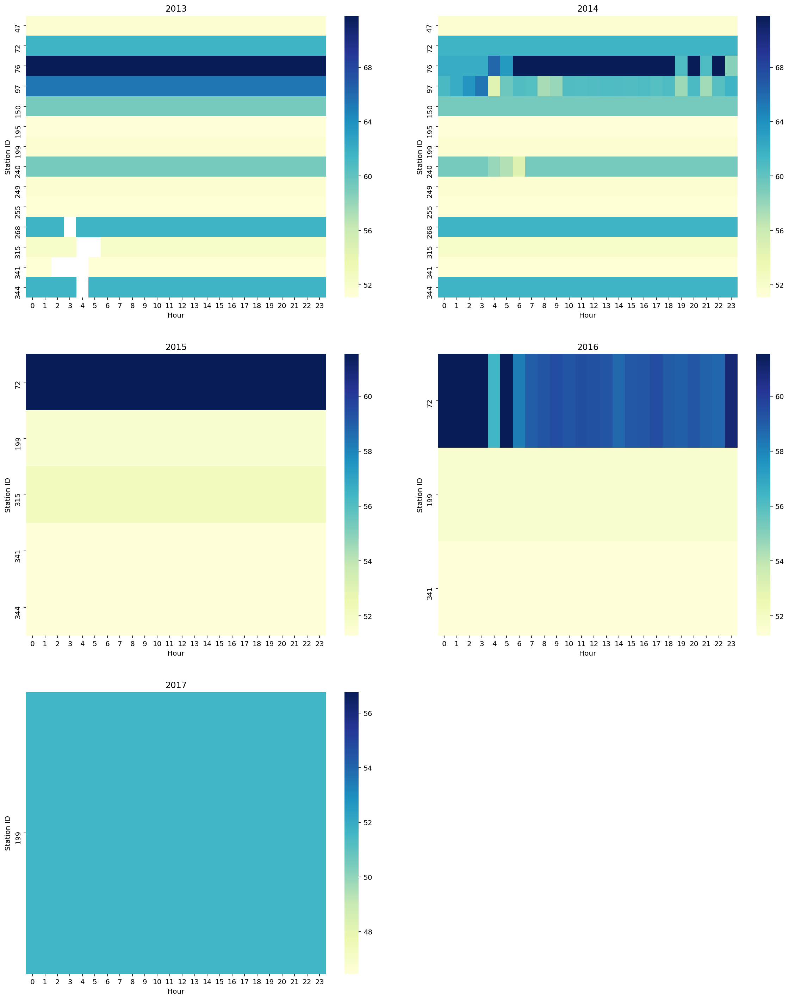

In [440]:
fig = plt.figure(figsize=(20,25))

ax1 = fig.add_subplot(321)
ax2 = fig.add_subplot(322)
ax3 = fig.add_subplot(323)
ax4 = fig.add_subplot(324)
ax5 = fig.add_subplot(325)

fig.subplots_adjust(hspace=0.2, wspace=0.1)

df13 = stnOriginDestUtil[(stnOriginDestUtil['Year'] == 2013)&(stnOriginDestUtil['Utilization'] > 50)].pivot_table(index='Station ID', columns='Hour', values='Utilization')

df14 = stnOriginDestUtil[(stnOriginDestUtil['Year'] == 2014)&(stnOriginDestUtil['Utilization'] > 50)].pivot_table(index='Station ID', columns='Hour', values='Utilization')

df15 = stnOriginDestUtil[(stnOriginDestUtil['Year'] == 2015)&(stnOriginDestUtil['Utilization'] > 50)].pivot_table(index='Station ID', columns='Hour', values='Utilization')

df16 = stnOriginDestUtil[(stnOriginDestUtil['Year'] == 2016)&(stnOriginDestUtil['Utilization'] > 50)].pivot_table(index='Station ID', columns='Hour', values='Utilization')

df17 = stnOriginDestUtil[(stnOriginDestUtil['Year'] == 2017)&(stnOriginDestUtil['Utilization'] > 50)].pivot_table(index='Station ID', columns='Hour', values='Utilization')

ax1=sns.heatmap(df13, annot=False, cmap='YlGnBu',fmt=".1f",ax=ax1,label='2013')
ax1.set_title('2013')
ax2=sns.heatmap(df14, annot=False, cmap='YlGnBu',fmt=".1f",ax=ax2,label='2014')
ax2.set_title('2014')
ax3=sns.heatmap(df15, annot=False, cmap='YlGnBu',fmt=".1f",ax=ax3,label='2015')
ax3.set_title('2015')
ax4=sns.heatmap(df16, annot=False, cmap='YlGnBu',fmt=".1f",ax=ax4,label='2016')
ax4.set_title('2016')
ax5=sns.heatmap(df17, annot=False, cmap='YlGnBu',fmt=".1f",ax=ax5,label='2017')
ax5.set_title('2017')

plt.show()


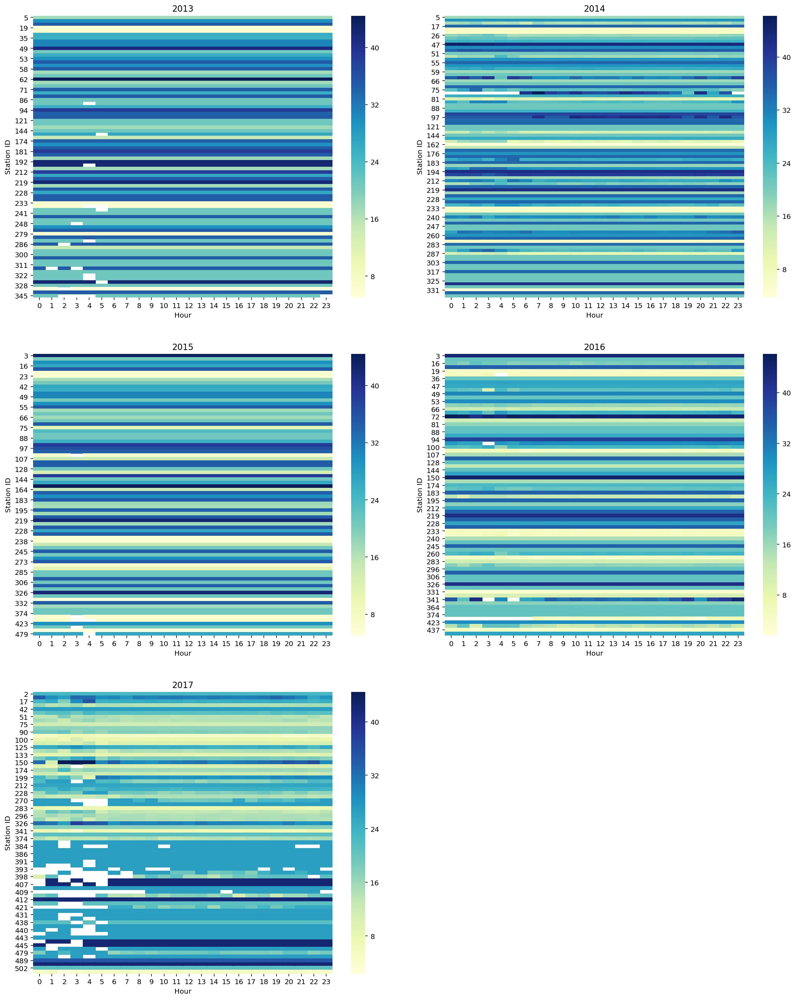

In [441]:
fig = plt.figure(figsize=(20,25))

ax1 = fig.add_subplot(321)
ax2 = fig.add_subplot(322)
ax3 = fig.add_subplot(323)
ax4 = fig.add_subplot(324)
ax5 = fig.add_subplot(325)

fig.subplots_adjust(hspace=0.2, wspace=0.1)

df13 = stnOriginDestUtil[(stnOriginDestUtil['Year'] == 2013)&(stnOriginDestUtil['Utilization'] > 0)&(stnOriginDestUtil['Utilization'] < 50)].pivot_table(index='Station ID', columns='Hour', values='Utilization')

df14 = stnOriginDestUtil[(stnOriginDestUtil['Year'] == 2014)&(stnOriginDestUtil['Utilization'] > 0)&(stnOriginDestUtil['Utilization'] < 50)].pivot_table(index='Station ID', columns='Hour', values='Utilization')

df15 = stnOriginDestUtil[(stnOriginDestUtil['Year'] == 2015)&(stnOriginDestUtil['Utilization'] > 0)&(stnOriginDestUtil['Utilization'] < 50)].pivot_table(index='Station ID', columns='Hour', values='Utilization')

df16 = stnOriginDestUtil[(stnOriginDestUtil['Year'] == 2016)&(stnOriginDestUtil['Utilization'] > 0)&(stnOriginDestUtil['Utilization'] < 50)].pivot_table(index='Station ID', columns='Hour', values='Utilization')

df17 = stnOriginDestUtil[(stnOriginDestUtil['Year'] == 2017)&(stnOriginDestUtil['Utilization'] > 0)&(stnOriginDestUtil['Utilization'] < 50)].pivot_table(index='Station ID', columns='Hour', values='Utilization')

ax1=sns.heatmap(df13, annot=False, cmap='YlGnBu',fmt=".1f",ax=ax1,label='2013')
ax1.set_title('2013')
ax2=sns.heatmap(df14, annot=False, cmap='YlGnBu',fmt=".1f",ax=ax2,label='2014')
ax2.set_title('2014')
ax3=sns.heatmap(df15, annot=False, cmap='YlGnBu',fmt=".1f",ax=ax3,label='2015')
ax3.set_title('2015')
ax4=sns.heatmap(df16, annot=False, cmap='YlGnBu',fmt=".1f",ax=ax4,label='2016')
ax4.set_title('2016')
ax5=sns.heatmap(df17, annot=False, cmap='YlGnBu',fmt=".1f",ax=ax5,label='2017')
ax5.set_title('2017')

plt.show()


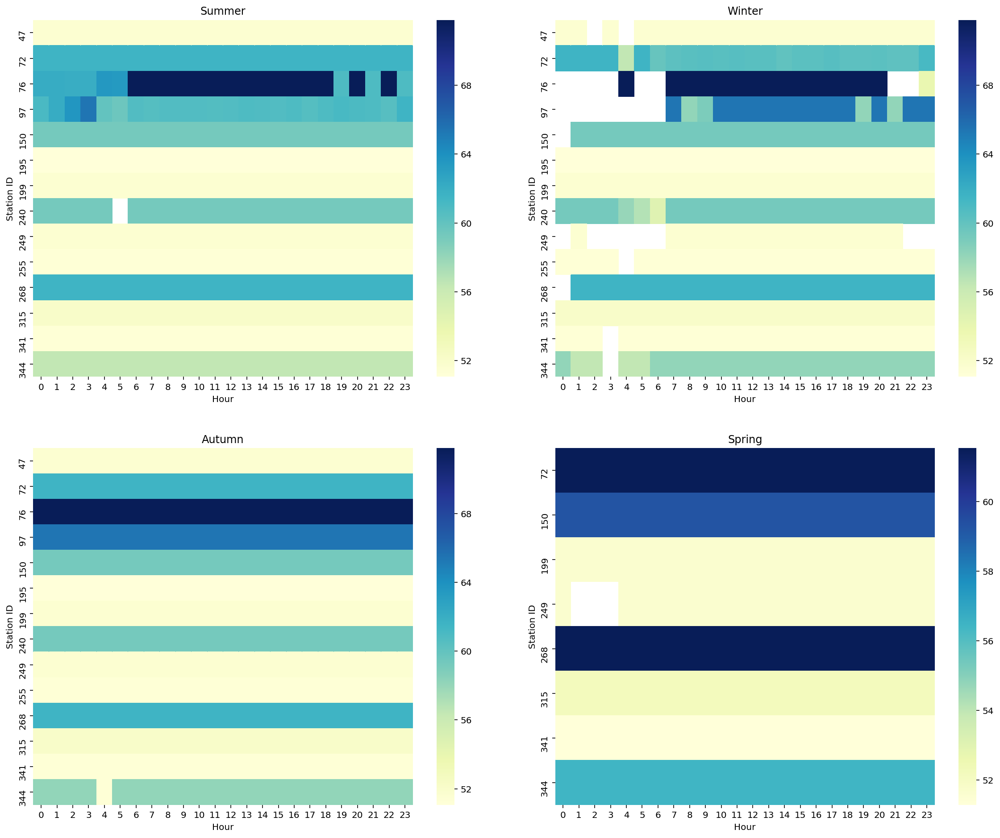

In [442]:
fig = plt.figure(figsize=(20,25))

ax1 = fig.add_subplot(321)
ax2 = fig.add_subplot(322)
ax3 = fig.add_subplot(323)
ax4 = fig.add_subplot(324)


fig.subplots_adjust(hspace=0.2, wspace=0.1)

dfSummer = stnOriginDestUtil[(stnOriginDestUtil['season'] == 'Summer')&(stnOriginDestUtil['Utilization'] > 50)].pivot_table(index='Station ID', columns='Hour', values='Utilization')

dfWinter = stnOriginDestUtil[(stnOriginDestUtil['season'] == 'Winter')&(stnOriginDestUtil['Utilization'] > 50)].pivot_table(index='Station ID', columns='Hour', values='Utilization')

dfAutumn = stnOriginDestUtil[(stnOriginDestUtil['season'] == 'Autumn')&(stnOriginDestUtil['Utilization'] > 50)].pivot_table(index='Station ID', columns='Hour', values='Utilization')

dfSpring = stnOriginDestUtil[(stnOriginDestUtil['season'] == 'Spring')&(stnOriginDestUtil['Utilization'] > 50)].pivot_table(index='Station ID', columns='Hour', values='Utilization')

ax1=sns.heatmap(dfSummer, annot=False, cmap='YlGnBu',fmt=".1f",ax=ax1)
ax1.set_title('Summer')
ax2=sns.heatmap(dfWinter, annot=False, cmap='YlGnBu',fmt=".1f",ax=ax2)
ax2.set_title('Winter')
ax3=sns.heatmap(dfAutumn, annot=False, cmap='YlGnBu',fmt=".1f",ax=ax3)
ax3.set_title('Autumn')
ax4=sns.heatmap(dfSpring, annot=False, cmap='YlGnBu',fmt=".1f",ax=ax4)
ax4.set_title('Spring')


plt.show()


## Bike Departure and Arrival Locations

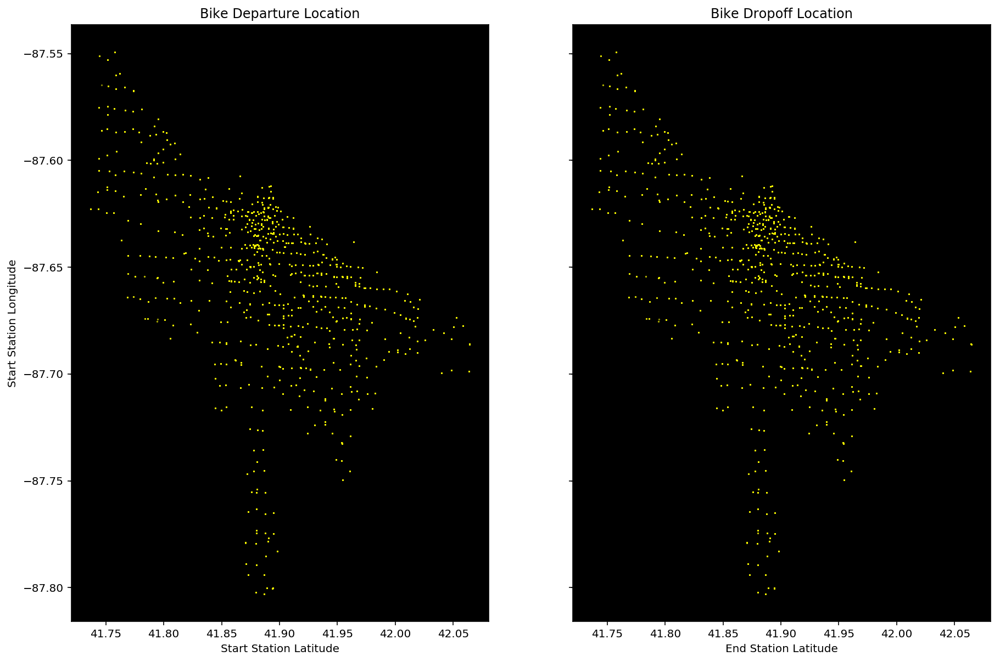

In [99]:
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True,figsize=(15,10))

divvyRoutes = pd.DataFrame()
divvyRoutes["Start Time"] = pd.to_datetime(divvyTrips["starttime"])
divvyRoutes["Stop Time"] = pd.to_datetime(divvyTrips["starttime"])
divvyRoutes["Hour"] = divvyTrips["Hour"]
divvyRoutes["Start Station Latitude"] = divvyTrips["latitude_start"]
divvyRoutes["Start Station Longitude"] = divvyTrips["longitude_start"]
divvyRoutes["End Station Latitude"] = divvyTrips["latitude_end"]
divvyRoutes["End Station Longitude"] = divvyTrips["longitude_end"]
divvyRoutes["Start Station Name"] = divvyTrips["from_station_name"]
divvyRoutes["Start Station ID"] = divvyTrips["from_station_id"]
divvyRoutes["End Station ID"] = divvyTrips["to_station_id"]


locations = divvyRoutes.groupby(["Hour","Start Station Latitude"
                                                       ,"Start Station Longitude"
                                                       ,"End Station Latitude"
                                                       ,"End Station Longitude"
                                                       ,"Start Station Name"
                                                       ,"Start Station ID"
                                                       ,"End Station ID"]).size().drop_duplicates()

divvyRoutes.plot(kind='scatter', x='Start Station Latitude', y='Start Station Longitude',
                color='yellow', 
                s=.02, alpha=.6, subplots=True, ax=ax1)
ax1.set_title("Bike Departure Location")
ax1.set_facecolor('black')

divvyRoutes.plot(kind='scatter', x='End Station Latitude', y='End Station Longitude',
                color='yellow', 
                s=.02, alpha=.6, subplots=True, ax=ax2)
ax2.set_title("Bike Dropoff Location")
ax2.set_facecolor('black') 

## Trips by Zipcode

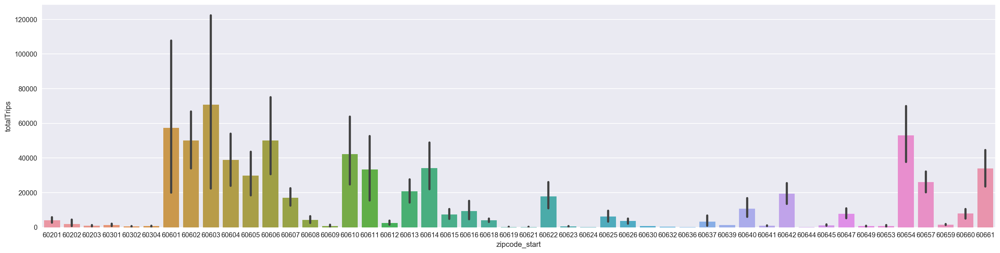

In [192]:
fig = plt.figure(figsize=(25,6))

zipcodeByStation = divvyTrips.groupby(['from_station_id','zipcode_start'],as_index=False).agg({"trip_id":"count"})
zipcodeByStation['zipcode_start'] = zipcodeByStation['zipcode_start'].apply(int)
zipcodeByStation.rename(columns={'trip_id': 'totalTrips'},inplace=True)

ax = sns.barplot(x="zipcode_start", y="totalTrips", data=zipcodeByStation)

In [ ]:
## Stations of interest 